#### Preprocessing, Spatial Analysis Exportation and Visualization: Intersection of HIV and COVID-19 Epidemics in California
Datasets for HIV which includes case counts, new cases, PrEP users, and rates for each as well as datasets for COVID-19 which includes cases, tests, and vaccinations were pre-processed including feature engineering to determine rates for COVID-19 prior to exporatory spatial data analysis (ESDA). The Social Vulnerability Index (SVI) geospatial data which contained county data by postal code was used to perform spatial join for the analysis. Spatial clustering, outlier detection, and local indicator of spatial autocorrelation (LISA) were calculated to create an interactive visualization showing significant spatial clusters or outliers in different regions or counties for HIV infection rate and COVID-19 infection rate. Lastly, using spatial weights, agglomerative cluster analysis was performed with 7 clusters showing key areas of California that experience higher social vulnerability regarding racial and ethnic minority status, socioeconomic status, and the exasperation of the spread of HIV and COVID-19.  

In [87]:
import warnings 
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [216]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import seaborn as sns
from geopy.geocoders import Nominatim
import folium
from pysal.lib import weights
from pysal.explore import esda
from sklearn import cluster

In [2]:
%pwd

'/Users/cl/Documents/GEO448/Project'

In [3]:
# display all columns for every dataframe
pd.set_option("display.max_columns", 999)

## Data Pre-Processing

### HIV Data

#### Load HIV Data Sets

In [335]:
# HIV-Dataset1: New HIV Cases by County
new_hiv_data = pd.read_excel('/Users/cl/Documents/GEO448/Project/AIDSVu_County_NewDX_2020.xlsx', header=3)
new_hiv_data

,GEO ID,Year,State Abbreviation,State,County Name,New Diagnoses Rate,New Diagnoses Rate Stability,New Diagnoses Cases,New Diagnoses Male Rate,New Diagnoses Male Rate Stability,New Diagnoses Male Cases,New Diagnoses Female Rate,New Diagnoses Female Rate Stability,New Diagnoses Female Cases,New Diagnoses Black Rate,New Diagnoses Black Rate Stability,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Rate Stability,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Rate Stability,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Rate Stability,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Rate Stability,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Rate Stability,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate Stability,New Diagnoses Native Hawaiian/Pacific Islander Cases,New Diagnoses Age 13-24 Rate,New Diagnoses Age 13-24 Rate Stability,New Diagnoses Age 13-24 Cases,New Diagnoses Age 25-34 Rate,New Diagnoses Age 25-34 Rate Stability,New Diagnoses Age 25-34 Cases,New Diagnoses Age 35-44 Rate,New Diagnoses Age 35-44 Rate Stability,New Diagnoses Age 35-44 Cases,New Diagnoses Age 45-54 Rate,New Diagnoses Age 45-54 Rate Stability,New Diagnoses Age 45-54 Cases,New Diagnoses Age 55+ Rate,New Diagnoses Age 55+ Rate Stability,New Diagnoses Age 55+ Cases,New Diagnoses Heterosexual Contact Percent,New Diagnoses Heterosexual Contact Cases,New Diagnoses IDU Percent,New Diagnoses IDU Cases,New Diagnoses Other Transmission Category Percent,New Diagnoses Other Transmission Category Cases,New Diagnoses MSM Rate,New Diagnoses MSM Percent,New Diagnoses MSM Cases,New Diagnoses MSM/IDU Percent,New Diagnoses MSM/IDU Cases,2013 NCHS Urbanicity Code
0,1001,2020,AL,Alabama,Autauga County,17.0,N,8,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,0.0,N,0,0.0,N,0,0.0,N,0,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,0.0,N,0,-1.0,-1,0.0,0,0.0,0,-1.0,-1.0,-1,0.0,0,3
1,1003,2020,AL,Alabama,Baldwin County,5.1,N,10,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,3.0,N,5,-1.0,-9,-1,0.0,N,0,0.0,N,0,0.0,N,0,-1.0,-9,-1,0.0,N,0,27.5,N,7,-1.0,-9,-1,-1.0,-9,-1,0.0,N,0,-1.0,-1,0.0,0,0.0,0,0.6,-1.0,8,-1.0,-1,4
2,1005,2020,AL,Alabama,Barbour County,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1.0,-1,-1.0,-1,6
3,1007,2020,AL,Alabama,Bibb County,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1.0,-1,-1.0,-1,2
4,1009,2020,AL,Alabama,Blount County,0.0,N,0,0.0,N,0,0.0,N,0,0.0,N,0,0.0,N,0,0.0,N,0,0.0,N,0,-1.0,-9,-1,0.0,N,0,-1.0,-9,-1,0.0,N,0,0.0,N,0,0.0,N,0,0.0,N,0,0.0,N,0,0.0,0,0.0,0,0.0,0,0.0,0.0,0,0.0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3216,72145,2020,PR,Puerto Rico,Vega Baja Municipio,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1.0,-1,-1.0,-1,-9
3217,72147,2020,PR,Puerto Rico,Vieques Municipio,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1.0,-1,-1.0,-1,-9
3218,72149,2020,PR,Puerto Rico,Villalba Municipio,0.0,N,0,0.0,N,0,0.0,N,0,-1.0,N,0,-1.0,N,0,-1.0,N,0,-1.0,N,0,-1.0,N,0,-1.0,N,0,-

In [336]:
# Sort by New Diagnoses Cases and Verify Top 20 counties in the U.S. with highest number of new cases:
new_hiv_data.sort_values(by=['New Diagnoses Cases'], ascending=False).head(20)

,GEO ID,Year,State Abbreviation,State,County Name,New Diagnoses Rate,New Diagnoses Rate Stability,New Diagnoses Cases,New Diagnoses Male Rate,New Diagnoses Male Rate Stability,New Diagnoses Male Cases,New Diagnoses Female Rate,New Diagnoses Female Rate Stability,New Diagnoses Female Cases,New Diagnoses Black Rate,New Diagnoses Black Rate Stability,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Rate Stability,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Rate Stability,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Rate Stability,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Rate Stability,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Rate Stability,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate Stability,New Diagnoses Native Hawaiian/Pacific Islander Cases,New Diagnoses Age 13-24 Rate,New Diagnoses Age 13-24 Rate Stability,New Diagnoses Age 13-24 Cases,New Diagnoses Age 25-34 Rate,New Diagnoses Age 25-34 Rate Stability,New Diagnoses Age 25-34 Cases,New Diagnoses Age 35-44 Rate,New Diagnoses Age 35-44 Rate Stability,New Diagnoses Age 35-44 Cases,New Diagnoses Age 45-54 Rate,New Diagnoses Age 45-54 Rate Stability,New Diagnoses Age 45-54 Cases,New Diagnoses Age 55+ Rate,New Diagnoses Age 55+ Rate Stability,New Diagnoses Age 55+ Cases,New Diagnoses Heterosexual Contact Percent,New Diagnoses Heterosexual Contact Cases,New Diagnoses IDU Percent,New Diagnoses IDU Cases,New Diagnoses Other Transmission Category Percent,New Diagnoses Other Transmission Category Cases,New Diagnoses MSM Rate,New Diagnoses MSM Percent,New Diagnoses MSM Cases,New Diagnoses MSM/IDU Percent,New Diagnoses MSM/IDU Cases,2013 NCHS Urbanicity Code
205,6037,2020,CA,California,Los Angeles County,16.4,Y,1382,30.0,Y,1239,3.3,Y,143,42.8,Y,295,11.5,Y,265,18.4,Y,724,4.3,Y,56,24.2,N,4,23.0,Y,37,5.2,N,1,14.6,Y,220,34.8,Y,565,21.3,Y,291,15.2,Y,197,4.1,Y,109,9.8,136,5.1,70,0.1,2,0.6,90.2,1118,4.5,56,1
2624,48201,2020,TX,Texas,Harris County,24.0,Y,921,41.0,Y,777,7.4,Y,144,58.0,Y,425,9.2,Y,106,22.4,Y,360,5.2,Y,15,13.2,N,1,29.5,Y,13,50.4,N,1,29.9,Y,234,46.1,Y,347,23.9,Y,163,16.1,Y,94,8.0,Y,83,18.7,172,3.8,35,0.3,3,0.6,89.4,695,2.1,16,1
363,12086,2020,FL,Florida,Miami-Dade County,33.7,Y,781,59.6,Y,666,9.6,Y,115,55.4,Y,188,22.3,Y,66,31.9,Y,519,8.2,N,3,50.2,N,1,20.9,N,3,182.8,N,1,25.7,Y,96,66.5,Y,251,53.8,Y,198,31.4,Y,121,14.2,Y,115,23.7,185,1.7,13,0.0,0,0.7,86.8,578,0.8,5,1
611,17031,2020,IL,Illinois,Cook County,17.9,Y,774,31.4,Y,653,5.4,Y,121,45.1,Y,444,5.3,Y,100,17.4,Y,182,4.9,Y,17,58.2,N,3,50.2,Y,28,0.0,N,0,26.5,Y,198,34.7,Y,289,19.2,Y,134,12.3,Y,77,5.4,Y,76,16.5,128,5.2,40,1.3,10,0.4,88.4,577,2.9,19,1
2580,48113,2020,TX,Texas,Dallas County,30.6,Y,658,50.5,Y,531,11.6,Y,127,63.6,Y,314,16.2,Y,106,25.8,Y,212,5.4,N,8,0.0,N,0,66.6,Y,17,101.3,N,1,31.4,Y,137,56.2,Y,248,35.0,Y,126,30.6,Y,98,8.3,Y,49,21.6,142,5.3,35,0.2,1,0.5,87.0,462,3.4,18,1
104,4013,2020,AZ,Arizona,Maricopa County,12.5,Y,477,21.8,Y,411,3.4,Y,66,36.7,Y,78,8.0,Y,175,16.4,Y,182,5.2,N,9,29.1,Y,18,14.0,N,10,65.4,N,5,13.0,Y,95,29.1,Y,196,12.4,Y,74,10.8,Y,61,4.0,Y,51,12.6,60,7.8,37,0.2,1,0.4,83.2,342,9.2,38,1
447,13121,2020,GA,Georgia,Fulton County,52.0,Y,477,93.8,Y,412,13.6,Y,65,97.0,Y,380,15.1,Y,57,47.7,Y,29,0.0,N,0,77.7,N,1,59.8,N,9,589.5,N,1,58.5,Y,102,113.6,Y,214,43.9,Y,67,36.4,Y,53,16.0,Y,41,20.3,97,1.5,7,0.2,1,0.7,87.1,359,3.2,13,1
326,12011,2020,FL,Florida,Broward County,27.6,Y,460,46.2,Y,372,10.2,Y,88,48.3,Y,221,15.9,Y,95,24.8,Y,129,14.3,N,9,30.5,N,1,21.8,N,5,0.0,N,0,26.8,Y,71,49.5,Y,129,40.2,Y,106,29.9,Y,79,12.3,Y,75,39.8,183,4.8,22,0.0,0,0.4,66.1,246,2.2,8,2
1852,36047,2020,NY,New York,Kings County,21.0,Y,444,34.8,Y,342,9.1,Y,102,42.3,Y,270,6.8,Y,53,25.2,Y,98,2.6,N,7,0.0,N,0,46.7,Y,16,0.0,N,0,25.1,Y,85,36.1,Y,1

Above, three counties in California are among the top 20 counties with the highest new cases of HIV infection with Los Angeles leading in the epidemic. Next, we will extract data for California only and look at counties in California specifically. 

In [337]:
# Extract data for California Only:
cond = new_hiv_data['State'] == 'California'
ca_new_hiv_data = new_hiv_data[cond]
ca_new_hiv_data

,GEO ID,Year,State Abbreviation,State,County Name,New Diagnoses Rate,New Diagnoses Rate Stability,New Diagnoses Cases,New Diagnoses Male Rate,New Diagnoses Male Rate Stability,New Diagnoses Male Cases,New Diagnoses Female Rate,New Diagnoses Female Rate Stability,New Diagnoses Female Cases,New Diagnoses Black Rate,New Diagnoses Black Rate Stability,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Rate Stability,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Rate Stability,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Rate Stability,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Rate Stability,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Rate Stability,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate Stability,New Diagnoses Native Hawaiian/Pacific Islander Cases,New Diagnoses Age 13-24 Rate,New Diagnoses Age 13-24 Rate Stability,New Diagnoses Age 13-24 Cases,New Diagnoses Age 25-34 Rate,New Diagnoses Age 25-34 Rate Stability,New Diagnoses Age 25-34 Cases,New Diagnoses Age 35-44 Rate,New Diagnoses Age 35-44 Rate Stability,New Diagnoses Age 35-44 Cases,New Diagnoses Age 45-54 Rate,New Diagnoses Age 45-54 Rate Stability,New Diagnoses Age 45-54 Cases,New Diagnoses Age 55+ Rate,New Diagnoses Age 55+ Rate Stability,New Diagnoses Age 55+ Cases,New Diagnoses Heterosexual Contact Percent,New Diagnoses Heterosexual Contact Cases,New Diagnoses IDU Percent,New Diagnoses IDU Cases,New Diagnoses Other Transmission Category Percent,New Diagnoses Other Transmission Category Cases,New Diagnoses MSM Rate,New Diagnoses MSM Percent,New Diagnoses MSM Cases,New Diagnoses MSM/IDU Percent,New Diagnoses MSM/IDU Cases,2013 NCHS Urbanicity Code
187,6001,2020,CA,California,Alameda County,11.1,Y,157,19.9,Y,138,2.6,Y,19,34.4,Y,50,6.0,Y,27,18.2,Y,54,3.9,Y,18,0.0,N,0,10.0,N,5,26.2,N,3,10.7,Y,24,26.2,Y,72,10.1,Y,26,7.4,Y,16,4.3,Y,19,15.9,25,6.4,10,0.0,0,0.3,85.5,118,2.9,4,1
188,6003,2020,CA,California,Alpine County,0.0,N,0,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2.0,-2,-2.0,-2,6
189,6005,2020,CA,California,Amador County,-1.0,-9,-1,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2.0,-2,-2.0,-2,6
190,6007,2020,CA,California,Butte County,5.5,N,10,-1.0,-9,-1,-1.0,-9,-1,0.0,N,0,6.1,N,8,-1.0,-9,-1,0.0,N,0,0.0,N,0,0.0,N,0,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-9,-1,-1.0,-1,-1.0,-1,0.0,0,0.2,-1.0,5,0.0,0,4
191,6009,2020,CA,California,Calaveras County,-1.0,-9,-1,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2.0,-2,-2.0,-2,6
192,6011,2020,CA,California,Colusa County,0.0,N,0,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2.0,-2,-2.0,-2,6
193,6013,2020,CA,California,Contra Costa County,7.4,Y,72,13.1,Y,62,2.0,N,10,25.7,Y,22,4.2,Y,18,8.8,Y,21,4.4,N,8,0.0,N,0,5.9,N,2,21.3,N,1,5.3,N,9,22.7,Y,33,7.6,Y,12,7.0,N,11,2.0,N,7,15.3,11,1.4,1,0.0,0,0.1,91.9,57,3.2,2,2
194,6015,2020,CA,California,Del Norte County,0.0,N,0,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-9,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2.0,-2,-2.0,-2,5
195,6017,2020,CA,California,El Dorado County,3.6,N,6,-1.0,-9,-1,-1.0,-9,-1,0.0,N,0,-1.0,-9,-1,-1.0,-9,-1,0.0,

In [338]:
# Sort New Hiv Data in CA by New Diagnoses Cases:
ca_new_hiv_data.sort_values(by=['New Diagnoses Cases'], ascending=False)

,GEO ID,Year,State Abbreviation,State,County Name,New Diagnoses Rate,New Diagnoses Rate Stability,New Diagnoses Cases,New Diagnoses Male Rate,New Diagnoses Male Rate Stability,New Diagnoses Male Cases,New Diagnoses Female Rate,New Diagnoses Female Rate Stability,New Diagnoses Female Cases,New Diagnoses Black Rate,New Diagnoses Black Rate Stability,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Rate Stability,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Rate Stability,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Rate Stability,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Rate Stability,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Rate Stability,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate Stability,New Diagnoses Native Hawaiian/Pacific Islander Cases,New Diagnoses Age 13-24 Rate,New Diagnoses Age 13-24 Rate Stability,New Diagnoses Age 13-24 Cases,New Diagnoses Age 25-34 Rate,New Diagnoses Age 25-34 Rate Stability,New Diagnoses Age 25-34 Cases,New Diagnoses Age 35-44 Rate,New Diagnoses Age 35-44 Rate Stability,New Diagnoses Age 35-44 Cases,New Diagnoses Age 45-54 Rate,New Diagnoses Age 45-54 Rate Stability,New Diagnoses Age 45-54 Cases,New Diagnoses Age 55+ Rate,New Diagnoses Age 55+ Rate Stability,New Diagnoses Age 55+ Cases,New Diagnoses Heterosexual Contact Percent,New Diagnoses Heterosexual Contact Cases,New Diagnoses IDU Percent,New Diagnoses IDU Cases,New Diagnoses Other Transmission Category Percent,New Diagnoses Other Transmission Category Cases,New Diagnoses MSM Rate,New Diagnoses MSM Percent,New Diagnoses MSM Cases,New Diagnoses MSM/IDU Percent,New Diagnoses MSM/IDU Cases,2013 NCHS Urbanicity Code
205,6037,2020,CA,California,Los Angeles County,16.4,Y,1382,30.0,Y,1239,3.3,Y,143,42.8,Y,295,11.5,Y,265,18.4,Y,724,4.3,Y,56,24.2,N,4,23.0,Y,37,5.2,N,1,14.6,Y,220,34.8,Y,565,21.3,Y,291,15.2,Y,197,4.1,Y,109,9.8,136,5.1,70,0.1,2,0.6,90.2,1118,4.5,56,1
223,6073,2020,CA,California,San Diego County,10.5,Y,296,18.1,Y,257,2.8,Y,39,32.7,Y,44,6.2,Y,81,17.3,Y,157,2.0,N,7,0.0,N,0,8.6,N,7,0.0,N,0,6.5,Y,34,21.2,Y,116,16.0,Y,73,12.2,Y,49,2.7,Y,24,12.2,36,8.1,24,0.3,1,0.4,88.3,227,3.5,9,1
216,6059,2020,CA,California,Orange County,9.8,Y,264,17.7,Y,233,2.3,Y,31,30.2,Y,14,6.5,Y,72,16.9,Y,145,4.5,Y,27,0.0,N,0,8.0,N,5,13.3,N,1,9.8,Y,47,23.5,Y,108,12.2,Y,50,6.3,Y,27,3.5,Y,32,15.5,41,7.2,19,0.0,0,0.4,82.0,191,6.0,14,1
222,6071,2020,CA,California,San Bernardino County,14.7,Y,263,25.7,Y,227,4.0,Y,36,32.8,Y,48,8.7,Y,44,16.3,Y,154,7.7,N,11,0.0,N,0,15.5,N,5,18.2,N,1,15.3,Y,58,32.4,Y,110,16.3,Y,47,8.8,Y,23,4.9,Y,25,11.8,31,7.6,20,0.4,1,0.4,86.3,196,6.6,15,2
219,6065,2020,CA,California,Riverside County,11.6,Y,239,21.1,Y,216,2.2,Y,23,24.1,Y,32,9.3,Y,68,12.4,Y,123,6.9,N,10,0.0,N,0,14.7,N,6,0.0,N,0,9.1,Y,38,28.1,Y,98,13.2,Y,43,10.3,Y,31,4.3,Y,29,8.4,20,3.8,9,0.4,1,0.4,95.8,207,1.4,3,1
201,6029,2020,CA,California,Kern County,22.3,Y,160,38.8,Y,142,5.1,Y,18,50.0,Y,19,16.5,Y,41,25.3,Y,95,10.8,N,4,0.0,N,0,8.5,N,1,0.0,N,0,21.7,Y,35,44.7,Y,63,25.5,Y,30,19.4,Y,19,6.6,Y,13,7.5,12,13.1,21,0.0,0,1.5,85.2,121,4.9,7,3
187,6001,2020,CA,California,Alameda County,11.1,Y,157,19.9,Y,138,2.6,Y,19,34.4,Y,50,6.0,Y,27,18.2,Y,54,3.9,Y,18,0.0,N,0,10.0,N,5,26.2,N,3,10.7,Y,24,26.2,Y,72,10.1,Y,26,7.4,Y,16,4.3,Y,19,15.9,25,6.4,10,0.0,0,0.3,85.5,118,2.9,4,1
224,6075,2020,CA,California,San Francisco County,19.6,Y,153,33.8,Y,134,5.0,Y,19,69.1,Y,27,14.2,Y,45,54.5,Y,61,5.6,Y,16,130.3,N,2,4.3,N,1,35.1,N,1,19.4,Y,17,28.2,Y,56,24.5,Y,34,26.3,Y,29,7.0,Y,17,7.8,12,11.1,17,0.0,0,0.2,81.3,109,11.9,16,1
220,6067,2020,CA,California,Sacramento County,11.8,Y,153,19.5,Y,123,4.5,Y,30,43.5,Y,55,7.8,Y,46,11.4,Y,33,5.0,N,11,15.0,N,1,11.2,N,6,6.5,N,1,10.0,Y,23,19.5,Y,48,16.3,Y,35,12.7,Y,24,5.5,Y,23,19.

In [339]:
# Get the Top 5 Counties with the highest number of new HIV cases:
ca_new_hiv_data.sort_values(by=['New Diagnoses Cases'], ascending=False).head(5)

,GEO ID,Year,State Abbreviation,State,County Name,New Diagnoses Rate,New Diagnoses Rate Stability,New Diagnoses Cases,New Diagnoses Male Rate,New Diagnoses Male Rate Stability,New Diagnoses Male Cases,New Diagnoses Female Rate,New Diagnoses Female Rate Stability,New Diagnoses Female Cases,New Diagnoses Black Rate,New Diagnoses Black Rate Stability,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Rate Stability,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Rate Stability,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Rate Stability,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Rate Stability,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Rate Stability,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate Stability,New Diagnoses Native Hawaiian/Pacific Islander Cases,New Diagnoses Age 13-24 Rate,New Diagnoses Age 13-24 Rate Stability,New Diagnoses Age 13-24 Cases,New Diagnoses Age 25-34 Rate,New Diagnoses Age 25-34 Rate Stability,New Diagnoses Age 25-34 Cases,New Diagnoses Age 35-44 Rate,New Diagnoses Age 35-44 Rate Stability,New Diagnoses Age 35-44 Cases,New Diagnoses Age 45-54 Rate,New Diagnoses Age 45-54 Rate Stability,New Diagnoses Age 45-54 Cases,New Diagnoses Age 55+ Rate,New Diagnoses Age 55+ Rate Stability,New Diagnoses Age 55+ Cases,New Diagnoses Heterosexual Contact Percent,New Diagnoses Heterosexual Contact Cases,New Diagnoses IDU Percent,New Diagnoses IDU Cases,New Diagnoses Other Transmission Category Percent,New Diagnoses Other Transmission Category Cases,New Diagnoses MSM Rate,New Diagnoses MSM Percent,New Diagnoses MSM Cases,New Diagnoses MSM/IDU Percent,New Diagnoses MSM/IDU Cases,2013 NCHS Urbanicity Code
205,6037,2020,CA,California,Los Angeles County,16.4,Y,1382,30.0,Y,1239,3.3,Y,143,42.8,Y,295,11.5,Y,265,18.4,Y,724,4.3,Y,56,24.2,N,4,23.0,Y,37,5.2,N,1,14.6,Y,220,34.8,Y,565,21.3,Y,291,15.2,Y,197,4.1,Y,109,9.8,136,5.1,70,0.1,2,0.6,90.2,1118,4.5,56,1
223,6073,2020,CA,California,San Diego County,10.5,Y,296,18.1,Y,257,2.8,Y,39,32.7,Y,44,6.2,Y,81,17.3,Y,157,2.0,N,7,0.0,N,0,8.6,N,7,0.0,N,0,6.5,Y,34,21.2,Y,116,16.0,Y,73,12.2,Y,49,2.7,Y,24,12.2,36,8.1,24,0.3,1,0.4,88.3,227,3.5,9,1
216,6059,2020,CA,California,Orange County,9.8,Y,264,17.7,Y,233,2.3,Y,31,30.2,Y,14,6.5,Y,72,16.9,Y,145,4.5,Y,27,0.0,N,0,8.0,N,5,13.3,N,1,9.8,Y,47,23.5,Y,108,12.2,Y,50,6.3,Y,27,3.5,Y,32,15.5,41,7.2,19,0.0,0,0.4,82.0,191,6.0,14,1
222,6071,2020,CA,California,San Bernardino County,14.7,Y,263,25.7,Y,227,4.0,Y,36,32.8,Y,48,8.7,Y,44,16.3,Y,154,7.7,N,11,0.0,N,0,15.5,N,5,18.2,N,1,15.3,Y,58,32.4,Y,110,16.3,Y,47,8.8,Y,23,4.9,Y,25,11.8,31,7.6,20,0.4,1,0.4,86.3,196,6.6,15,2
219,6065,2020,CA,California,Riverside County,11.6,Y,239,21.1,Y,216,2.2,Y,23,24.1,Y,32,9.3,Y,68,12.4,Y,123,6.9,N,10,0.0,N,0,14.7,N,6,0.0,N,0,9.1,Y,38,28.1,Y,98,13.2,Y,43,10.3,Y,31,4.3,Y,29,8.4,20,3.8,9,0.4,1,0.4,95.8,207,1.4,3,1


Above, the top 5 counties in California with the highest new cases of HIV are all counties in Southern California with Los Angeles leading in the epidemic at 1,382 new cases in 2020. Moreover, Southern California may be an area of high transmission of new HIV cases. 

In [340]:
# Check Variables and Data Types:
ca_new_hiv_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 187 to 244
Data columns (total 62 columns):
 #   Column                                                         Non-Null Count  Dtype  
---  ------                                                         --------------  -----  
 0   GEO ID                                                         58 non-null     int64  
 1   Year                                                           58 non-null     int64  
 2   State Abbreviation                                             58 non-null     object 
 3   State                                                          58 non-null     object 
 4   County Name                                                    58 non-null     object 
 5   New Diagnoses Rate                                             58 non-null     float64
 6   New Diagnoses Rate Stability                                   58 non-null     object 
 7   New Diagnoses Cases                                          

In [341]:
#Extract Columns and Variables to Keep:
ca_new_hiv_df = ca_new_hiv_data.iloc[:,[0,1,3,4,5,7,14,16,17,19,20,22,23,25,26,28,29,31,32,34]]
ca_new_hiv_df

,GEO ID,Year,State,County Name,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases
187,6001,2020,California,Alameda County,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3
188,6003,2020,California,Alpine County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
189,6005,2020,California,Amador County,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
190,6007,2020,California,Butte County,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1
191,6009,2020,California,Calaveras County,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
192,6011,2020,California,Colusa County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
193,6013,2020,California,Contra Costa County,7.4,72,25.7,22,4.2,18,8.8,21,4.4,8,0.0,0,5.9,2,21.3,1
194,6015,2020,California,Del Norte County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
195,6017,2020,California,El Dorado County,3.6,6,0.0,0,-1.0,-1,-1.0,-1,0.0,0,0.0,0,0.0,0,0.0,0
196,6019,2020,California,Fresno County,15.0,120,32.2,12,10.6,26,18.3,75,5.8,5,20.1,1,7.9,1,0.0,0


In [342]:
# Recheck Dataframe Info:
ca_new_hiv_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 187 to 244
Data columns (total 20 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   GEO ID                                                58 non-null     int64  
 1   Year                                                  58 non-null     int64  
 2   State                                                 58 non-null     object 
 3   County Name                                           58 non-null     object 
 4   New Diagnoses Rate                                    58 non-null     float64
 5   New Diagnoses Cases                                   58 non-null     int64  
 6   New Diagnoses Black Rate                              58 non-null     float64
 7   New Diagnoses Black Cases                             58 non-null     int64  
 8   New Diagnoses White Rate                              58 no

#### Current HIV Data (Invididuals Living with HIV)



In [343]:
# HIV-Dataset2: Current (On-Going) HIV Cases by County
hiv_data = pd.read_excel('/Users/cl/Documents/GEO448/Project/AIDSVu_County_Prev_2020.xlsx', header=3)
hiv_data

,GEO ID,State Abbreviation,State,County Name,Year,County Rate,County Rate Stability,County Cases,Male Rate,Male Rate Stability,Male Cases,Female Rate,Female Rate Stability,Female Cases,Black Rate,Black Rate Stability,Black Cases,White Rate,White Rate Stability,White Cases,Hispanic Rate,Hispanic Rate Stability,Hispanic Cases,Age 13-24 Rate,Age 13-24 Rate Stability,Age 13-24 Cases,Age 25-34 Rate,Age 25-34 Rate Stability,Age 25-34 Cases,Age 35-44 Rate,Age 35-44 Rate Stability,Age 35-44 Cases,Age 45-54 Rate,Age 45-54 Rate Stability,Age 45-54 Cases,Age 55+ Rate,Age 55+ Rate Stability,Age 55+ Cases,MSM Rate,MSM Percent,Male and IDU Percent,MSM/IDU Percent,Male and Heterosexual Contact Percent,Female and IDU Percent,Female and Heterosexual Contact Percent,MSM Cases,Male and IDU Cases,MSM/IDU Cases,Male and Heterosexual Contact Cases,Female and IDU Cases,Female and Heterosexual Contact Cases,Heterosexual Contact Cases,Heterosexual Contact Percent,IDU Cases,IDU Percent,Other Transmission Route Cases,Other Transmission Route Percent,Male and Other Transmission Route Cases,Male and Other Transmission Route Percent,Female and Other Transmission Route Cases,Female and Other Transmission Route Percent,Correctional Warning,2013 NCHS Urbanicity Code
0,1001,AL,Alabama,Autauga County,2020,243,Y,114,373,Y,84,123,Y,30,661,Y,62,126,Y,44,-1,-9,-1,97,N,8,267,Y,20,326,Y,24,255,Y,19,261,Y,43,28.3,82.1,-1.0,-1.0,-1.0,-1.0,-1.0,69,-1,-1,-1,-1,-1,28,24.6,13,11.4,-1,-1.0,-1,-1.0,-1,-1.0,0,3
1,1003,AL,Alabama,Baldwin County,2020,176,Y,344,272,Y,254,88,Y,90,705,Y,113,112,Y,185,203,Y,16,20,N,6,220,Y,56,229,Y,63,315,Y,91,154,Y,128,15.8,79.5,-1.0,6.3,-1.0,-1.0,-1.0,202,-1,16,-1,-1,-1,100,29.1,21,6.1,6,1.7,-1,-1.0,-1,-1.0,1,4
2,1005,AL,Alabama,Barbour County,2020,457,Y,96,464,Y,52,448,Y,44,697,Y,69,141,Y,14,-1,-9,-1,-1,-9,-1,265,N,9,916,Y,28,734,Y,22,-1,-9,-1,37.2,61.5,-1.0,9.6,-1.0,-1.0,-1.0,32,-1,5,-1,-1,-1,53,55.2,7,7.3,0,0.0,-1,-1.0,-1,-1.0,1,6
3,1007,AL,Alabama,Bibb County,2020,216,Y,41,-1,-9,-1,-1,-9,-1,566,Y,23,106,Y,15,-1,-9,-1,-1,-9,-1,272,N,9,345,N,10,422,Y,13,-1,-9,-1,17.1,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,32,-1,-1,-1,-1,-1,5,12.2,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,1,2
4,1009,AL,Alabama,Blount County,2020,76,Y,37,105,Y,25,49,Y,12,681,N,5,56,Y,24,-1,-9,-1,-1,-9,-1,72,N,5,130,N,9,158,Y,12,-1,-9,-1,3.8,64.0,-1.0,-1.0,-1.0,-1.0,-1.0,16,-1,-1,-1,-1,-1,11,29.7,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3216,72145,PR,Puerto Rico,Vega Baja Municipio,2020,461,Y,201,693,Y,143,252,Y,58,-1,N,0,-1,-9,-1,-1,Y,199,0,N,0,294,Y,19,624,Y,37,773,Y,49,546,Y,96,-1.0,31.5,37.1,-1.0,24.5,24.1,75.9,45,53,-1,35,14,44,79,39.3,67,33.3,-1,-1.0,-1,-1.0,-1,-1.0,0,-9
3217,72147,PR,Puerto Rico,Vieques Municipio,2020,411,Y,30,678,Y,25,139,N,5,-1,N,0,-1,-9,-1,-1,Y,29,-1,-9,-1,-1,-9,-1,-1,-9,-1,693,N,8,514,Y,17,-1.0,28.0,24.0,24.0,24.0,0.0,100.0,7,6,6,6,0,5,11,36.7,6,20.0,0,0.0,0,0.0,0,0.0,0,-9
3218,72149,PR,Puerto Rico,Villalba Municipio,2020,169,Y,31,229,Y,20,115,N,11,-1,N,0,-1,N,0,-1,Y,31,-1,-9,-1,-1,-9,-1,220,N,5,261,N,7,205,Y,15,-1.0,45.0,25.0,-1.0,-1.0,0.0,90.9,9,5,-1,-1,0,10,14,45.2,5,16.1,-1,-1.0,-1,-1.0,-1,-1.0,0,-9
3219,72151,PR,Puerto Rico,Yabucoa Municipio,2020,313,Y,89,492,Y,67,148,Y,22,-1,N,0,-1,N,0,-1,Y,89,-1,-9,-1,211,N,8,310,N,11,455,Y,19,-1,-9,-1,-1.0,28.4,37.3,7.5,25.4,-1.0,95.5,19,25,5,17,-1,21,38,42.7,26,29.2,0,0.0,0,0.0,0,0.0,0,-9


In [344]:
# Sort by County Rate and Verify Top 20 counties in the U.S. with highest HIV population:
hiv_data.sort_values(by=['County Cases'], ascending=False).head(20)

,GEO ID,State Abbreviation,State,County Name,Year,County Rate,County Rate Stability,County Cases,Male Rate,Male Rate Stability,Male Cases,Female Rate,Female Rate Stability,Female Cases,Black Rate,Black Rate Stability,Black Cases,White Rate,White Rate Stability,White Cases,Hispanic Rate,Hispanic Rate Stability,Hispanic Cases,Age 13-24 Rate,Age 13-24 Rate Stability,Age 13-24 Cases,Age 25-34 Rate,Age 25-34 Rate Stability,Age 25-34 Cases,Age 35-44 Rate,Age 35-44 Rate Stability,Age 35-44 Cases,Age 45-54 Rate,Age 45-54 Rate Stability,Age 45-54 Cases,Age 55+ Rate,Age 55+ Rate Stability,Age 55+ Cases,MSM Rate,MSM Percent,Male and IDU Percent,MSM/IDU Percent,Male and Heterosexual Contact Percent,Female and IDU Percent,Female and Heterosexual Contact Percent,MSM Cases,Male and IDU Cases,MSM/IDU Cases,Male and Heterosexual Contact Cases,Female and IDU Cases,Female and Heterosexual Contact Cases,Heterosexual Contact Cases,Heterosexual Contact Percent,IDU Cases,IDU Percent,Other Transmission Route Cases,Other Transmission Route Percent,Male and Other Transmission Route Cases,Male and Other Transmission Route Percent,Female and Other Transmission Route Cases,Female and Other Transmission Route Percent,Correctional Warning,2013 NCHS Urbanicity Code
205,6037,CA,California,Los Angeles County,2020,595,Y,50243,1078,Y,44579,131,Y,5664,1380,Y,9502,551,Y,12752,599,Y,23584,67,Y,1010,472,Y,7668,754,Y,10295,985,Y,12787,697,Y,18483,19.6,87.6,3.1,6.6,2.3,19.3,76.9,39039,1397,2938,1011,1093,4353,5363,10.7,2490,5.0,413,0.8,194,0.4,218,3.8,0,1
1831,36005,NY,New York,Bronx County,2020,2408,Y,27676,3366,Y,17932,1580,Y,9744,3414,Y,11641,782,Y,852,2150,Y,13697,240,Y,541,1665,Y,3701,2505,Y,4455,3840,Y,6456,3520,Y,12523,52.1,55.5,21.1,8.5,12.5,28.6,67.0,9955,3790,1533,2241,2786,6533,8774,31.7,6576,23.8,838,3.0,414,2.3,425,4.4,0,1
2624,48201,TX,Texas,Harris County,2020,705,Y,27068,1087,Y,20584,333,Y,6484,1742,Y,12760,363,Y,4196,537,Y,8616,128,Y,1003,722,Y,5429,932,Y,6347,1100,Y,6437,756,Y,7852,13.1,78.2,5.1,5.6,10.4,14.4,83.1,16097,1060,1153,2136,936,5391,7527,27.8,1996,7.4,295,1.1,139,0.7,157,2.4,0,1
363,12086,FL,Florida,Miami-Dade County,2020,1147,Y,26559,1796,Y,20059,543,Y,6500,3102,Y,10533,848,Y,2515,803,Y,13045,139,Y,518,877,Y,3311,1256,Y,4621,1702,Y,6563,1425,Y,11546,17.9,74.5,3.9,3.5,17.3,8.6,88.6,14946,784,702,3477,560,5761,9238,34.8,1344,5.1,330,1.2,152,0.8,178,2.7,0,1
1859,36061,NY,New York,New York County,2020,1838,Y,26448,3296,Y,22247,550,Y,4201,4154,Y,7318,1139,Y,7908,2498,Y,8869,142,Y,280,788,Y,2784,1725,Y,4018,3110,Y,5953,2889,Y,13413,26.0,76.9,11.3,5.6,5.4,31.2,64.2,17101,2510,1256,1191,1309,2699,3889,14.7,3819,14.4,383,1.4,190,0.9,194,4.6,0,1
1852,36047,NY,New York,Kings County,2020,1244,Y,26236,1806,Y,17736,754,Y,8500,2242,Y,14295,350,Y,2706,1829,Y,7104,166,Y,564,789,Y,3671,1251,Y,4465,1999,Y,5795,1784,Y,11741,23.0,64.3,16.4,5.5,12.2,25.6,70.4,11396,2900,979,2159,2172,5987,8146,31.0,5072,19.3,644,2.5,303,1.7,341,4.0,0,1
611,17031,IL,Illinois,Cook County,2020,600,Y,25929,1014,Y,21090,216,Y,4839,1278,Y,12587,281,Y,5296,556,Y,5813,115,Y,862,581,Y,4834,735,Y,5144,975,Y,6102,634,Y,8987,10.4,80.3,6.2,6.6,6.0,21.6,74.9,16930,1315,1383,1266,1047,3623,4889,18.9,2363,9.1,365,1.4,196,0.9,169,3.5,0,1
326,12011,FL,Florida,Broward County,2020,1199,Y,19975,1851,Y,14918,588,Y,5057,2011,Y,9198,990,Y,5924,789,Y,4101,132,Y,351,858,Y,2237,1219,Y,3211,1892,Y,5007,1499,Y,9169,19.0,71.5,3.8,4.4,19.6,8.7,88.3,10671,564,655,2925,441,4463,7388,37.0,1004,5.0,257,1.3,104,0.7,153,3.0,1,2
2580,48113,TX,Texas,Dallas County,2020,884,Y,18983,1463,Y,15384,328,Y,3599,1641,Y,8101,687,Y,4486,623,Y,5113,139,Y,605,889,Y,3923,1222,Y,4394,1443,Y,4622,921,Y,5439,14.2,85.5,3.2,6.2,4.7,16.3,82.1,13158,496,950,722,585,2956,3678,19.4,1081,5.7,116,0.6,58,0.4,59,1.6,0,1
2295,42101,PA,Pennsylvania,Philadelphia County,2020,1283,Y,17019,1961,Y,12133,690,Y,4886,2059,Y,10847,532,Y,2577,1515,Y,2807,190,Y,448,875,Y,2675,1454,Y,2976,2328,Y,4009,1690,Y,6911,24.5,54.6,17.4,6.6,20.2,25.8,71.5,6630,2117,

Los Angeles county has the highest population of invididuals living with HIV with all other counties in the U.S. Additional counties in Califoria in the top 20 include San Diego County, San Francisco County, and Riverside County. 

In [345]:
# Extract data for California Only:
cond = hiv_data['State'] == 'California'
ca_hiv_data = hiv_data[cond]
ca_hiv_data

,GEO ID,State Abbreviation,State,County Name,Year,County Rate,County Rate Stability,County Cases,Male Rate,Male Rate Stability,Male Cases,Female Rate,Female Rate Stability,Female Cases,Black Rate,Black Rate Stability,Black Cases,White Rate,White Rate Stability,White Cases,Hispanic Rate,Hispanic Rate Stability,Hispanic Cases,Age 13-24 Rate,Age 13-24 Rate Stability,Age 13-24 Cases,Age 25-34 Rate,Age 25-34 Rate Stability,Age 25-34 Cases,Age 35-44 Rate,Age 35-44 Rate Stability,Age 35-44 Cases,Age 45-54 Rate,Age 45-54 Rate Stability,Age 45-54 Cases,Age 55+ Rate,Age 55+ Rate Stability,Age 55+ Cases,MSM Rate,MSM Percent,Male and IDU Percent,MSM/IDU Percent,Male and Heterosexual Contact Percent,Female and IDU Percent,Female and Heterosexual Contact Percent,MSM Cases,Male and IDU Cases,MSM/IDU Cases,Male and Heterosexual Contact Cases,Female and IDU Cases,Female and Heterosexual Contact Cases,Heterosexual Contact Cases,Heterosexual Contact Percent,IDU Cases,IDU Percent,Other Transmission Route Cases,Other Transmission Route Percent,Male and Other Transmission Route Cases,Male and Other Transmission Route Percent,Female and Other Transmission Route Cases,Female and Other Transmission Route Percent,Correctional Warning,2013 NCHS Urbanicity Code
187,6001,CA,California,Alameda County,2020,425,Y,6030,727,Y,5048,135,Y,982,1542,Y,2239,380,Y,1707,457,Y,1355,54,Y,120,299,Y,823,400,Y,1028,669,Y,1452,584,Y,2607,11.8,79.9,4.8,8.1,6.6,22.4,74.2,4032,241,411,334,220,729,1063,17.6,461,7.6,63,1.0,31,0.6,33,3.4,0,1
188,6003,CA,California,Alpine County,2020,-1,-9,-1,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2,-1,-2,-1,-1,-1,-2,-2.0,-2,-2.0,-2,-2.0,-1,-1.0,-1,-1.0,0,6
189,6005,CA,California,Amador County,2020,514,Y,184,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2,-1,-2,-1,-1,-1,-2,-2.0,-2,-2.0,-2,-2.0,-1,-1.0,-1,-1.0,0,6
190,6007,CA,California,Butte County,2020,137,Y,249,226,Y,202,51,Y,47,792,Y,23,129,Y,169,149,Y,45,-1,-9,-1,90,Y,25,167,Y,41,314,Y,68,-1,-9,-1,4.4,65.3,-1.0,-1.0,-1.0,-1.0,-1.0,132,-1,-1,-1,-1,-1,45,18.1,40,16.1,-1,-1.0,-1,-1.0,-1,-1.0,0,4
191,6009,CA,California,Calaveras County,2020,122,Y,50,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2,-1,-2,-1,-1,-1,-2,-2.0,-2,-2.0,-2,-2.0,-1,-1.0,-1,-1.0,0,6
192,6011,CA,California,Colusa County,2020,103,Y,18,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2,-1,-2,-1,-1,-1,-2,-2.0,-2,-2.0,-2,-2.0,-1,-1.0,-1,-1.0,0,6
193,6013,CA,California,Contra Costa County,2020,278,Y,2709,474,Y,2237,94,Y,472,914,Y,783,223,Y,952,294,Y,701,25,Y,42,261,Y,379,308,Y,487,398,Y,623,341,Y,1178,4.5,83.2,5.1,6.8,4.3,21.2,75.6,1861,113,152,97,100,357,454,16.8,213,7.9,30,1.1,15,0.7,15,3.2,0,2
194,6015,CA,California,Del Norte County,2020,160,Y,38,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2,-9,-2,-2.0,-2.0,-1.0,-2.0,-1.0,-1.0,-1.0,-2,-1,-2,-1,-1,-1,-2,-2.0,-2,-2.0,-2,-2.0,-1,-1.0,-1,-1.0,1,5
195,6017,CA,California,El Dorado County,2020,125,Y,209,212,Y,175,40,Y,34,-1,-9,-1,127,Y,166,148,Y,30,20,N,5,62,Y,12,128,Y,29,208,Y,50,149,Y,113,2.9,72.0,-1.0,10.3,-1.0,-1.0,-1.0,126,-1,18,-1,-1,-1,41,19.6,18,8.6,6,2.9,-1,-1.0,-1,-1.0,0,2
196,6019,CA,California,Fresno County,2020,267,Y,2134,452,Y,1789,86,Y,345,825,Y,307,207,Y,509,289,Y,1185,56,Y,97,258,Y,396,363,Y,471,411,Y,447,312,Y,723,14.4,80.8,6.9,9.2,2.5,28.4,69.3,1446,124,164,45,98,239,284,13.3,221,10.4,19,0.9,10,0.6,9,2.6,0,3


In [346]:
# Sort Current Hiv Data in CA by County Cases:
ca_hiv_data.sort_values(by=['County Cases'], ascending=False)

,GEO ID,State Abbreviation,State,County Name,Year,County Rate,County Rate Stability,County Cases,Male Rate,Male Rate Stability,Male Cases,Female Rate,Female Rate Stability,Female Cases,Black Rate,Black Rate Stability,Black Cases,White Rate,White Rate Stability,White Cases,Hispanic Rate,Hispanic Rate Stability,Hispanic Cases,Age 13-24 Rate,Age 13-24 Rate Stability,Age 13-24 Cases,Age 25-34 Rate,Age 25-34 Rate Stability,Age 25-34 Cases,Age 35-44 Rate,Age 35-44 Rate Stability,Age 35-44 Cases,Age 45-54 Rate,Age 45-54 Rate Stability,Age 45-54 Cases,Age 55+ Rate,Age 55+ Rate Stability,Age 55+ Cases,MSM Rate,MSM Percent,Male and IDU Percent,MSM/IDU Percent,Male and Heterosexual Contact Percent,Female and IDU Percent,Female and Heterosexual Contact Percent,MSM Cases,Male and IDU Cases,MSM/IDU Cases,Male and Heterosexual Contact Cases,Female and IDU Cases,Female and Heterosexual Contact Cases,Heterosexual Contact Cases,Heterosexual Contact Percent,IDU Cases,IDU Percent,Other Transmission Route Cases,Other Transmission Route Percent,Male and Other Transmission Route Cases,Male and Other Transmission Route Percent,Female and Other Transmission Route Cases,Female and Other Transmission Route Percent,Correctional Warning,2013 NCHS Urbanicity Code
205,6037,CA,California,Los Angeles County,2020,595,Y,50243,1078,Y,44579,131,Y,5664,1380,Y,9502,551,Y,12752,599,Y,23584,67,Y,1010,472,Y,7668,754,Y,10295,985,Y,12787,697,Y,18483,19.6,87.6,3.1,6.6,2.3,19.3,76.9,39039,1397,2938,1011,1093,4353,5363,10.7,2490,5.0,413,0.8,194,0.4,218,3.8,0,1
223,6073,CA,California,San Diego County,2020,473,Y,13331,843,Y,11948,99,Y,1383,1179,Y,1585,413,Y,5427,595,Y,5413,40,Y,211,304,Y,1664,532,Y,2435,854,Y,3422,630,Y,5599,15.5,82.4,4.3,8.6,4.2,19.9,76.6,9841,519,1026,496,275,1059,1555,11.7,794,6.0,115,0.9,66,0.6,49,3.5,0,1
224,6075,CA,California,San Francisco County,2020,1515,Y,11803,2792,Y,11081,189,Y,722,3847,Y,1502,1912,Y,6046,2543,Y,2844,90,Y,79,500,Y,991,1381,Y,1916,2626,Y,2899,2427,Y,5918,18.0,79.4,3.4,15.4,1.6,45.4,52.2,8800,377,1709,177,328,377,554,4.7,705,6.0,34,0.3,18,0.2,16,2.2,0,1
219,6065,CA,California,Riverside County,2020,474,Y,9765,879,Y,8997,74,Y,768,635,Y,843,778,Y,5706,271,Y,2688,41,Y,170,268,Y,935,334,Y,1088,670,Y,2021,832,Y,5551,15.0,88.0,2.4,6.7,2.6,21.4,75.9,7920,214,603,233,164,583,816,8.4,378,3.9,48,0.5,27,0.3,22,2.9,0,1
216,6059,CA,California,Orange County,2020,264,Y,7092,473,Y,6224,63,Y,868,815,Y,378,219,Y,2431,412,Y,3535,37,Y,176,225,Y,1033,365,Y,1491,426,Y,1827,282,Y,2565,11.6,84.8,5.0,6.2,3.4,17.9,79.1,5278,312,388,209,155,687,895,12.6,467,6.6,63,0.9,37,0.6,27,3.1,0,1
187,6001,CA,California,Alameda County,2020,425,Y,6030,727,Y,5048,135,Y,982,1542,Y,2239,380,Y,1707,457,Y,1355,54,Y,120,299,Y,823,400,Y,1028,669,Y,1452,584,Y,2607,11.8,79.9,4.8,8.1,6.6,22.4,74.2,4032,241,411,334,220,729,1063,17.6,461,7.6,63,1.0,31,0.6,33,3.4,0,1
222,6071,CA,California,San Bernardino County,2020,272,Y,4845,456,Y,4028,91,Y,817,686,Y,1004,224,Y,1134,256,Y,2419,46,Y,176,279,Y,948,334,Y,962,439,Y,1145,313,Y,1614,6.0,78.1,7.8,8.0,5.4,22.3,73.9,3145,315,323,218,182,604,822,17.0,497,10.3,58,1.2,27,0.7,30,3.7,0,2
220,6067,CA,California,Sacramento County,2020,348,Y,4519,601,Y,3785,110,Y,734,875,Y,1107,336,Y,1976,359,Y,1034,48,Y,110,279,Y,686,361,Y,774,574,Y,1085,445,Y,1864,11.7,75.1,6.0,10.2,8.0,22.3,74.8,2841,227,387,304,164,549,853,18.9,391,8.7,48,1.1,27,0.7,21,2.9,0,1
229,6085,CA,California,Santa Clara County,2020,213,Y,3443,367,Y,3008,55,Y,435,883,Y,349,195,Y,991,407,Y,1539,25,Y,68,151,Y,471,275,Y,756,352,Y,898,250,Y,1250,7.5,82.4,4.1,7.8,5.3,14.5,80.9,2479,124,234,160,63,352,512,14.9,187,5.4,31,0.9,11,0.4,20,4.6,0,1
193,6013,CA,California,Contra Costa County,2020,278,Y,2709,474,Y,2237,94,Y,472,914,Y,783,223,Y,952,294,Y,701,25,Y,42,261,Y,379,308,Y,487,398,Y,623,341,Y,1178,4.5,83.2,5.1,6.8,4.3,21.2,75.6,1861,113,152,97,100,357,454,16.8,213,7.9,30,1.1,15,0.7,15,3.2,0,2


In [347]:
# Get the Top 10 Counties with the highest population of individuals living with HIV:
ca_hiv_data.sort_values(by=['County Cases'], ascending=False).head(10)

,GEO ID,State Abbreviation,State,County Name,Year,County Rate,County Rate Stability,County Cases,Male Rate,Male Rate Stability,Male Cases,Female Rate,Female Rate Stability,Female Cases,Black Rate,Black Rate Stability,Black Cases,White Rate,White Rate Stability,White Cases,Hispanic Rate,Hispanic Rate Stability,Hispanic Cases,Age 13-24 Rate,Age 13-24 Rate Stability,Age 13-24 Cases,Age 25-34 Rate,Age 25-34 Rate Stability,Age 25-34 Cases,Age 35-44 Rate,Age 35-44 Rate Stability,Age 35-44 Cases,Age 45-54 Rate,Age 45-54 Rate Stability,Age 45-54 Cases,Age 55+ Rate,Age 55+ Rate Stability,Age 55+ Cases,MSM Rate,MSM Percent,Male and IDU Percent,MSM/IDU Percent,Male and Heterosexual Contact Percent,Female and IDU Percent,Female and Heterosexual Contact Percent,MSM Cases,Male and IDU Cases,MSM/IDU Cases,Male and Heterosexual Contact Cases,Female and IDU Cases,Female and Heterosexual Contact Cases,Heterosexual Contact Cases,Heterosexual Contact Percent,IDU Cases,IDU Percent,Other Transmission Route Cases,Other Transmission Route Percent,Male and Other Transmission Route Cases,Male and Other Transmission Route Percent,Female and Other Transmission Route Cases,Female and Other Transmission Route Percent,Correctional Warning,2013 NCHS Urbanicity Code
205,6037,CA,California,Los Angeles County,2020,595,Y,50243,1078,Y,44579,131,Y,5664,1380,Y,9502,551,Y,12752,599,Y,23584,67,Y,1010,472,Y,7668,754,Y,10295,985,Y,12787,697,Y,18483,19.6,87.6,3.1,6.6,2.3,19.3,76.9,39039,1397,2938,1011,1093,4353,5363,10.7,2490,5.0,413,0.8,194,0.4,218,3.8,0,1
223,6073,CA,California,San Diego County,2020,473,Y,13331,843,Y,11948,99,Y,1383,1179,Y,1585,413,Y,5427,595,Y,5413,40,Y,211,304,Y,1664,532,Y,2435,854,Y,3422,630,Y,5599,15.5,82.4,4.3,8.6,4.2,19.9,76.6,9841,519,1026,496,275,1059,1555,11.7,794,6.0,115,0.9,66,0.6,49,3.5,0,1
224,6075,CA,California,San Francisco County,2020,1515,Y,11803,2792,Y,11081,189,Y,722,3847,Y,1502,1912,Y,6046,2543,Y,2844,90,Y,79,500,Y,991,1381,Y,1916,2626,Y,2899,2427,Y,5918,18.0,79.4,3.4,15.4,1.6,45.4,52.2,8800,377,1709,177,328,377,554,4.7,705,6.0,34,0.3,18,0.2,16,2.2,0,1
219,6065,CA,California,Riverside County,2020,474,Y,9765,879,Y,8997,74,Y,768,635,Y,843,778,Y,5706,271,Y,2688,41,Y,170,268,Y,935,334,Y,1088,670,Y,2021,832,Y,5551,15.0,88.0,2.4,6.7,2.6,21.4,75.9,7920,214,603,233,164,583,816,8.4,378,3.9,48,0.5,27,0.3,22,2.9,0,1
216,6059,CA,California,Orange County,2020,264,Y,7092,473,Y,6224,63,Y,868,815,Y,378,219,Y,2431,412,Y,3535,37,Y,176,225,Y,1033,365,Y,1491,426,Y,1827,282,Y,2565,11.6,84.8,5.0,6.2,3.4,17.9,79.1,5278,312,388,209,155,687,895,12.6,467,6.6,63,0.9,37,0.6,27,3.1,0,1
187,6001,CA,California,Alameda County,2020,425,Y,6030,727,Y,5048,135,Y,982,1542,Y,2239,380,Y,1707,457,Y,1355,54,Y,120,299,Y,823,400,Y,1028,669,Y,1452,584,Y,2607,11.8,79.9,4.8,8.1,6.6,22.4,74.2,4032,241,411,334,220,729,1063,17.6,461,7.6,63,1.0,31,0.6,33,3.4,0,1
222,6071,CA,California,San Bernardino County,2020,272,Y,4845,456,Y,4028,91,Y,817,686,Y,1004,224,Y,1134,256,Y,2419,46,Y,176,279,Y,948,334,Y,962,439,Y,1145,313,Y,1614,6.0,78.1,7.8,8.0,5.4,22.3,73.9,3145,315,323,218,182,604,822,17.0,497,10.3,58,1.2,27,0.7,30,3.7,0,2
220,6067,CA,California,Sacramento County,2020,348,Y,4519,601,Y,3785,110,Y,734,875,Y,1107,336,Y,1976,359,Y,1034,48,Y,110,279,Y,686,361,Y,774,574,Y,1085,445,Y,1864,11.7,75.1,6.0,10.2,8.0,22.3,74.8,2841,227,387,304,164,549,853,18.9,391,8.7,48,1.1,27,0.7,21,2.9,0,1
229,6085,CA,California,Santa Clara County,2020,213,Y,3443,367,Y,3008,55,Y,435,883,Y,349,195,Y,991,407,Y,1539,25,Y,68,151,Y,471,275,Y,756,352,Y,898,250,Y,1250,7.5,82.4,4.1,7.8,5.3,14.5,80.9,2479,124,234,160,63,352,512,14.9,187,5.4,31,0.9,11,0.4,20,4.6,0,1
193,6013,CA,California,Contra Costa County,2020,278,Y,2709,474,Y,2237,94,Y,472,914,Y,783,223,Y,952,294,Y,701,25,Y,42,261,Y,379,308,Y,487,398,Y,623,341,Y,1178,4.5,83.2,5.1,6.8,4.3,21.2,75.6,1861,113,152,97,100,357,454,16.8,213,7.9,30,1.1,15,0.7,15,3.2,0,2


Above, Los Angeles County and San Diego County have the highest population of individuals living with HIV. These two counties are also the two counties with the highest number of HIV cases in 2020. Riverside County, Orange County, and San Francisco County are also in the top 5. Interestingly, San Francisco is not in top 5 counties for new cases as their were less new cases in this county compared to other counties. 

In [348]:
# Check Variables and Data Types:
ca_hiv_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 187 to 244
Data columns (total 63 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   GEO ID                                       58 non-null     int64  
 1   State Abbreviation                           58 non-null     object 
 2   State                                        58 non-null     object 
 3   County Name                                  58 non-null     object 
 4   Year                                         58 non-null     int64  
 5   County Rate                                  58 non-null     int64  
 6   County Rate Stability                        58 non-null     object 
 7   County Cases                                 58 non-null     int64  
 8   Male Rate                                    58 non-null     int64  
 9   Male Rate Stability                          58 non-null     object 
 10  M

In [349]:
#Extract Columns and Variables to Keep:
ca_hiv_df = ca_hiv_data.iloc[:,[0,4,2,3,5,7,14,16,17,19,20,22]]
ca_hiv_df

,GEO ID,Year,State,County Name,County Rate,County Cases,Black Rate,Black Cases,White Rate,White Cases,Hispanic Rate,Hispanic Cases
187,6001,2020,California,Alameda County,425,6030,1542,2239,380,1707,457,1355
188,6003,2020,California,Alpine County,-1,-1,-2,-2,-2,-2,-2,-2
189,6005,2020,California,Amador County,514,184,-2,-2,-2,-2,-2,-2
190,6007,2020,California,Butte County,137,249,792,23,129,169,149,45
191,6009,2020,California,Calaveras County,122,50,-2,-2,-2,-2,-2,-2
192,6011,2020,California,Colusa County,103,18,-2,-2,-2,-2,-2,-2
193,6013,2020,California,Contra Costa County,278,2709,914,783,223,952,294,701
194,6015,2020,California,Del Norte County,160,38,-2,-2,-2,-2,-2,-2
195,6017,2020,California,El Dorado County,125,209,-1,-1,127,166,148,30
196,6019,2020,California,Fresno County,267,2134,825,307,207,509,289,1185


In [350]:
# Recheck Dataframe Info:
ca_hiv_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 187 to 244
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   GEO ID          58 non-null     int64 
 1   Year            58 non-null     int64 
 2   State           58 non-null     object
 3   County Name     58 non-null     object
 4   County Rate     58 non-null     int64 
 5   County Cases    58 non-null     int64 
 6   Black Rate      58 non-null     int64 
 7   Black Cases     58 non-null     int64 
 8   White Rate      58 non-null     int64 
 9   White Cases     58 non-null     int64 
 10  Hispanic Rate   58 non-null     int64 
 11  Hispanic Cases  58 non-null     int64 
dtypes: int64(10), object(2)
memory usage: 5.9+ KB


Above, data extracted with counties in California, county cases and rates as well as counts and rates by race/ethnicity demographics. Unforunately, this dataset only has racial information for Black, White, and Hispanic and does not have racial information for Asian, Native American, or Pacific Islanders. There are no missing data and all data types are the correct data types for each variable. There are a total of 58 instances and 12 variables. Since this dataset is limited in racial demographics, it may not be used for the analysis and instead, the analysis will focus on new HIV cases only. 

In [351]:
#Extract County Counts Only:
ca_hiv_df_prevalence = ca_hiv_df.iloc[:,[0,1,2,3,5]]
ca_hiv_df_prevalence

,GEO ID,Year,State,County Name,County Cases
187,6001,2020,California,Alameda County,6030
188,6003,2020,California,Alpine County,-1
189,6005,2020,California,Amador County,184
190,6007,2020,California,Butte County,249
191,6009,2020,California,Calaveras County,50
192,6011,2020,California,Colusa County,18
193,6013,2020,California,Contra Costa County,2709
194,6015,2020,California,Del Norte County,38
195,6017,2020,California,El Dorado County,209
196,6019,2020,California,Fresno County,2134


#### PrEP Users Data

In [352]:
# HIV-Dataset3: PrEP Users by County
prep_data = pd.read_excel('/Users/cl/Documents/GEO448/Project/AIDSVu_County_PrEP_2020.xlsx', header=3)
prep_data

,GEO ID,County,State Abbreviation,State,Year,County PrEP Users,County PrEP Rate,County PrEP Rate Stability,Male PrEP Users,Male PrEP Rate,Male PrEP Rate Stability,Female PrEP Users,Female PrEP Rate,Female PrEP Rate Stability,Age LE 24 PrEP Users,Age LE 24 PrEP Rate,Age LE 24 PrEP Rate Stability,Age 25-34 PrEP Users,Age 25-34 PrEP Rate,Age 25-34 PrEP Rate Stability,Age 35-44 PrEP Users,Age 35-44 PrEP Rate,Age 35-44 PrEP Rate Stability,Age 45-54 PrEP Users,Age 45-54 PrEP Rate,Age 45-54 PrEP Rate Stability,Age 55+ PrEP Users,Age 55+ PrEP Rate,Age 55+ PrEP Rate Stability
0,1001,Autauga County,AL,Alabama,2020,10,22,N,-1,-1,-1,-1,-1,-1,-1,-1,-1,4,51,N,-1,-1,-1,-1,-1,-1,-1,-1,-1
1,1003,Baldwin County,AL,Alabama,2020,45,24,Y,-1,-1,-1,-1,-1,-1,10,33,N,15,62,Y,9,32,N,5,16,N,7,9,N
2,1005,Barbour County,AL,Alabama,2020,5,24,N,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3,1007,Bibb County,AL,Alabama,2020,8,41,N,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
4,1009,Blount County,AL,Alabama,2020,19,38,Y,-1,-1,-1,-1,-1,-1,-1,-1,-1,6,92,N,4,50,N,4,47,N,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3212,72145,Vega Baja Municipio,PR,Puerto Rico,2020,9,20,N,-1,-1,-1,-1,-1,-1,-1,-1,-1,4,55,N,-1,-1,-1,-1,-1,-1,-1,-1,-1
3213,72147,Vieques Municipio,PR,Puerto Rico,2020,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3214,72149,Villalba Municipio,PR,Puerto Rico,2020,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
3215,72151,Yabucoa Municipio,PR,Puerto Rico,2020,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [353]:
# Sort by County PrEP Users and Verify Top 20 counties in the U.S. with highest PrEP Users:
prep_data.sort_values(by=['County PrEP Users'], ascending=False).head(20)

,GEO ID,County,State Abbreviation,State,Year,County PrEP Users,County PrEP Rate,County PrEP Rate Stability,Male PrEP Users,Male PrEP Rate,Male PrEP Rate Stability,Female PrEP Users,Female PrEP Rate,Female PrEP Rate Stability,Age LE 24 PrEP Users,Age LE 24 PrEP Rate,Age LE 24 PrEP Rate Stability,Age 25-34 PrEP Users,Age 25-34 PrEP Rate,Age 25-34 PrEP Rate Stability,Age 35-44 PrEP Users,Age 35-44 PrEP Rate,Age 35-44 PrEP Rate Stability,Age 45-54 PrEP Users,Age 45-54 PrEP Rate,Age 45-54 PrEP Rate Stability,Age 55+ PrEP Users,Age 55+ PrEP Rate,Age 55+ PrEP Rate Stability
205,6037,Los Angeles County,CA,California,2020,15431,182,Y,14783,356,Y,638,15,Y,1390,88,Y,6117,375,Y,4321,315,Y,2281,171,Y,1363,53,Y
1856,36061,New York County,NY,New York,2020,13141,904,Y,12744,1866,Y,428,55,Y,745,366,Y,5515,1522,Y,3875,1659,Y,1851,929,Y,1176,258,Y
611,17031,Cook County,IL,Illinois,2020,12066,277,Y,11463,547,Y,604,27,Y,1140,147,Y,5134,608,Y,3214,459,Y,1656,256,Y,950,68,Y
363,12086,Miami-Dade County,FL,Florida,2020,9530,413,Y,7411,666,Y,2081,174,Y,947,247,Y,2715,706,Y,2141,578,Y,1906,483,Y,1816,234,Y
1849,36047,Kings County,NY,New York,2020,7234,338,Y,6740,676,Y,494,43,Y,573,160,Y,3808,805,Y,2017,563,Y,610,202,Y,273,42,Y
224,6075,San Francisco County,CA,California,2020,7056,897,Y,6830,1703,Y,218,57,Y,290,323,Y,2796,1364,Y,1924,1392,Y,1317,1153,Y,744,311,Y
2967,53033,King County,WA,Washington,2020,6726,355,Y,6358,670,Y,371,39,Y,432,143,Y,2785,685,Y,1843,548,Y,1044,354,Y,634,114,Y
326,12011,Broward County,FL,Florida,2020,6513,395,Y,5436,681,Y,1082,127,Y,428,157,Y,1432,546,Y,1429,551,Y,1519,556,Y,1673,287,Y
320,11001,District of Columbia,DC,"Washington, D.C.",2020,6066,1005,Y,5749,2030,Y,314,98,Y,382,375,Y,2565,1565,Y,1809,1707,Y,786,1036,Y,523,335,Y
2621,48201,Harris County,TX,Texas,2020,5638,149,Y,5230,281,Y,407,21,Y,729,94,Y,2279,302,Y,1385,207,Y,803,138,Y,446,45,Y


Los Angeles county has the highest number of PrEP users. San Fransisco, San Diego, and Orange County are all counties in Calfornia in the top 20. 

In [354]:
# Extract data for California Only:
cond = prep_data['State'] == 'California'
ca_prep_data = prep_data[cond]
ca_prep_data

,GEO ID,County,State Abbreviation,State,Year,County PrEP Users,County PrEP Rate,County PrEP Rate Stability,Male PrEP Users,Male PrEP Rate,Male PrEP Rate Stability,Female PrEP Users,Female PrEP Rate,Female PrEP Rate Stability,Age LE 24 PrEP Users,Age LE 24 PrEP Rate,Age LE 24 PrEP Rate Stability,Age 25-34 PrEP Users,Age 25-34 PrEP Rate,Age 25-34 PrEP Rate Stability,Age 35-44 PrEP Users,Age 35-44 PrEP Rate,Age 35-44 PrEP Rate Stability,Age 45-54 PrEP Users,Age 45-54 PrEP Rate,Age 45-54 PrEP Rate Stability,Age 55+ PrEP Users,Age 55+ PrEP Rate,Age 55+ PrEP Rate Stability
187,6001,Alameda County,CA,California,2020,1857,131,Y,1688,245,Y,174,24,Y,209,91,Y,787,284,Y,443,176,Y,270,122,Y,153,35,Y
188,6003,Alpine County,CA,California,2020,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
189,6005,Amador County,CA,California,2020,14,40,Y,-1,-1,-1,-1,-1,-1,-1,-1,-1,6,137,N,3,64,N,-1,-1,-1,-1,-1,-1
190,6007,Butte County,CA,California,2020,55,29,Y,51,54,Y,4,4,N,10,23,N,18,61,Y,13,54,Y,9,39,N,5,7,N
191,6009,Calaveras County,CA,California,2020,11,27,N,-1,-1,-1,-1,-1,-1,-1,-1,-1,4,88,N,-1,-1,-1,-1,-1,-1,-1,-1,-1
192,6011,Colusa County,CA,California,2020,5,31,N,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
193,6013,Contra Costa County,CA,California,2020,646,67,Y,588,126,Y,59,12,Y,88,51,Y,248,170,Y,142,92,Y,108,67,Y,60,18,Y
194,6015,Del Norte County,CA,California,2020,16,67,Y,-1,-1,-1,-1,-1,-1,-1,-1,-1,8,194,N,-1,-1,-1,-1,-1,-1,-1,-1,-1
195,6017,El Dorado County,CA,California,2020,69,42,Y,65,79,Y,5,5,N,12,49,Y,28,144,Y,13,59,Y,10,41,N,6,8,N
196,6019,Fresno County,CA,California,2020,344,44,Y,317,81,Y,28,7,Y,66,37,Y,128,84,Y,88,70,Y,35,32,Y,28,13,Y


In [355]:
# Get the Top 10 Counties with the highest PrEP Users:
ca_prep_data.sort_values(by=['County PrEP Users'], ascending=False).head(10)

,GEO ID,County,State Abbreviation,State,Year,County PrEP Users,County PrEP Rate,County PrEP Rate Stability,Male PrEP Users,Male PrEP Rate,Male PrEP Rate Stability,Female PrEP Users,Female PrEP Rate,Female PrEP Rate Stability,Age LE 24 PrEP Users,Age LE 24 PrEP Rate,Age LE 24 PrEP Rate Stability,Age 25-34 PrEP Users,Age 25-34 PrEP Rate,Age 25-34 PrEP Rate Stability,Age 35-44 PrEP Users,Age 35-44 PrEP Rate,Age 35-44 PrEP Rate Stability,Age 45-54 PrEP Users,Age 45-54 PrEP Rate,Age 45-54 PrEP Rate Stability,Age 55+ PrEP Users,Age 55+ PrEP Rate,Age 55+ PrEP Rate Stability
205,6037,Los Angeles County,CA,California,2020,15431,182,Y,14783,356,Y,638,15,Y,1390,88,Y,6117,375,Y,4321,315,Y,2281,171,Y,1363,53,Y
224,6075,San Francisco County,CA,California,2020,7056,897,Y,6830,1703,Y,218,57,Y,290,323,Y,2796,1364,Y,1924,1392,Y,1317,1153,Y,744,311,Y
223,6073,San Diego County,CA,California,2020,3686,131,Y,3461,246,Y,226,16,Y,381,71,Y,1321,241,Y,1011,226,Y,583,142,Y,389,45,Y
216,6059,Orange County,CA,California,2020,2332,87,Y,2216,169,Y,116,9,Y,373,75,Y,971,212,Y,482,117,Y,292,66,Y,214,25,Y
187,6001,Alameda County,CA,California,2020,1857,131,Y,1688,245,Y,174,24,Y,209,91,Y,787,284,Y,443,176,Y,270,122,Y,153,35,Y
219,6065,Riverside County,CA,California,2020,1737,87,Y,1659,167,Y,78,8,Y,211,50,Y,434,128,Y,265,84,Y,278,92,Y,506,80,Y
229,6085,Santa Clara County,CA,California,2020,1606,99,Y,1551,189,Y,54,7,Y,194,69,Y,708,226,Y,380,137,Y,203,77,Y,125,26,Y
220,6067,Sacramento County,CA,California,2020,935,73,Y,871,141,Y,65,10,Y,133,57,Y,351,145,Y,218,106,Y,151,79,Y,84,21,Y
227,6081,San Mateo County,CA,California,2020,877,134,Y,854,266,Y,22,7,Y,86,86,Y,372,326,Y,214,194,Y,127,120,Y,80,36,Y
222,6071,San Bernardino County,CA,California,2020,863,49,Y,804,93,Y,59,7,Y,153,40,Y,332,100,Y,169,60,Y,102,39,Y,103,21,Y


Above, Los Angeles County and San Fransisco County have the highest PrEP users with Los Angeles having double the amount of PrEP users than San Fransiso. Interestingly, although Los Angeles has the highest number of PrEP users, the county still has higher new cases of HIV than all other counties. San Diego County and Orange County are among the top 5.

In [356]:
# Check Variables and Data Types:
ca_prep_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 187 to 244
Data columns (total 29 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   GEO ID                         58 non-null     int64 
 1   County                         58 non-null     object
 2   State Abbreviation             58 non-null     object
 3   State                          58 non-null     object
 4   Year                           58 non-null     int64 
 5   County PrEP Users              58 non-null     int64 
 6   County PrEP Rate               58 non-null     int64 
 7   County PrEP Rate Stability     58 non-null     object
 8   Male PrEP Users                58 non-null     int64 
 9   Male PrEP Rate                 58 non-null     int64 
 10  Male PrEP Rate Stability       58 non-null     object
 11  Female PrEP Users              58 non-null     int64 
 12  Female PrEP Rate               58 non-null     int64 
 13  Fema

In [357]:
#Extract Columns and Variables to Keep:
ca_prep_df = ca_prep_data.iloc[:,[0,4,3,1,5,6]]
ca_prep_df

,GEO ID,Year,State,County,County PrEP Users,County PrEP Rate
187,6001,2020,California,Alameda County,1857,131
188,6003,2020,California,Alpine County,-1,-1
189,6005,2020,California,Amador County,14,40
190,6007,2020,California,Butte County,55,29
191,6009,2020,California,Calaveras County,11,27
192,6011,2020,California,Colusa County,5,31
193,6013,2020,California,Contra Costa County,646,67
194,6015,2020,California,Del Norte County,16,67
195,6017,2020,California,El Dorado County,69,42
196,6019,2020,California,Fresno County,344,44


In [358]:
# Recheck Dataframe Info:
ca_prep_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 187 to 244
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   GEO ID             58 non-null     int64 
 1   Year               58 non-null     int64 
 2   State              58 non-null     object
 3   County             58 non-null     object
 4   County PrEP Users  58 non-null     int64 
 5   County PrEP Rate   58 non-null     int64 
dtypes: int64(4), object(2)
memory usage: 3.2+ KB


Above, data extracted with counties in California, county PrEP Users and rates. There are no missing data and all data types are the correct data types for each variable. There are a total of 58 instances and 6 variables.

#### Combined HIV Data:

In [359]:
# Merge ca_new_hiv_df and ca_hiv_df_prevalence
df2 = pd.merge(ca_new_hiv_df, ca_hiv_df_prevalence, how='inner')
df2

,GEO ID,Year,State,County Name,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,County Cases
0,6001,2020,California,Alameda County,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,6030
1,6003,2020,California,Alpine County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-1
2,6005,2020,California,Amador County,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,184
3,6007,2020,California,Butte County,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1,249
4,6009,2020,California,Calaveras County,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,50
5,6011,2020,California,Colusa County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,18
6,6013,2020,California,Contra Costa County,7.4,72,25.7,22,4.2,18,8.8,21,4.4,8,0.0,0,5.9,2,21.3,1,2709
7,6015,2020,California,Del Norte County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,38
8,6017,2020,California,El Dorado County,3.6,6,0.0,0,-1.0,-1,-1.0,-1,0.0,0,0.0,0,0.0,0,0.0,0,209
9,6019,2020,California,Fresno County,15.0,120,32.2,12,10.6,26,18.3,75,5.8,5,20.1,1,7.9,1,0.0,0,2134


In [360]:
# Merge df2 to ca_prep_df
merged_df = pd.merge(df2, ca_prep_df, how='inner')
merged_df

,GEO ID,Year,State,County Name,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,County Cases,County,County PrEP Users,County PrEP Rate
0,6001,2020,California,Alameda County,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,6030,Alameda County,1857,131
1,6003,2020,California,Alpine County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-1,Alpine County,-1,-1
2,6005,2020,California,Amador County,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,184,Amador County,14,40
3,6007,2020,California,Butte County,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1,249,Butte County,55,29
4,6009,2020,California,Calaveras County,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,50,Calaveras County,11,27
5,6011,2020,California,Colusa County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,18,Colusa County,5,31
6,6013,2020,California,Contra Costa County,7.4,72,25.7,22,4.2,18,8.8,21,4.4,8,0.0,0,5.9,2,21.3,1,2709,Contra Costa County,646,67
7,6015,2020,California,Del Norte County,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,38,Del Norte County,16,67
8,6017,2020,California,El Dorado County,3.6,6,0.0,0,-1.0,-1,-1.0,-1,0.0,0,0.0,0,0.0,0,0.0,0,209,El Dorado County,69,42
9,6019,2020,California,Fresno County,15.0,120,32.2,12,10.6,26,18.3,75,5.8,5,20.1,1,7.9,1,0.0,0,2134,Fresno County,344,44


In [361]:
merged_df.info() #check df info

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 0 to 57
Data columns (total 24 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   GEO ID                                                58 non-null     int64  
 1   Year                                                  58 non-null     int64  
 2   State                                                 58 non-null     object 
 3   County Name                                           58 non-null     object 
 4   New Diagnoses Rate                                    58 non-null     float64
 5   New Diagnoses Cases                                   58 non-null     int64  
 6   New Diagnoses Black Rate                              58 non-null     float64
 7   New Diagnoses Black Cases                             58 non-null     int64  
 8   New Diagnoses White Rate                              58 non-n

In [362]:
#Rearrange and Extract Variables to Keep:
ca2020_hiv_df = merged_df.iloc[:,[0,1,2,21,20,23,22,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]]
ca2020_hiv_df

,GEO ID,Year,State,County,County Cases,County PrEP Rate,County PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases
0,6001,2020,California,Alameda County,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3
1,6003,2020,California,Alpine County,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
2,6005,2020,California,Amador County,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
3,6007,2020,California,Butte County,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1
4,6009,2020,California,Calaveras County,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
5,6011,2020,California,Colusa County,18,31,5,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
6,6013,2020,California,Contra Costa County,2709,67,646,7.4,72,25.7,22,4.2,18,8.8,21,4.4,8,0.0,0,5.9,2,21.3,1
7,6015,2020,California,Del Norte County,38,67,16,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
8,6017,2020,California,El Dorado County,209,42,69,3.6,6,0.0,0,-1.0,-1,-1.0,-1,0.0,0,0.0,0,0.0,0,0.0,0
9,6019,2020,California,Fresno County,2134,44,344,15.0,120,32.2,12,10.6,26,18.3,75,5.8,5,20.1,1,7.9,1,0.0,0


In [416]:
# Drop the Year & State columns:
ca2020_hiv_df2 = ca2020_hiv_df.drop(['Year', 'State'], axis=1)
ca2020_hiv_df2

,GEO ID,County,County Cases,County PrEP Rate,County PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases
0,6001,Alameda,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3
1,6003,Alpine,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
2,6005,Amador,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
3,6007,Butte,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1
4,6009,Calaveras,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
5,6011,Colusa,18,31,5,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
6,6013,Contra Costa,2709,67,646,7.4,72,25.7,22,4.2,18,8.8,21,4.4,8,0.0,0,5.9,2,21.3,1
7,6015,Del Norte,38,67,16,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
8,6017,El Dorado,209,42,69,3.6,6,0.0,0,-1.0,-1,-1.0,-1,0.0,0,0.0,0,0.0,0,0.0,0
9,6019,Fresno,2134,44,344,15.0,120,32.2,12,10.6,26,18.3,75,5.8,5,20.1,1,7.9,1,0.0,0


### COVID Data

#### Load COVID Data Sets

#### COVID Cases, Tests, and Deaths Data

In [364]:
ca_covid_data = pd.read_csv('/Users/cl/Documents/GEO448/Project/covid19cases_test.csv')
ca_covid_data.head(10)

,date,area,area_type,population,cases,cumulative_cases,deaths,cumulative_deaths,total_tests,cumulative_total_tests,positive_tests,cumulative_positive_tests,reported_cases,cumulative_reported_cases,reported_deaths,cumulative_reported_deaths,reported_tests
0,2020-02-01,Alameda,County,1685886.0,3.0,3.0,0.0,0.0,4.0,4,0.0,0,0.0,0.0,0.0,0.0,NaN
1,2020-02-02,Alameda,County,1685886.0,0.0,3.0,0.0,0.0,1.0,5,0.0,0,0.0,0.0,0.0,0.0,NaN
2,2020-02-03,Alameda,County,1685886.0,0.0,3.0,0.0,0.0,0.0,5,0.0,0,0.0,0.0,0.0,0.0,NaN
3,2020-02-04,Alameda,County,1685886.0,0.0,3.0,0.0,0.0,0.0,5,0.0,0,0.0,0.0,0.0,0.0,NaN
4,2020-02-05,Alameda,County,1685886.0,0.0,3.0,0.0,0.0,1.0,6,0.0,0,0.0,0.0,0.0,0.0,NaN
5,2020-02-06,Alameda,County,1685886.0,1.0,4.0,0.0,0.0,0.0,6,0.0,0,0.0,0.0,0.0,0.0,NaN
6,2020-02-07,Alameda,County,1685886.0,0.0,4.0,0.0,0.0,0.0,6,0.0,0,0.0,0.0,0.0,0.0,NaN
7,2020-02-08,Alameda,County,1685886.0,0.0,4.0,0.0,0.0,0.0,6,0.0,0,0.0,0.0,0.0,0.0,NaN
8,2020-02-09,Alameda,County,1685886.0,1.0,5.0,0.0,0.0,1.0,7,0.0,0,0.0,0.0,0.0,0.0,NaN
9,2020-02-10,Alameda,County,1685886.0,0.0,5.0,0.0,0.0,0.0,7,0.0,0,0.0,0.0,0.0,0.0,NaN


In [365]:
# Check dataframe info
ca_covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61366 entries, 0 to 61365
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   date                        61305 non-null  object 
 1   area                        61366 non-null  object 
 2   area_type                   61366 non-null  object 
 3   population                  59354 non-null  float64
 4   cases                       60360 non-null  float64
 5   cumulative_cases            60360 non-null  float64
 6   deaths                      60360 non-null  float64
 7   cumulative_deaths           60360 non-null  float64
 8   total_tests                 61305 non-null  float64
 9   cumulative_total_tests      61366 non-null  int64  
 10  positive_tests              61305 non-null  float64
 11  cumulative_positive_tests   61366 non-null  int64  
 12  reported_cases              60360 non-null  float64
 13  cumulative_reported_cases   603

In [366]:
# Convert date to date type:
ca_covid_data['date']= pd.to_datetime(ca_covid_data['date'])

In [367]:
# Rename 'area' to 'County'
ca_covid_data = ca_covid_data.rename(columns={"area": "County"})

In [368]:
# Recheck dataframe info
ca_covid_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61366 entries, 0 to 61365
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   date                        61305 non-null  datetime64[ns]
 1   County                      61366 non-null  object        
 2   area_type                   61366 non-null  object        
 3   population                  59354 non-null  float64       
 4   cases                       60360 non-null  float64       
 5   cumulative_cases            60360 non-null  float64       
 6   deaths                      60360 non-null  float64       
 7   cumulative_deaths           60360 non-null  float64       
 8   total_tests                 61305 non-null  float64       
 9   cumulative_total_tests      61366 non-null  int64         
 10  positive_tests              61305 non-null  float64       
 11  cumulative_positive_tests   61366 non-null  int64     

In [369]:
# Extract Columns and Variables to Keep:
ca_covid_df = ca_covid_data.iloc[:,[0,1,2,3,4,6,8,10,12,14,16]]
ca_covid_df.head(5)

,date,County,area_type,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests
0,2020-02-01,Alameda,County,1685886.0,3.0,0.0,4.0,0.0,0.0,0.0,NaN
1,2020-02-02,Alameda,County,1685886.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN
2,2020-02-03,Alameda,County,1685886.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
3,2020-02-04,Alameda,County,1685886.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
4,2020-02-05,Alameda,County,1685886.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN


In [370]:
# Extract Data with Dates from 01/01/2021 to 12/31/2021 Only:
start_date = '2021-01-01'
end_date = '2021-12-31'
mask = (ca_covid_df['date'] > start_date) & (ca_covid_df['date'] <= end_date)
ca_covid_df2 = ca_covid_df.loc[mask]

In [371]:
# Group data by monthly aggregation by sum for months:
caMonthly_covid_df = ca_covid_df2.groupby([pd.Grouper(freq='M',key='date'),'County', 'population']).sum()

In [372]:
# View CA Monhtly COVID Data:
caMonthly_covid_df

cases  deaths  total_tests  positive_tests  \
date       County    population                                                 
2021-01-31 Alameda   1685886.0   18375.0   323.0     336612.0         22026.0   
           Alpine    1117.0          4.0     0.0        194.0             0.0   
           Amador    38531.0       559.0    12.0      16254.0           686.0   
           Butte     217769.0     2373.0    40.0      25887.0          2717.0   
           Calaveras 44289.0       537.0    13.0       5290.0           596.0   
...                                  ...     ...          ...             ...   
2021-12-31 Tulare    484423.0     3044.0    58.0      58361.0          3187.0   
           Tuolumne  52351.0       582.0     6.0       8489.0           616.0   
           Ventura   852747.0    16693.0    33.0     180196.0         19430.0   
           Yolo      223612.0     2500.0     4.0     114002.0          2491.0   
           Yuba      79290.0       660.0     5.0       8384.0           728.0   

                                 reported_cases  reported_deaths  \
date       County    population                                    
2021-01-31 Alameda   1685886.0          20461.0            278.0   
           Alpine    1117.0                 4.0              0.0   
           Amador    38531.0              699.0              8.0   
           Butte     217769.0            2626.0             35.0   
           Calaveras 44289.0              592.0              0.0   
...                                         ...              ...   
2021-12-31 Tulare    484423.0            2041.0             61.0   
           Tuolumne  52351.0              401.0              0.0   
           Ventura   852747.0            8391.0             20.0   
           Yolo      223612.0            1371.0             10.0   
           Yuba      79290.0              446.0             10.0   

                                 reported_tests  
date       County    population                  
2021-01-31 Alameda   1685886.0         249461.0  
           Alpine    1117.0                84.0  
           Amador    38531.0             6509.0  
           Butte     217769.0           21739.0  
           Calaveras 44289.0             3723.0  
...                                         ...  
2021-12-31 Tulare    484423.0           59517.0  
           Tuolumne  52351.0             8236.0  
           Ventura   852747.0          161586.0  
           Yolo      223612.0          110767.0  
           Yuba      79290.0             8002.0  

[708 rows x 7 columns]

In [373]:
caMonthly_covid_df.info() #Check DF Info

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 708 entries, (Timestamp('2021-01-31 00:00:00', freq='M'), 'Alameda', 1685886.0) to (Timestamp('2021-12-31 00:00:00', freq='M'), 'Yuba', 79290.0)
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cases            708 non-null    float64
 1   deaths           708 non-null    float64
 2   total_tests      708 non-null    float64
 3   positive_tests   708 non-null    float64
 4   reported_cases   708 non-null    float64
 5   reported_deaths  708 non-null    float64
 6   reported_tests   708 non-null    float64
dtypes: float64(7)
memory usage: 42.0+ KB


In [374]:
# Group data by year aggregation:
caYear_covid_df = ca_covid_df2.groupby([pd.Grouper(freq='Y',key='date'),'County', 'population']).sum()

In [375]:
# View CA Yearly COVID Data:
caYear_covid_df

cases   deaths  total_tests  \
date       County          population                                    
2021-12-31 Alameda         1685886.0     88478.0    887.0    3625096.0   
           Alpine          1117.0           42.0      0.0       1256.0   
           Amador          38531.0        3326.0     46.0     119657.0   
           Butte           217769.0      15031.0    231.0     240176.0   
           Calaveras       44289.0        3540.0     64.0      55562.0   
           California      40129160.0  3036732.0  44109.0   87840492.0   
           Colusa          22593.0        1313.0     12.0      18847.0   
           Contra Costa    1160099.0     74071.0    634.0    2040461.0   
           Del Norte       27558.0        3094.0     40.0     120105.0   
           El Dorado       193098.0      11837.0    130.0     225776.0   
           Fresno          1032227.0     81519.0   1454.0    1407947.0   
           Glenn           29348.0        2024.0     22.0      24602.0   
           Humboldt        134098.0       9069.0     99.0     185188.0   
           Imperial        191649.0      15042.0    314.0     292679.0   
           Inyo            18453.0        2162.0     23.0      20563.0   
           Kern            927251.0      69264.0   1318.0    1287274.0   
           Kings           156444.0      18067.0    257.0     383526.0   
           Lake            64871.0        5121.0     85.0      80290.0   
           Lassen          30065.0        2563.0     43.0     148684.0   
           Los Angeles     10257557.0   896443.0  14813.0   34154701.0   
           Madera          160089.0      13950.0    178.0     299144.0   
           Marin           260800.0      11834.0     97.0     521158.0   
           Mariposa        17795.0        1314.0     19.0      26423.0   
           Mendocino       88439.0        6140.0     75.0     114111.0   
           Merced          287420.0      25371.0    422.0     408417.0   
           Modoc           9475.0          341.0      6.0       4226.0   
           Mono            13961.0        1324.0      1.0      21364.0   
           Monterey        448732.0      22995.0    377.0     591842.0   
           Napa            139652.0       9298.0     78.0     268230.0   
           Nevada          98710.0        7834.0     55.0     133055.0   
           Orange          3228519.0    191419.0   3281.0    4218004.0   
           Placer          400434.0      27283.0    327.0     528098.0   
           Plumas          18997.0        1568.0      8.0      28957.0   
           Riverside       2468145.0    216175.0   3150.0    3340252.0   
           Sacramento      1567975.0    112565.0   1458.0    2538054.0   
           San Benito      64022.0        4738.0     55.0      94024.0   
           San Bernardino  2217398.0    194632.0   3693.0    3408407.0   
           San Diego       3370418.0    291421.0   2674.0    6735412.0   
           San Francisco   892280.0      47010.0    430.0    2153149.0   
           San Joaquin     782545.0      61585.0   1135.0    1233392.0   
           San Luis Obispo 278862.0      21610.0    261.0     537932.0   
           San Mateo       778001.0      41680.0    338.0    2232098.0   
           Santa Barbara   456373.0      32944.0    392.0     724964.0   
           Santa Clara     1967585.0    100671.0   1084.0    5121735.0   
           Santa Cruz      273999.0      14067.0    123.0     640017.0   
           Shasta          177925.0      14865.0    341.0     273979.0   
           Sierra          3115.0          180.0      3.0       3179.0   
           Siskiyou        43956.0        2494.0     52.0      30583.0   
           Solano          444255.0      31056.0    254.0     798527.0   
           Sonoma          496668.0      28517.0    220.0     856175.0   
           Stanislaus      562303.0      48674.0    807.0     765079.0   
           Sutter          105747.0       8184.0    125.0     118877.0   
           Tehama          65885.0        5796.

In [376]:
caYear_covid_df.info() #Check DF Info

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 59 entries, (Timestamp('2021-12-31 00:00:00', freq='A-DEC'), 'Alameda', 1685886.0) to (Timestamp('2021-12-31 00:00:00', freq='A-DEC'), 'Yuba', 79290.0)
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   cases            59 non-null     float64
 1   deaths           59 non-null     float64
 2   total_tests      59 non-null     float64
 3   positive_tests   59 non-null     float64
 4   reported_cases   59 non-null     float64
 5   reported_deaths  59 non-null     float64
 6   reported_tests   59 non-null     float64
dtypes: float64(7)
memory usage: 4.5+ KB


In [377]:
CA2021_covid_df = caYear_covid_df.reset_index()
CA2021_covid_df

,date,County,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests
0,2021-12-31,Alameda,1685886.0,88478.0,887.0,3625096.0,110982.0,79968.0,949.0,3421039.0
1,2021-12-31,Alpine,1117.0,42.0,0.0,1256.0,32.0,45.0,0.0,1114.0
2,2021-12-31,Amador,38531.0,3326.0,46.0,119657.0,3850.0,3400.0,46.0,109341.0
3,2021-12-31,Butte,217769.0,15031.0,231.0,240176.0,17085.0,14880.0,236.0,232849.0
4,2021-12-31,Calaveras,44289.0,3540.0,64.0,55562.0,4143.0,3482.0,72.0,54116.0
5,2021-12-31,California,40129160.0,3036732.0,44109.0,87840492.0,3835762.0,2845529.0,49611.0,86450869.0
6,2021-12-31,Colusa,22593.0,1313.0,12.0,18847.0,1291.0,1345.0,14.0,18367.0
7,2021-12-31,Contra Costa,1160099.0,74071.0,634.0,2040461.0,87392.0,68181.0,722.0,1941843.0
8,2021-12-31,Del Norte,27558.0,3094.0,40.0,120105.0,3545.0,3083.0,41.0,112826.0
9,2021-12-31,El Dorado,193098.0,11837.0,130.0,225776.0,13670.0,11789.0,145.0,221964.0


Above, grouping and aggregating the data resulted in the data being grouped by county and summed by date (which now only represent 2021). There are now no more missing data and all data types are numeric. 

#### Vaccinations Data

In [378]:
ca_vacc_data = pd.read_csv('/Users/cl/Documents/GEO448/Project/covid19vaccinesbycountybydemographic.csv')
ca_vacc_data.head(10)

,county,county_type,demographic_category,demographic_value,est_population,est_age_12plus_pop,est_age_5plus_pop,administered_date,partially_vaccinated,total_partially_vaccinated,fully_vaccinated,cumulative_fully_vaccinated,at_least_one_dose,cumulative_at_least_one_dose,cumulative_unvax_total_pop,cumulative_unvax_12plus_pop,cumulative_unvax_5plus_pop,suppress_data,booster_recip_count,cumulative_booster_recip_count,booster_eligible_population
0,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-17,3.0,6287.0,2.0,103277.0,3.0,109564.0,11381.0,11381.0,11381.0,False,0,59041,102155
1,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-16,0.0,6286.0,0.0,103275.0,0.0,109561.0,11384.0,11384.0,11384.0,False,0,59041,102155
2,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-15,4.0,6286.0,1.0,103275.0,4.0,109561.0,11384.0,11384.0,11384.0,False,0,59041,102155
3,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-14,9.0,6283.0,2.0,103274.0,9.0,109557.0,11388.0,11388.0,11388.0,False,0,59041,102155
4,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-13,2.0,6276.0,1.0,103272.0,2.0,109548.0,11397.0,11397.0,11397.0,False,0,59041,102155
5,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-12,5.0,6275.0,3.0,103271.0,5.0,109546.0,11399.0,11399.0,11399.0,False,0,59041,102155
6,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-11,7.0,6273.0,4.0,103268.0,7.0,109541.0,11404.0,11404.0,11404.0,False,0,59041,102155
7,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-10,4.0,6270.0,2.0,103264.0,4.0,109534.0,11411.0,11411.0,11411.0,False,0,59041,102155
8,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-09,2.0,6268.0,1.0,103262.0,2.0,109530.0,11415.0,11415.0,11415.0,False,0,59041,102155
9,Alameda,MIXED,Age Group,12-17,120945.0,120945.0,120945.0,2022-10-08,2.0,6267.0,0.0,103261.0,2.0,109528.0,11417.0,11417.0,11417.0,False,0,59041,102155


In [379]:
# Check dataframe info
ca_vacc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 911629 entries, 0 to 911628
Data columns (total 21 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   county                          911629 non-null  object 
 1   county_type                     911629 non-null  object 
 2   demographic_category            911629 non-null  object 
 3   demographic_value               911629 non-null  object 
 4   est_population                  778212 non-null  float64
 5   est_age_12plus_pop              778212 non-null  float64
 6   est_age_5plus_pop               778212 non-null  float64
 7   administered_date               911629 non-null  object 
 8   partially_vaccinated            897791 non-null  float64
 9   total_partially_vaccinated      897791 non-null  float64
 10  fully_vaccinated                897791 non-null  float64
 11  cumulative_fully_vaccinated     897791 non-null  float64
 12  at_least_one_dos

In [380]:
# Create a new variable date with date type using the administered date:
ca_vacc_data['date']= pd.to_datetime(ca_vacc_data['administered_date'])

In [381]:
# Extract Columns and Variables to Keep:
ca_vacc_df2 = ca_vacc_data.iloc[:,[0,7,8,10,18,21]]

In [382]:
# Extract Data with Dates from 01/01/2021 to 12/31/2021 Only:
start_date = '2021-01-01'
end_date = '2021-12-31'
mask = (ca_vacc_df2['date'] > start_date) & (ca_vacc_df2['date'] <= end_date)
ca_vacc_df3 = ca_vacc_df2.loc[mask]

In [383]:
# Recheck info for extracted data:
ca_vacc_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 408030 entries, 290 to 911468
Data columns (total 6 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   county                408030 non-null  object        
 1   administered_date     408030 non-null  object        
 2   partially_vaccinated  401842 non-null  float64       
 3   fully_vaccinated      401842 non-null  float64       
 4   booster_recip_count   408030 non-null  int64         
 5   date                  408030 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(2), int64(1), object(2)
memory usage: 21.8+ MB


In [384]:
# View the head for extracted data:
ca_vacc_df3.head(10)

,county,administered_date,partially_vaccinated,fully_vaccinated,booster_recip_count,date
290,Alameda,2021-12-31,45.0,55.0,144,2021-12-31
291,Alameda,2021-12-30,181.0,137.0,539,2021-12-30
292,Alameda,2021-12-29,167.0,218.0,510,2021-12-29
293,Alameda,2021-12-28,205.0,190.0,464,2021-12-28
294,Alameda,2021-12-27,111.0,134.0,424,2021-12-27
295,Alameda,2021-12-26,38.0,34.0,181,2021-12-26
296,Alameda,2021-12-25,1.0,1.0,0,2021-12-25
297,Alameda,2021-12-24,24.0,52.0,192,2021-12-24
298,Alameda,2021-12-23,130.0,139.0,661,2021-12-23
299,Alameda,2021-12-22,168.0,167.0,565,2021-12-22


In [385]:
# Group data by monthly aggregation by sum for months:
caMonthly_vacc_df = ca_vacc_df3.groupby([pd.Grouper(freq='M',key='date'),'county']).sum()
caMonthly_vacc_df

partially_vaccinated  fully_vaccinated  \
date       county                                              
2021-01-31 Alameda                300759.0           87910.0   
           Alpine                    549.0              26.0   
           Amador                   8222.0            2039.0   
           Butte                   53463.0           14946.0   
           Calaveras                8783.0            1839.0   
...                                    ...               ...   
2021-12-31 Tulare                  30296.0           28187.0   
           Tuolumne                 2415.0            1578.0   
           Ventura                 50370.0           54577.0   
           Yolo                    13747.0           19232.0   
           Yuba                     3786.0            3834.0   

                      booster_recip_count  
date       county                          
2021-01-31 Alameda                      0  
           Alpine                       0  
           Amador                       0  
           Butte                        0  
           Calaveras                    0  
...                                   ...  
2021-12-31 Tulare                   78491  
           Tuolumne                  9368  
           Ventura                 263047  
           Yolo                     76949  
           Yuba                     13093  

[708 rows x 3 columns]

In [386]:
# Group data by monthly aggregation by sum for months:
ca2021_vacc_df = ca_vacc_df3.groupby([pd.Grouper(freq='Y',key='date'),'county']).sum()
ca2021_vacc_df

partially_vaccinated  fully_vaccinated  \
date       county                                                    
2021-12-31 Alameda                     3777616.0         3903944.0   
           Alpine                         1953.0            1746.0   
           Amador                        64856.0           60826.0   
           Butte                        326051.0          333391.0   
           Calaveras                     74861.0           69925.0   
           Colusa                        36881.0           36354.0   
           Contra Costa                2659318.0         2718869.0   
           Del Norte                     36867.0           37096.0   
           El Dorado                    332572.0          336526.0   
           Fresno                      1752383.0         1709869.0   
           Glenn                         42278.0           43653.0   
           Humboldt                     248241.0          256882.0   
           Imperial                     523794.0          453346.0   
           Inyo                          31900.0           32815.0   
           Kern                        1371125.0         1344753.0   
           Kings                        195768.0          191330.0   
           Lake                         100938.0          100824.0   
           Lassen                        22235.0           24596.0   
           Los Angeles                21122804.0        20920505.0   
           Madera                       246508.0          238451.0   
           Marin                        645880.0          656920.0   
           Mariposa                      28478.0           21710.0   
           Mendocino                    174319.0          170898.0   
           Merced                       460622.0          403335.0   
           Modoc                         10180.0           11201.0   
           Mono                          25687.0           25534.0   
           Monterey                     880348.0          870430.0   
           Napa                         314734.0          310243.0   
           Nevada                       183325.0          178874.0   
           Orange                      6645164.0         6617632.0   
           Placer                       764677.0          772712.0   
           Plumas                        28951.0           30855.0   
           Riverside                   4238465.0         4105594.0   
           Sacramento                  2990218.0         2966984.0   
           San Benito                   124737.0          124546.0   
           San Bernardino              3525915.0         3476473.0   
           San Diego                   6988308.0         7016623.0   
           San Francisco               2089662.0         2144298.0   
           San Joaquin                 1456593.0         1320639.0   
           San Luis Obispo              510206.0          517929.0   
           San Mateo                   1815337.0         1839145.0   
           Santa Barbara                879394.0          872777.0   
           Santa Clara                 4645203.0         4755576.0   
           Santa Cruz                   603595.0          602284.0   
           Shasta                       233655.0          235476.0   
           Sierra                         4325.0            4488.0   
           Siskiyou                      62186.0           60676.0   
           Solano                       888702.0          856535.0   
           Sonoma                      1097284.0         1111186.0   
           Stanislaus                   963030.0          885788.0   
           Statewide                  80966936.0        80161357.0   
           Sutter                       163389.0          164552.0   
           Tehama                        82520.0           82476.0   
           Trinity                       16861.0           17210.0   
           Tulare                       736805.0          699230.0   
           Tuolumne                   

In [387]:
# Reindex and view the aggregated data:
ca2021_vacc_df2 = ca2021_vacc_df.reset_index()
ca2021_vacc_df2

,date,county,partially_vaccinated,fully_vaccinated,booster_recip_count
0,2021-12-31,Alameda,3777616.0,3903944.0,1794082
1,2021-12-31,Alpine,1953.0,1746.0,665
2,2021-12-31,Amador,64856.0,60826.0,23347
3,2021-12-31,Butte,326051.0,333391.0,128099
4,2021-12-31,Calaveras,74861.0,69925.0,26732
5,2021-12-31,Colusa,36881.0,36354.0,8935
6,2021-12-31,Contra Costa,2659318.0,2718869.0,1218085
7,2021-12-31,Del Norte,36867.0,37096.0,13630
8,2021-12-31,El Dorado,332572.0,336526.0,145605
9,2021-12-31,Fresno,1752383.0,1709869.0,561323


#### Combined COVID & Vaccine Data

In [388]:
# COVID Dataset: Remove the County, 'California' as this is an aggegation and not an actual county
cond = CA2021_covid_df['County'] != 'California'
CA2021_covid_df2 = CA2021_covid_df[cond]
CA2021_covid_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 0 to 58
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             58 non-null     datetime64[ns]
 1   County           58 non-null     object        
 2   population       58 non-null     float64       
 3   cases            58 non-null     float64       
 4   deaths           58 non-null     float64       
 5   total_tests      58 non-null     float64       
 6   positive_tests   58 non-null     float64       
 7   reported_cases   58 non-null     float64       
 8   reported_deaths  58 non-null     float64       
 9   reported_tests   58 non-null     float64       
dtypes: datetime64[ns](1), float64(8), object(1)
memory usage: 5.0+ KB


In [389]:
# Vaccine Dataset: Remove the County, 'Statewide' as this is an aggegation and not an actual county
cond = ca2021_vacc_df2['county'] != 'Statewide'
ca2021_vacc_df3 = ca2021_vacc_df2[cond]
ca2021_vacc_df3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 0 to 58
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  58 non-null     datetime64[ns]
 1   county                58 non-null     object        
 2   partially_vaccinated  58 non-null     float64       
 3   fully_vaccinated      58 non-null     float64       
 4   booster_recip_count   58 non-null     int64         
dtypes: datetime64[ns](1), float64(2), int64(1), object(1)
memory usage: 2.7+ KB


In [390]:
# Rename columns in Vaccine Dataset: 
ca2021_vacc_df3 = ca2021_vacc_df3.rename(columns={'county': 'County', 'booster_recip_count': 'boosted'})

In [391]:
# Merge CA2021_covid_df2 and ca2021_vacc_df3:
merged_df = pd.merge(CA2021_covid_df2, ca2021_vacc_df3, how='inner')
merged_df

,date,County,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests,partially_vaccinated,fully_vaccinated,boosted
0,2021-12-31,Alameda,1685886.0,88478.0,887.0,3625096.0,110982.0,79968.0,949.0,3421039.0,3777616.0,3903944.0,1794082
1,2021-12-31,Alpine,1117.0,42.0,0.0,1256.0,32.0,45.0,0.0,1114.0,1953.0,1746.0,665
2,2021-12-31,Amador,38531.0,3326.0,46.0,119657.0,3850.0,3400.0,46.0,109341.0,64856.0,60826.0,23347
3,2021-12-31,Butte,217769.0,15031.0,231.0,240176.0,17085.0,14880.0,236.0,232849.0,326051.0,333391.0,128099
4,2021-12-31,Calaveras,44289.0,3540.0,64.0,55562.0,4143.0,3482.0,72.0,54116.0,74861.0,69925.0,26732
5,2021-12-31,Colusa,22593.0,1313.0,12.0,18847.0,1291.0,1345.0,14.0,18367.0,36881.0,36354.0,8935
6,2021-12-31,Contra Costa,1160099.0,74071.0,634.0,2040461.0,87392.0,68181.0,722.0,1941843.0,2659318.0,2718869.0,1218085
7,2021-12-31,Del Norte,27558.0,3094.0,40.0,120105.0,3545.0,3083.0,41.0,112826.0,36867.0,37096.0,13630
8,2021-12-31,El Dorado,193098.0,11837.0,130.0,225776.0,13670.0,11789.0,145.0,221964.0,332572.0,336526.0,145605
9,2021-12-31,Fresno,1032227.0,81519.0,1454.0,1407947.0,103136.0,82443.0,1662.0,1361232.0,1752383.0,1709869.0,561323


In [392]:
# Drop the date column:
ca2021_covidvacc_df = merged_df.drop(['date'], axis=1)
ca2021_covidvacc_df

,County,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests,partially_vaccinated,fully_vaccinated,boosted
0,Alameda,1685886.0,88478.0,887.0,3625096.0,110982.0,79968.0,949.0,3421039.0,3777616.0,3903944.0,1794082
1,Alpine,1117.0,42.0,0.0,1256.0,32.0,45.0,0.0,1114.0,1953.0,1746.0,665
2,Amador,38531.0,3326.0,46.0,119657.0,3850.0,3400.0,46.0,109341.0,64856.0,60826.0,23347
3,Butte,217769.0,15031.0,231.0,240176.0,17085.0,14880.0,236.0,232849.0,326051.0,333391.0,128099
4,Calaveras,44289.0,3540.0,64.0,55562.0,4143.0,3482.0,72.0,54116.0,74861.0,69925.0,26732
5,Colusa,22593.0,1313.0,12.0,18847.0,1291.0,1345.0,14.0,18367.0,36881.0,36354.0,8935
6,Contra Costa,1160099.0,74071.0,634.0,2040461.0,87392.0,68181.0,722.0,1941843.0,2659318.0,2718869.0,1218085
7,Del Norte,27558.0,3094.0,40.0,120105.0,3545.0,3083.0,41.0,112826.0,36867.0,37096.0,13630
8,El Dorado,193098.0,11837.0,130.0,225776.0,13670.0,11789.0,145.0,221964.0,332572.0,336526.0,145605
9,Fresno,1032227.0,81519.0,1454.0,1407947.0,103136.0,82443.0,1662.0,1361232.0,1752383.0,1709869.0,561323


#### Feature Engineering

For the analysis, it will be more beneficial to obtain the rate of cases, deaths, tests, and vaccinations per county. The rate will be calculated as the value divided by the county's population * 100.  

In [393]:
# Calculate rates for cases, death, and tests 
ca2021_covidvacc_df['COVID Cases_Rate'] = (ca2021_covidvacc_df['cases']/ca2021_covidvacc_df['population'])*100
ca2021_covidvacc_df['COVID Deaths_Rate'] = (ca2021_covidvacc_df['deaths']/ca2021_covidvacc_df['population'])*100
ca2021_covidvacc_df['Total COVID Tests_Rate'] = (ca2021_covidvacc_df['total_tests']/ca2021_covidvacc_df['population'])*100
ca2021_covidvacc_df['Positive COVID Tests_Rate'] = (ca2021_covidvacc_df['positive_tests']/ca2021_covidvacc_df['population'])*100

In [394]:
# Calculate rates for vaccinations
ca2021_covidvacc_df['Partially Vaccinated_Rate'] = (ca2021_covidvacc_df['partially_vaccinated']/ca2021_covidvacc_df['population'])*100
ca2021_covidvacc_df['Fully Vaccinated_Rate'] = (ca2021_covidvacc_df['fully_vaccinated']/ca2021_covidvacc_df['population'])*100
ca2021_covidvacc_df['Boosted_Rate'] = (ca2021_covidvacc_df['boosted']/ca2021_covidvacc_df['population'])*100 

In [395]:
# View DF with new features 
ca2021_covidvacc_df

,County,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests,partially_vaccinated,fully_vaccinated,boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate
0,Alameda,1685886.0,88478.0,887.0,3625096.0,110982.0,79968.0,949.0,3421039.0,3777616.0,3903944.0,1794082,5.248160,0.052613,215.026164,6.583007,224.073039,231.566310,106.417753
1,Alpine,1117.0,42.0,0.0,1256.0,32.0,45.0,0.0,1114.0,1953.0,1746.0,665,3.760072,0.000000,112.444047,2.864816,174.843330,156.311549,59.534467
2,Amador,38531.0,3326.0,46.0,119657.0,3850.0,3400.0,46.0,109341.0,64856.0,60826.0,23347,8.632011,0.119384,310.547351,9.991955,168.321611,157.862500,60.592769
3,Butte,217769.0,15031.0,231.0,240176.0,17085.0,14880.0,236.0,232849.0,326051.0,333391.0,128099,6.902268,0.106076,110.289343,7.845469,149.723331,153.093875,58.823340
4,Calaveras,44289.0,3540.0,64.0,55562.0,4143.0,3482.0,72.0,54116.0,74861.0,69925.0,26732,7.992955,0.144505,125.453273,9.354467,169.028427,157.883447,60.358102
5,Colusa,22593.0,1313.0,12.0,18847.0,1291.0,1345.0,14.0,18367.0,36881.0,36354.0,8935,5.811535,0.053114,83.419643,5.714159,163.240827,160.908246,39.547648
6,Contra Costa,1160099.0,74071.0,634.0,2040461.0,87392.0,68181.0,722.0,1941843.0,2659318.0,2718869.0,1218085,6.384886,0.054651,175.886799,7.533150,229.231988,234.365257,104.998367
7,Del Norte,27558.0,3094.0,40.0,120105.0,3545.0,3083.0,41.0,112826.0,36867.0,37096.0,13630,11.227230,0.145148,435.826257,12.863778,133.779665,134.610639,49.459322
8,El Dorado,193098.0,11837.0,130.0,225776.0,13670.0,11789.0,145.0,221964.0,332572.0,336526.0,145605,6.130048,0.067323,116.923013,7.079307,172.229645,174.277310,75.404717
9,Fresno,1032227.0,81519.0,1454.0,1407947.0,103136.0,82443.0,1662.0,1361232.0,1752383.0,1709869.0,561323,7.897391,0.140860,136.398970,9.991601,169.767212,165.648544,54.379802


## Exploratory Data Analysis (EDA)

### Merge HIV and COVID Datasets + Check Data Quality  

In [403]:
# Check the head for HIV DF: 
ca2020_hiv_df2.head()

,GEO ID,County,County Cases,County PrEP Rate,County PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases
0,6001,Alameda County,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3
1,6003,Alpine County,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
2,6005,Amador County,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
3,6007,Butte County,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1
4,6009,Calaveras County,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2


In [404]:
# Check the head for COVID DF: 
ca2021_covidvacc_df.head()

,County,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests,partially_vaccinated,fully_vaccinated,boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate
0,Alameda,1685886.0,88478.0,887.0,3625096.0,110982.0,79968.0,949.0,3421039.0,3777616.0,3903944.0,1794082,5.248160,0.052613,215.026164,6.583007,224.073039,231.566310,106.417753
1,Alpine,1117.0,42.0,0.0,1256.0,32.0,45.0,0.0,1114.0,1953.0,1746.0,665,3.760072,0.000000,112.444047,2.864816,174.843330,156.311549,59.534467
2,Amador,38531.0,3326.0,46.0,119657.0,3850.0,3400.0,46.0,109341.0,64856.0,60826.0,23347,8.632011,0.119384,310.547351,9.991955,168.321611,157.862500,60.592769
3,Butte,217769.0,15031.0,231.0,240176.0,17085.0,14880.0,236.0,232849.0,326051.0,333391.0,128099,6.902268,0.106076,110.289343,7.845469,149.723331,153.093875,58.823340
4,Calaveras,44289.0,3540.0,64.0,55562.0,4143.0,3482.0,72.0,54116.0,74861.0,69925.0,26732,7.992955,0.144505,125.453273,9.354467,169.028427,157.883447,60.358102


In [405]:
# Update the 'County' column in HIV DF so that it matches entries in COVID DF:
ca2020_hiv_df2['County'] = ca2020_hiv_df2['County'].str.replace('County', '')
ca2020_hiv_df2.head()

,GEO ID,County,County Cases,County PrEP Rate,County PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases
0,6001,Alameda,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3
1,6003,Alpine,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
2,6005,Amador,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2
3,6007,Butte,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1
4,6009,Calaveras,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2


In [406]:
# Check Data Types and Data Quality for HIV DF:
ca2020_hiv_df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 0 to 57
Data columns (total 21 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   GEO ID                                                58 non-null     int64  
 1   County                                                58 non-null     object 
 2   County Cases                                          58 non-null     int64  
 3   County PrEP Rate                                      58 non-null     int64  
 4   County PrEP Users                                     58 non-null     int64  
 5   New Diagnoses Rate                                    58 non-null     float64
 6   New Diagnoses Cases                                   58 non-null     int64  
 7   New Diagnoses Black Rate                              58 non-null     float64
 8   New Diagnoses Black Cases                             58 non-n

In [407]:
# Check Data Types and Data Quality for COVID DF:
ca2021_covidvacc_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58 entries, 0 to 57
Data columns (total 19 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   County                     58 non-null     object 
 1   population                 58 non-null     float64
 2   cases                      58 non-null     float64
 3   deaths                     58 non-null     float64
 4   total_tests                58 non-null     float64
 5   positive_tests             58 non-null     float64
 6   reported_cases             58 non-null     float64
 7   reported_deaths            58 non-null     float64
 8   reported_tests             58 non-null     float64
 9   partially_vaccinated       58 non-null     float64
 10  fully_vaccinated           58 non-null     float64
 11  boosted                    58 non-null     int64  
 12  COVID Cases_Rate           58 non-null     float64
 13  COVID Deaths_Rate          58 non-null     float64
 

In [408]:
# Merge the HIV and COVID DF (reset index and drop from each):
merged_df = pd.concat([ca2020_hiv_df2.reset_index(drop=True),ca2021_covidvacc_df.reset_index(drop=True)], axis=1)
merged_df ##covid df and hiv df combined

,GEO ID,County,County Cases,County PrEP Rate,County PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,County,population,cases,deaths,total_tests,positive_tests,reported_cases,reported_deaths,reported_tests,partially_vaccinated,fully_vaccinated,boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate
0,6001,Alameda,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,Alameda,1685886.0,88478.0,887.0,3625096.0,110982.0,79968.0,949.0,3421039.0,3777616.0,3903944.0,1794082,5.248160,0.052613,215.026164,6.583007,224.073039,231.566310,106.417753
1,6003,Alpine,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,Alpine,1117.0,42.0,0.0,1256.0,32.0,45.0,0.0,1114.0,1953.0,1746.0,665,3.760072,0.000000,112.444047,2.864816,174.843330,156.311549,59.534467
2,6005,Amador,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,Amador,38531.0,3326.0,46.0,119657.0,3850.0,3400.0,46.0,109341.0,64856.0,60826.0,23347,8.632011,0.119384,310.547351,9.991955,168.321611,157.862500,60.592769
3,6007,Butte,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1,Butte,217769.0,15031.0,231.0,240176.0,17085.0,14880.0,236.0,232849.0,326051.0,333391.0,128099,6.902268,0.106076,110.289343,7.845469,149.723331,153.093875,58.823340
4,6009,Calaveras,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,Calaveras,44289.0,3540.0,64.0,55562.0,4143.0,3482.0,72.0,54116.0,74861.0,69925.0,26732,7.992955,0.144505,125.453273,9.354467,169.028427,157.883447,60.358102
5,6011,Colusa,18,31,5,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,Colusa,22593.0,1313.0,12.0,18847.0,1291.0,1345.0,14.0,18367.0,36881.0,36354.0,8935,5.811535,0.053114,83.419643,5.714159,163.240827,160.908246,39.547648
6,6013,Contra Costa,2709,67,646,7.4,72,25.7,22,4.2,18,8.8,21,4.4,8,0.0,0,5.9,2,21.3,1,Contra Costa,1160099.0,74071.0,634.0,2040461.0,87392.0,68181.0,722.0,1941843.0,2659318.0,2718869.0,1218085,6.384886,0.054651,175.886799,7.533150,229.231988,234.365257,104.998367
7,6015,Del Norte,38,67,16,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,Del Norte,27558.0,3094.0,40.0,120105.0,3545.0,3083.0,41.0,112826.0,36867.0,37096.0,13630,11.227230,0.145148,435.826257,12.863778,133.779665,134.610639,49.459322
8,6017,El Dorado,209,42,69,3.6,6,0.0,0,-1.0,-1,-1.0,-1,0.0,0,0.0,0,0.0,0,0.0,0,El Dorado,193098.0,11837.0,130.0,225776.0,13670.0,11789.0,145.0,221964.0,332572.0,336526.0,145605,6.130048,0.067323,116.923013,7.079307,172.229645,174.277310,75.404717
9,6019,Fresno,2134,44,344,15.0,120,32.2,12,10.6,26,18.3,75,5.8,5,20.1,1,7.9,1,0.0,0,Fresno,1032227.0,81519.0,1454.0,1407947.0,103136.0,82443.0,1662.0,1361232.0,1752383.0,1709869.0,561323,7.897391,0.140860,136.398970,9.991601,169.767212,165.648544,54.379802


In [409]:
# Recheck Merged DF:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 40 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   GEO ID                                                58 non-null     int64  
 1   County                                                58 non-null     object 
 2   County Cases                                          58 non-null     int64  
 3   County PrEP Rate                                      58 non-null     int64  
 4   County PrEP Users                                     58 non-null     int64  
 5   New Diagnoses Rate                                    58 non-null     float64
 6   New Diagnoses Cases                                   58 non-null     int64  
 7   New Diagnoses Black Rate                              58 non-null     float64
 8   New Diagnoses Black Cases                             58 non-n

In [410]:
# Rename columns and extract columns in desired order:
ca_hivcovid_df = merged_df.iloc[:,[0,1,22,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,23,24,25,26,30,31,32,
                                  33, 34, 35, 36, 37, 38, 39]]
ca_hivcovid_df = ca_hivcovid_df.rename(columns={'County Cases': 'Overall HIV Cases', 'County PrEP Rate': 'PrEP Rate', 
                                                'County PrEP Users': 'PrEP Users', 'cases': 'COVID Cases', 
                                                'deaths': 'COVID Deaths', 'total_tests': 'Total COVID Tests',
                                                'positive_tests': 'Positive COVID Tests', 
                                                'partially_vaccinated': 'Partially Vaccinated', 
                                                'fully_vaccinated': 'Fully Vaccinated','boosted': 'Boosted'})

In [411]:
# Recheck head of DF:
ca_hivcovid_df.head()

,GEO ID,County,population,Overall HIV Cases,PrEP Rate,PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,COVID Cases,COVID Deaths,Total COVID Tests,Positive COVID Tests,Partially Vaccinated,Fully Vaccinated,Boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate
0,6001,Alameda,1685886.0,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,88478.0,887.0,3625096.0,110982.0,3777616.0,3903944.0,1794082,5.248160,0.052613,215.026164,6.583007,224.073039,231.566310,106.417753
1,6003,Alpine,1117.0,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,42.0,0.0,1256.0,32.0,1953.0,1746.0,665,3.760072,0.000000,112.444047,2.864816,174.843330,156.311549,59.534467
2,6005,Amador,38531.0,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,3326.0,46.0,119657.0,3850.0,64856.0,60826.0,23347,8.632011,0.119384,310.547351,9.991955,168.321611,157.862500,60.592769
3,6007,Butte,217769.0,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1,15031.0,231.0,240176.0,17085.0,326051.0,333391.0,128099,6.902268,0.106076,110.289343,7.845469,149.723331,153.093875,58.823340
4,6009,Calaveras,44289.0,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,3540.0,64.0,55562.0,4143.0,74861.0,69925.0,26732,7.992955,0.144505,125.453273,9.354467,169.028427,157.883447,60.358102


In [412]:
ca_hivcovid_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 36 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   GEO ID                                                58 non-null     int64  
 1   County                                                58 non-null     object 
 2   population                                            58 non-null     float64
 3   Overall HIV Cases                                     58 non-null     int64  
 4   PrEP Rate                                             58 non-null     int64  
 5   PrEP Users                                            58 non-null     int64  
 6   New Diagnoses Rate                                    58 non-null     float64
 7   New Diagnoses Cases                                   58 non-null     int64  
 8   New Diagnoses Black Rate                              58 non-n

Above, the merged dataset has 58 entries representing each county in California and 29 columns. Not counting the GEOID, there are a total of 28 features. There are no missing values and all variables are numeric except for County which is a string/object representing the name of the counties. 

### Summary Statistics and Feature Correlations

In [418]:
# Copy DF without GEO ID and Population:
ca_hivcovid_df2 = ca_hivcovid_df.drop(['GEO ID', 'population'], axis = 1)

In [419]:
# Summary Statistics: 
ca_hivcovid_df2.describe()

,Overall HIV Cases,PrEP Rate,PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,COVID Cases,COVID Deaths,Total COVID Tests,Positive COVID Tests,Partially Vaccinated,Fully Vaccinated,Boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate
count,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,5.800000e+01,5.800000e+01,5.800000e+01,5.800000e+01,5.800000e+01,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000,58.000000
mean,2300.603448,74.017241,719.120690,5.520690,66.965517,8.451724,10.655172,2.587931,14.775862,6.048276,32.568966,0.610345,2.672414,2.579310,-0.551724,1.760345,0.706897,1.444828,-0.568966,52353.034483,760.500000,1.496490e+06,6.558221e+04,1.372719e+06,1.364270e+06,5.412361e+05,7.322823,0.100458,172.836819,8.590406,177.230966,174.912079,68.303968
std,7010.663457,117.514985,2255.385812,6.058074,191.102247,17.252859,40.583702,5.260047,38.803166,10.284791,100.788142,3.297244,9.209812,17.710575,1.157317,5.592066,5.412813,7.135879,1.109956,127223.298231,2054.377955,4.581755e+06,1.644255e+05,3.071887e+06,3.051943e+06,1.198178e+06,1.793165,0.048063,88.974333,2.316866,37.576817,37.439916,25.493021
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,42.000000,0.000000,1.256000e+03,3.200000e+01,1.953000e+03,1.746000e+03,6.650000e+02,3.598945,0.000000,44.601583,1.973615,73.956428,81.809413,26.106769
25%,56.750000,31.750000,14.500000,0.000000,0.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,3839.500000,55.000000,9.113575e+04,4.622750e+03,7.677575e+04,7.305225e+04,2.700050e+04,5.979265,0.057974,126.346934,6.945495,152.793772,148.794261,48.228354
50%,268.000000,44.000000,71.500000,5.550000,9.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14008.500000,156.500000,2.959115e+05,1.614500e+04,3.293115e+05,3.349585e+05,1.241960e+05,7.435202,0.097817,150.457430,8.827808,172.550632,167.552679,63.654310
75%,1395.750000,78.000000,342.750000,8.500000,45.750000,16.650000,2.500000,6.075000,13.250000,12.400000,20.500000,0.900000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,45677.500000,583.000000,1.176500e+06,5.746000e+04,1.302665e+06,1.268276e+06,3.817505e+05,8.605224,0.141821,195.245248,10.398319,200.162406,198.141022,81.615725
max,50243.000000,897.000000,15431.000000,22.300000,1382.000000,69.100000,295.000000,17.600000,265.000000,54.500000,724.000000,10.800000,56.000000,130.300000,4.000000,23.000000,37.000000,35.100000,3.000000,896443.000000,14813.000000,3.415470e+07,1.158760e+06,2.112280e+07,2.092050e+07,8.057173e+06,11.716252,0.234953,494.541826,13.965381,273.309018,251.886503,136.202454


In [420]:
# What is the total number of confirmed COVID cases in 2021? 
ca_hivcovid_df2['COVID Cases'].max()

896443.0

In [421]:
# What is the total number of confirmed HIV cases in 2021?
ca_hivcovid_df2['New Diagnoses Cases'].max()

1382

In [422]:
ca_hivcovid_df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 34 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   County                                                58 non-null     object 
 1   Overall HIV Cases                                     58 non-null     int64  
 2   PrEP Rate                                             58 non-null     int64  
 3   PrEP Users                                            58 non-null     int64  
 4   New Diagnoses Rate                                    58 non-null     float64
 5   New Diagnoses Cases                                   58 non-null     int64  
 6   New Diagnoses Black Rate                              58 non-null     float64
 7   New Diagnoses Black Cases                             58 non-null     int64  
 8   New Diagnoses White Rate                              58 non-n

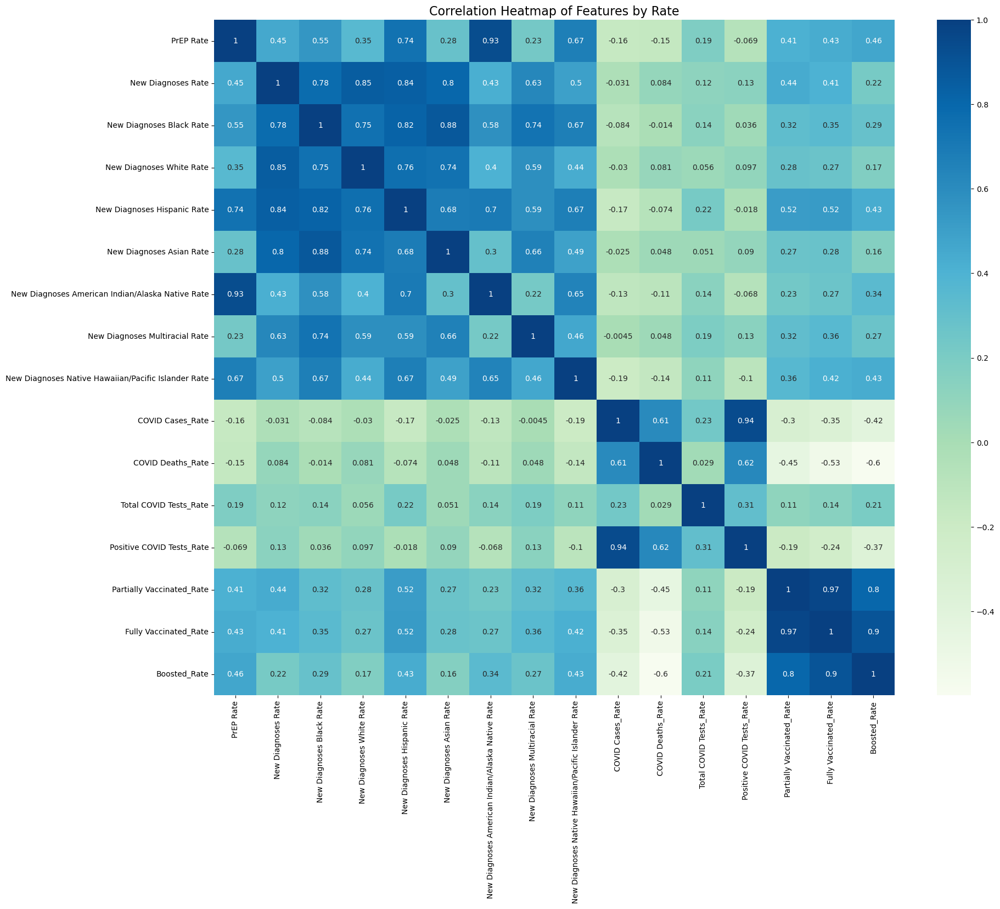

In [40]:
# Check Correlation of Features through Correlation Matrix:
# Extract features with rates only to compare relationship between HIV and COVID 
corr_features = ca_hivcovid_df2.iloc[:,[2,4,6,8,10,12,14,16,18,27,28,29,30,31,32,33]]
plt.figure(figsize=(20, 16)) #set figure size
heatmap = sns.heatmap(corr_features.corr(), cmap='GnBu', annot=True) #use .corr() function for correlation
heatmap.set_title('Correlation Heatmap of Features by Rate', size=16) #set title
plt.show() #show plot

Above, evaluating the left upper corner, we can see the relationship between the HIV features and the COVID features. There appears to be very little correlation between rate of COVID infections, deaths, tests, and vaccinations to rate of PrEP Users. For new HIV diagnosis, there also appears to be low correlation between rate of COVID infections, deaths, tests, and vaccinations. In terms of ethnic demographics, there appears to be a slightly higher correlation especially for new diagnosis hispanic rate which is positively correlated to partially vaccinated and fully vaccinated rate at 0.52. Surprisingly, rate of PrEP Users is not highly correlated to rate of new diagnosis for HIV, except for two populations, New Diagnoses American Indian/Alaska Native Rate which has the highest correlated at 0.93 and New Diagnoses Native Hawaiian/Pacific Islander Rate which has a positive correlation at 0.74. In contrast, positive COVID tests rate is highly correlated to COVID case rates at 0.94, which is not surprising since a positive tests yields a positive case. In addition, all vaccination features are highly correlated to each other. 

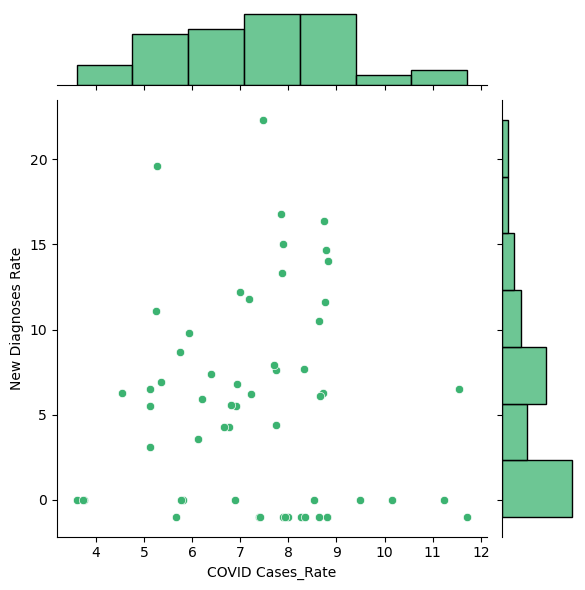

In [41]:
# Relationship of New Cases Diagnosis Rate & COVID Cases Rate with Joinplot:
sns.jointplot(ca_hivcovid_df2, y='New Diagnoses Rate', x='COVID Cases_Rate', color='mediumseagreen') # set color
plt.show() # show plot

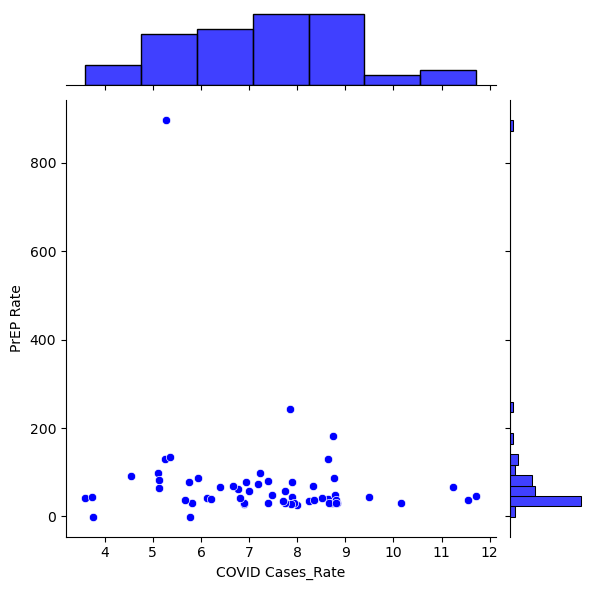

In [44]:
# Relationship of PrEP Users Rate & Fully Vaccinated Rate with Joinplot:
sns.jointplot(ca_hivcovid_df2, y='PrEP Rate', x='COVID Cases_Rate', color='blue') # set color
plt.show() # show plot

Above, the jointplot for COVID Cases Rate with New Cases Diagnosis shows that the two features are not correlated. The two features do not exhibit a linear correlation and instead points are scattered with little shape and potential outliers. When comparing COVID Cases Rates with PrEP User Rates, the two features are also not linearly correlated. Moreover, new HIV infections or new PrEP users are not directly affecting new COVID cases.

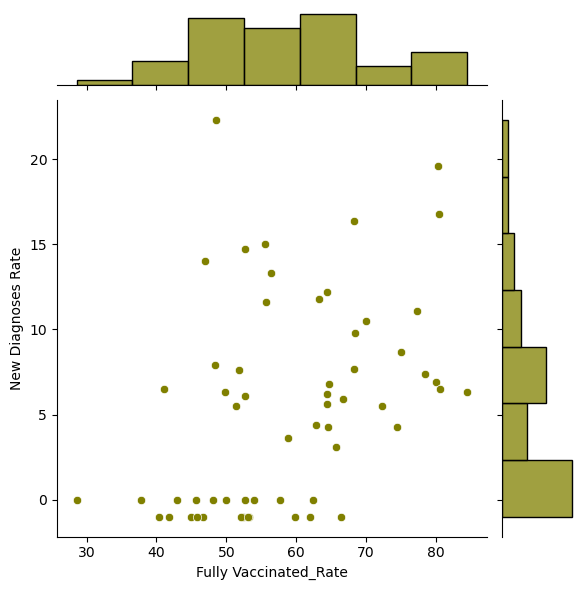

In [46]:
# Check Relationship of New Diagnoses Rate & Fully Vaccinated with Joinplot:
sns.jointplot(ca_hivcovid_df2, y='New Diagnoses Rate', x='Fully Vaccinated_Rate', color='olive') # set color
plt.show() # show plot

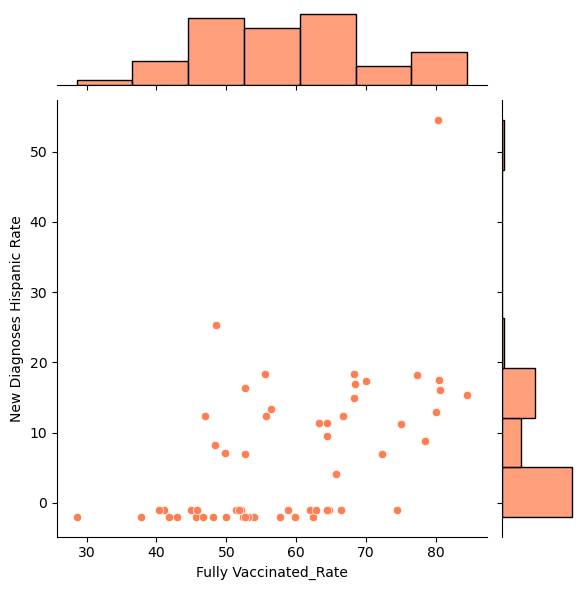

In [47]:
# Relationship of New Diagnoses Hispanic Rate & Fully Vaccinated Rate with Joinplot:
sns.jointplot(ca_hivcovid_df2, y='New Diagnoses Hispanic Rate', x='Fully Vaccinated_Rate', color='coral') # set color
plt.show() # show plot

Above, the jointplots for new diagnosis rate with fully vaccinated rate also shows that the two features are not very correlated. The points are highly scattered and do not exhibit a linear relationship although some points are closer in range than others which means there could be potential clusters and outliters. On the other hand, the jointplot for new diagnoses hispanic rate with fully vaccinated rate appears to be grouped in a certain pattern. The relationship is non-linear but perhaps clusters or outliers exist. 

Since there is low correlation between the features, having the new HIV diagnoses rate or the COVID cases rate as a target feature for a regression would likely not be appropriate since the data is not linearly correlated. Instead, we will focus on clustering and exploring the relationship of the two with spatial clusters and outliers. 

### Visualize Social Vulnerability Index (Spatial Data)

In [423]:
# CDC Social Vulnerability Index for 2020 for California by County:
CA_svi = gpd.read_file('/Users/cl/Documents/GEO448/Project/Shapefiles/SVI2020_CALIFORNIA_county.shp')

In [424]:
# Check the head of data: 
CA_svi.head(10)

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,RPL_THEMES,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSU,SPL_THEME1,RPL_THEME1,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,E_MINRTY,M_MINRTY,EP_MINRTY,MP_MINRTY,EPL_MINRTY,SPL_THEME3,RPL_THEME3,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRAC,M_OTHERRAC,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRA,MP_OTHERRA,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_THEME2,F_MINRTY,F_LIMENG,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,SHAPE_STAr,SHAPE_STLe,geometry
0,06,California,CA,06001,Alameda,06001,"Alameda County, California",0.3860,737.461520,1661584,0,605767,422,573174,1395,233543,5366,43126,1796,147454,2797,132307,2763,70389,2810,14.3,0.3,4.7,0.2,25.7,0.5,11.2,0.2,4.3,0.2,0.1228,0.1930,0.8947,0.3684,0.1228,1.7017,0.2281,231186,0,341591,0,151635,3012,29079,1353,119494,3061,13.9,0.0,20.6,0.0,9.2,0.2,5.1,0.2,7.6,0.2,0.2632,0.3509,0.1053,0.3509,0.6140,1.6843,0.0702,1153001,6526,69.4,0.4,0.8596,0.8596,0.8596,135019,2273,7291,571,45236,1588,53539,1379,31878,1199,22.3,0.4,1.2,0.1,7.9,0.3,9.3,0.2,1.9,0.1,0.9298,0.0351,0.7544,0.9825,0.4211,3.1229,0.8772,7.3685,1715160,110366,4585,167316,1387,369546,0,515105,2453,4942,249,12924,533,76404,3004,6764,6764,6.8,0.0,10.1,0.1,22.2,0.0,31.0,0.1,0.3,0.1,0.8,0.1,4.6,0.2,0.4,0.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,2,2,0.198466,2.756594,"POLYGON ((-122.34225 37.80556, -122.33412 37.8..."
1,06,California,CA,06003,Alpine,06003,"Alpine County, California",0.3333,738.340000,1159,172,1794,120,397,79,227,92,45,30,46,20,41,24,88,53,19.6,7.4,10.0,6.4,11.6,4.5,4.7,2.6,7.6,4.5,0.4211,0.9474,0.0000,0.0000,0.6667,2.0352,0.3684,337,62,252,64,182,65,8,8,17,47,29.1,5.2,21.7,4.5,15.7,4.9,2.0,2.0,1.6,4.3,1.0000,0.5088,0.7018,0.0000,0.2105,2.4211,0.5263,564,353,48.7,29.6,0.4912,0.4912,0.4912,450,100,21,19,15,10,13,8,35,18,25.1,5.3,1.2,1.1,3.8,2.4,3.3,2.1,3.0,1.5,0.9649,0.0351,0.2807,0.0526,0.7018,2.0351,0.1930,6.9826,1299,114,245,10,23,183,111,6,9,333,41,0,13,32,23,0,0,10.1,1.6,0.9,2.0,15.8,7.9,0.5,0.8,28.7,4.2,0.0,3.4,2.8,2.1,0.0,3.4,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,1,3,0.199004,2.156769,"POLYGON ((-120.07239 38.70277, -120.06762 38.7..."
2,06,California,CA,06005,Amador,06005,"Amador County, California",0.1754,594.583866,39023,0,18246,170,14844,451,5416,776,853,197,4398,586,2711,314,1817,421,15.3,2.2,5.6,1.3,29.6,3.8,8.8,1.0,5.1,1.2,0.1754,0.3333,0.2105,0.1579,0.2105,1.0876,0.0877,10537,98,5962,67,6336,679,493,144,418,131,27.0,0.3,15.3,0.2,17.9,1.9,3.3,1.0,1.1,0.3,0.8596,0.0175,0.8596,0.0526,0.1053,1.8946,0.1579,9062,436,23.2,1.1,0.1754,0.1754,0.1754,908,374,1349,216,381,138,1009,383,3578,380,5.0,2.0,7.4,1.2,2.6,0.9,6.8,2.6,9.2,1.0,0.3860,0.5789,0.1579,0.7895,0.9474,2.8597,0.6667,6.0173,37659,4304,883,867,125,5591,0,352,104,205,70,30,35,1768,244,249,249,12.1,0.1,2.2,0.3,14.3,0.0,0.9,0.3,0.5,0.2,0.1,0.1,4.5,0.6,0.6,0.6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,0.161967,2.874887,"POLYGON ((-121.02741 38.50354, -121.02747 38.5..."
3,06,California,CA,06007,Butte,06007,"Butte County, California",0.5965,1636.488963,223344,0,93968,223,83879,8

For each Census Tract, the CDC has generated a percenitle rank among all 16 individual variables related to social vulnerbility and has grouped these variables into four themes: <B>Socioeconomic Status - RPL_THEME1, Household Characteristics - RPL_THEME2, Racial & Ethnic Minority Status - RPL Theme3, and Housing Type/Transportation - RPL_THEME4</B>. The overall summary ranking of the variables is indicated in RPL_THEMES. 

In [425]:
# Check Shape of Data (ensure there are 58 counties)
CA_svi.shape

(58, 161)

In [426]:
# Check the Coordinate Reference System (CRS):
CA_svi.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

Above, CA_svi is stored in the Geographic Coordinate System (GCS). We will change this to UTM 16N (projected CRS). 

In [427]:
# Change CRS to UTM Zone 10N - EPSG:26910
CA_svi2 = CA_svi.to_crs(26910)
CA_svi2.crs

<Derived Projected CRS: EPSG:26910>
Name: NAD83 / UTM zone 10N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: North America - between 126°W and 120°W - onshore and offshore. Canada - British Columbia; Northwest Territories; Yukon. United States (USA) - California; Oregon; Washington.
- bounds: (-126.0, 30.54, -119.99, 81.8)
Coordinate Operation:
- name: UTM zone 10N
- method: Transverse Mercator
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

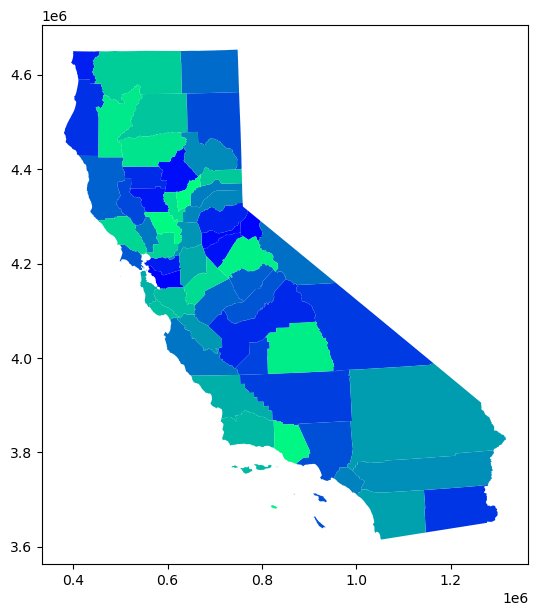

In [428]:
#Map California Counties by Aggregating Tracts: 
ca_counties = CA_svi2.dissolve(by='STCNTY') #use STCNTY to map counties
ca_counties.plot(cmap='winter', figsize=(9,7)) #plot 
plt.show() #show plot

Next, we will check summary statistics and distributions for RPL_THEME1, RPL_THEME2, RPL Theme3, RPL_THEME4, and RPL_THEMES.

In [429]:
# Summary Statistics for All RPL_THEMES: 
CA_svi2[['RPL_THEME1', 'RPL_THEME2', 'RPL_THEME3', 'RPL_THEME4', 'RPL_THEMES']].describe()

,RPL_THEME1,RPL_THEME2,RPL_THEME3,RPL_THEME4,RPL_THEMES
count,58.000000,58.000000,58.000000,58.000000,58.000000
mean,0.498488,0.497881,0.497879,0.498488,0.499698
std,0.297111,0.295977,0.296036,0.295782,0.296079
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.228100,0.250000,0.250000,0.250000,0.250000
50%,0.500000,0.491200,0.500000,0.500000,0.500000
75%,0.750000,0.750000,0.750000,0.750000,0.750000
max,1.000000,1.000000,1.000000,1.000000,1.000000


Above, the summary statistics show that the distributions of each of the themes are fairly distributed. All five variables have similar means and standard deviations and follow a normal distribution. Next, we will plot the themes by county and see if there is variation by county. 

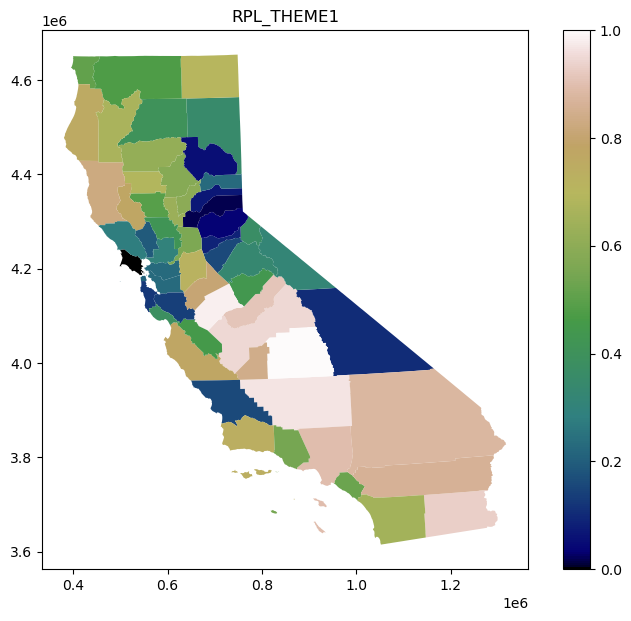

In [430]:
# Show RPL_THEME1 distribution by county: 
ca_counties.plot(column='RPL_THEME1', figsize=(9,7), legend=True, cmap='gist_earth')
plt.title('RPL_THEME1')
plt.show()

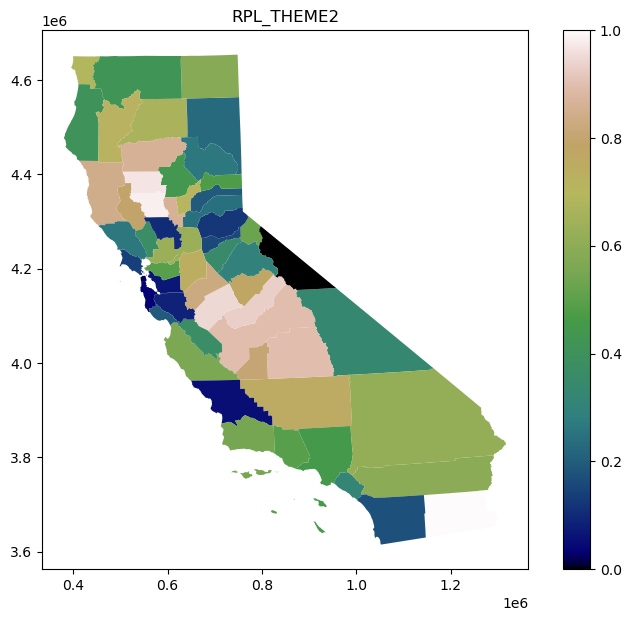

In [431]:
# Show RPL_THEME2 distribution by county: 
ca_counties.plot(column='RPL_THEME2', figsize=(9,7), legend=True, cmap='gist_earth')
plt.title('RPL_THEME2')
plt.show()

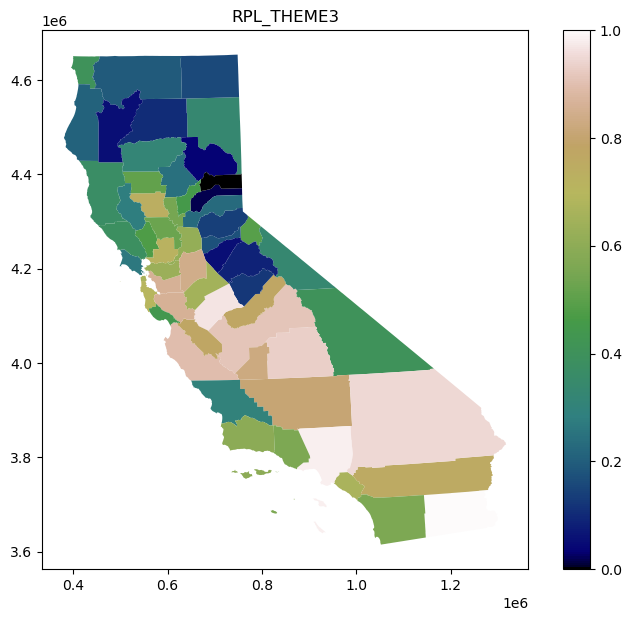

In [432]:
# Show RPL_THEME3 distribution by county: 
ca_counties.plot(column='RPL_THEME3', figsize=(9,7), legend=True, cmap='gist_earth')
plt.title('RPL_THEME3')
plt.show()

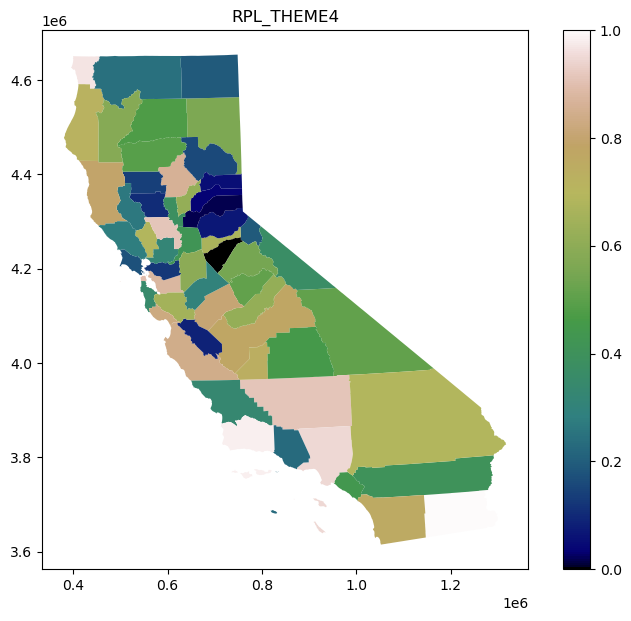

In [433]:
# Show RPL_THEME4 distribution by county: 
ca_counties.plot(column='RPL_THEME4', figsize=(9,7), legend=True, cmap='gist_earth')
plt.title('RPL_THEME4')
plt.show()

Above, we can see that counties in the middle and southern california have greater burden to socioeconomic status as shown in light brown for RPL_THEME1. Less counties are affected by household charactertistics as shown in RPL_THEME2, where the map is more green and blues. Many counties in the Bay Area and Southern California are affected by racial and ethnic minority status as shown in RPL_THEME3. Whereas key specific counties such as Los Angeles are affected by housing and transportation as seen in RPL_THEME4. 

Next, we will take a deeper look by visualizing the top 10% of values, which are given a flag of 1 to indicadate highest vulnerability and a flag of 0 if below the 90th percentile. The following varaibles represent the flagged status, <B>F_THEME1 - flags for socioeconomic status, F_THEME2 - flags for household characteristics, F_THEME3 - flags for racial and ethnic minority status, and F_THEME4 - flags for housing type/transportation.</B> 

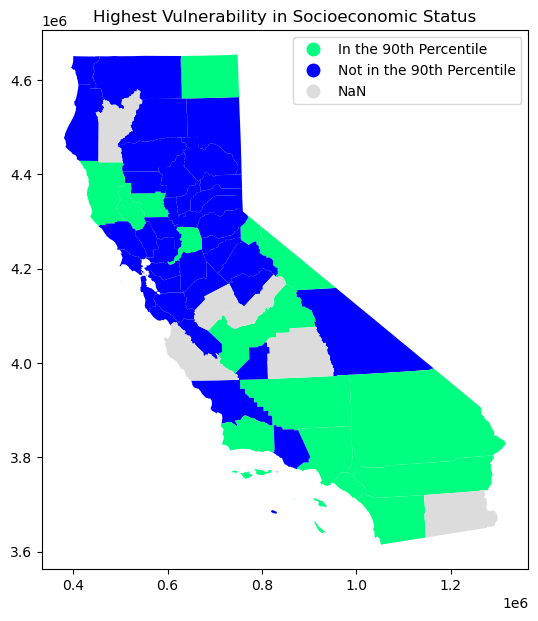

In [434]:
# Show most vulernable for F_THEME1: 
ca_counties.loc[ca_counties['F_THEME1'] == 0.0, 'FS_THEME1'] = 'Not in the 90th Percentile'
ca_counties.loc[ca_counties['F_THEME1'] == 1.0, 'FS_THEME1'] = 'In the 90th Percentile'
ca_counties.plot(column='FS_THEME1', figsize=(9,7), legend=True, cmap='winter_r', missing_kwds={'color':'gainsboro'})
plt.title('Highest Vulnerability in Socioeconomic Status')
plt.show()

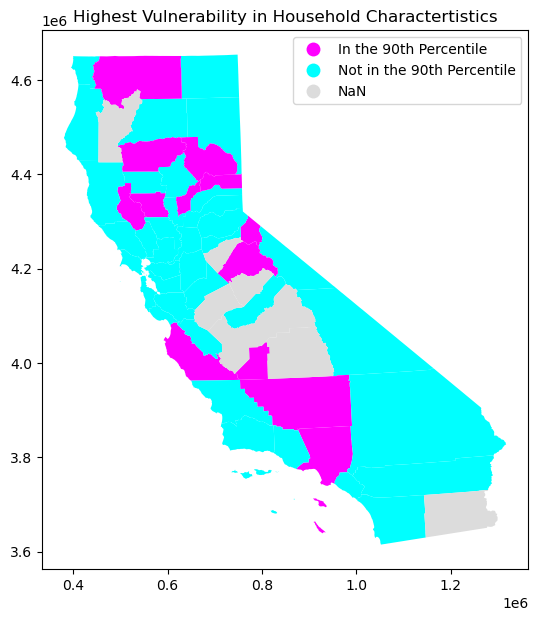

In [435]:
# Show most vulernable for F_THEME2: 
ca_counties.loc[ca_counties['F_THEME2'] == 0.0, 'FS_THEME2'] = 'Not in the 90th Percentile'
ca_counties.loc[ca_counties['F_THEME2'] == 1.0, 'FS_THEME2'] = 'In the 90th Percentile'
ca_counties.plot(column='FS_THEME2', figsize=(9,7), legend=True, cmap='cool_r', missing_kwds={'color':'gainsboro'})
plt.title('Highest Vulnerability in Household Charactertistics')
plt.show()

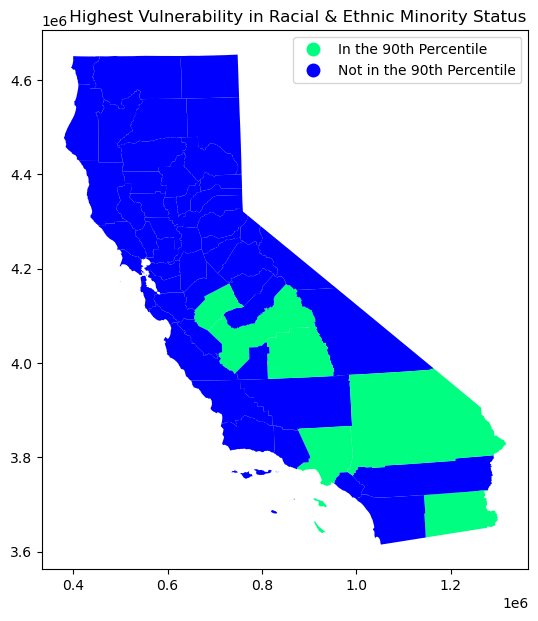

In [436]:
# Show most vulernable for F_THEME3: 
ca_counties.loc[ca_counties['F_THEME3'] == 0.0, 'FS_THEME3'] = 'Not in the 90th Percentile'
ca_counties.loc[ca_counties['F_THEME3'] == 1.0, 'FS_THEME3'] = 'In the 90th Percentile'
ca_counties.plot(column='FS_THEME3', figsize=(9,7), legend=True, cmap='winter_r', missing_kwds={'color':'gainsboro'})
plt.title('     Highest Vulnerability in Racial & Ethnic Minority Status')
plt.show()

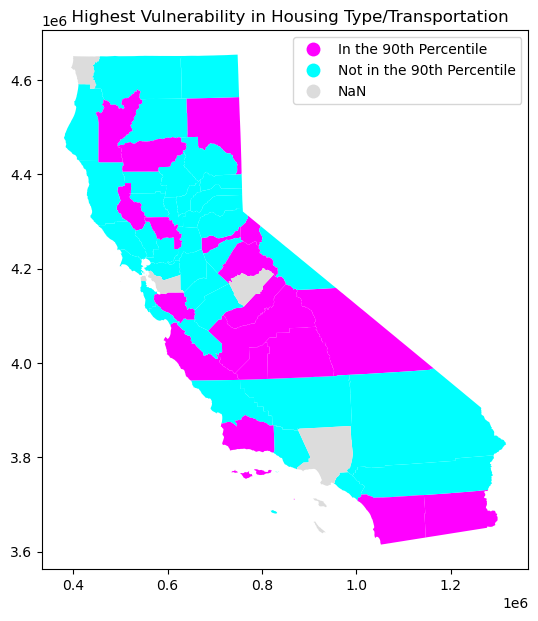

In [437]:
# Show most vulernable for F_THEME4: 
ca_counties.loc[ca_counties['F_THEME4'] == 0.0, 'FS_THEME4'] = 'Not in the 90th Percentile'
ca_counties.loc[ca_counties['F_THEME4'] == 1.0, 'FS_THEME4'] = 'In the 90th Percentile'
ca_counties.plot(column='FS_THEME4', figsize=(9,7), legend=True, cmap='cool_r', missing_kwds={'color':'gainsboro'})
plt.title('  Highest Vulnerability in Housing Type/Transportation')
plt.show()

Above, counties in Southern California are in the 90th Percentile for high vulnerbility for socioeonomic status for racial/ethnicity minority status. Whereas, counties in Central California are in the 90th Percentile for high vulnerability for Household Characteristics and for Housing and Transportation. Counties in Central California are also in the 90th Percentile for high vulnerability for racial/ethnic minority status. For this analysis, we will focus on RL_THEME1 and RL_THEME3 to see the intersection of socioeonomic status and racial/ethnic minority status with the two public health epidemics. 

## Exploratory Spatial Data Analysis (ESDA)

### Get Latitude and Longitude for Counties from Geocoder

In [50]:
# Create a Geocoder from OSM Nominatim Server
geocoder = Nominatim(user_agent='myapp')

In [51]:
# Create a new column 'County/State' which includes 'CA' for each county:
ca_hivcovid_df2['County/State'] = ca_hivcovid_df2['County'].astype(str) + ',CA' #concats ',CA' to value
ca_hivcovid_df2.head()

,County,Overall HIV Cases,PrEP Rate,PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,COVID Cases,COVID Deaths,Total COVID Tests,Positive COVID Tests,Partially Vaccinated,Fully Vaccinated,Boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate,County/State
0,Alameda,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,88478.0,887.0,3625096.0,110982.0,1259509.0,1301754.0,597411,5.248160,0.052613,215.026164,6.583007,74.709025,77.214829,35.436026,"Alameda ,CA"
1,Alpine,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,42.0,0.0,1256.0,32.0,726.0,644.0,236,3.760072,0.000000,112.444047,2.864816,64.995524,57.654432,21.128021,"Alpine ,CA"
2,Amador,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,3326.0,46.0,119657.0,3850.0,21520.0,20173.0,7753,8.632011,0.119384,310.547351,9.991955,55.851133,52.355246,20.121461,"Amador ,CA"
3,Butte,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1,15031.0,231.0,240176.0,17085.0,109381.0,111894.0,42931,6.902268,0.106076,110.289343,7.845469,50.227994,51.381969,19.714009,"Butte ,CA"
4,Calaveras,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,3540.0,64.0,55562.0,4143.0,25209.0,23549.0,9016,7.992955,0.144505,125.453273,9.354467,56.919325,53.171216,20.357199,"Calaveras ,CA"


In [52]:
# Apply the Geocoder to County/State and save output as new Location column:
ca_hivcovid_df2['Location'] = ca_hivcovid_df2['County/State'].apply(geocoder.geocode) #apply geocode to all
ca_hivcovid_df2['Location'] #view and check results

0     (Alameda County, CAL Fire Northern Region, Cal...
1     (Alpine County, California, United States, (38...
2     (Amador County, California, United States, (38...
3     (Butte County, California, United States, (39....
4     (Calaveras County, California, United States, ...
5     (Colusa County, California, United States, (39...
6     (Contra Costa County, California, United State...
7     (Del Norte County, CAL Fire Northern Region, C...
8     (El Dorado County, California, United States, ...
9     (Fresno, Fresno County, CAL Fire Southern Regi...
10    (Glenn County, California, United States, (39....
11    (Humboldt County, California, United States, (...
12    (Imperial County, California, United States, (...
13    (Inyo County, California, United States, (36.5...
14    (Kern County, CAL Fire Southern Region, Califo...
15    (Kings County, California, United States, (36....
16    (Lake County, California, United States, (39.0...
17    (Lassen County, California, United States,

Above, geocoder found all of the correct counties in the dataframe as shown above. Next, using the location data, create latitude and longitude columns. 

In [53]:
# Apply Lambda X to Location to extract Latitude and Longitude:
ca_hivcovid_df2['Lat'] = ca_hivcovid_df2['Location'].apply(lambda x: (x.latitude)) #apply, get latitude
ca_hivcovid_df2['Long'] = ca_hivcovid_df2['Location'].apply(lambda x: (x.longitude)) #apply, get longitude

In [54]:
# Check head of DF: 
ca_hivcovid_df2.head()

,County,Overall HIV Cases,PrEP Rate,PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,COVID Cases,COVID Deaths,Total COVID Tests,Positive COVID Tests,Partially Vaccinated,Fully Vaccinated,Boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate,County/State,Location,Lat,Long
0,Alameda,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,88478.0,887.0,3625096.0,110982.0,1259509.0,1301754.0,597411,5.248160,0.052613,215.026164,6.583007,74.709025,77.214829,35.436026,"Alameda ,CA","(Alameda County, CAL Fire Northern Region, Cal...",37.609029,-121.899142
1,Alpine,-1,-1,-1,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,42.0,0.0,1256.0,32.0,726.0,644.0,236,3.760072,0.000000,112.444047,2.864816,64.995524,57.654432,21.128021,"Alpine ,CA","(Alpine County, California, United States, (38...",38.589393,-119.834501
2,Amador,184,40,14,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,3326.0,46.0,119657.0,3850.0,21520.0,20173.0,7753,8.632011,0.119384,310.547351,9.991955,55.851133,52.355246,20.121461,"Amador ,CA","(Amador County, California, United States, (38...",38.449089,-120.591102
3,Butte,249,29,55,5.5,10,0.0,0,6.1,8,-1.0,-1,0.0,0,0.0,0,0.0,0,-1.0,-1,15031.0,231.0,240176.0,17085.0,109381.0,111894.0,42931,6.902268,0.106076,110.289343,7.845469,50.227994,51.381969,19.714009,"Butte ,CA","(Butte County, California, United States, (39....",39.651927,-121.585844
4,Calaveras,50,27,11,-1.0,-1,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,3540.0,64.0,55562.0,4143.0,25209.0,23549.0,9016,7.992955,0.144505,125.453273,9.354467,56.919325,53.171216,20.357199,"Calaveras ,CA","(Calaveras County, California, United States, ...",38.255818,-120.498149


### Create Geographic Data using Latitude and Longtidue Points 

In [55]:
# Create a GeoSeries from X, Y coordinates (Longitude = X, Latitude = Y)
gs = gpd.points_from_xy(ca_hivcovid_df2.Long, ca_hivcovid_df2.Lat)

In [56]:
# Create a GeoDataFrame using ca_hivcovid_df2 and gs from above: 
ca_hivcovid_gs = gpd.GeoDataFrame(ca_hivcovid_df2, geometry=gs)
ca_hivcovid_gs.tail() #view tail

,County,Overall HIV Cases,PrEP Rate,PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,COVID Cases,COVID Deaths,Total COVID Tests,Positive COVID Tests,Partially Vaccinated,Fully Vaccinated,Boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate,County/State,Location,Lat,Long,geometry
53,Tulare,516,36,132,7.9,29,0.0,0,8.2,9,8.2,19,-1.0,-1,0.0,0,0.0,0,-1.0,-1,37326.0,790.0,647145.0,42952.0,247185.0,234588.0,69631,7.705249,0.163081,133.590891,8.866631,51.026685,48.426272,14.374008,"Tulare ,CA","(Tulare County, California, United States, (36...",36.251647,-118.852583,POINT (-118.85258 36.25165)
54,Tuolumne,59,30,14,0.0,0,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,-2.0,-2,5321.0,123.0,109808.0,6254.0,29190.0,27607.0,11310,10.164085,0.234953,209.753395,11.946286,55.758247,52.734427,21.604172,"Tuolumne ,CA","(Tuolumne County, California, United States, (...",38.056944,-119.991935,POINT (-119.99194 38.05694)
55,Ventura,1139,68,482,7.7,55,7.5,1,3.0,10,14.9,43,0.0,0,0.0,0,6.6,1,0.0,0,70945.0,847.0,1671607.0,88960.0,577315.0,582414.0,228947,8.319584,0.099326,196.026137,10.432168,67.700619,68.298569,26.848174,"Ventura ,CA","(Ventura County, California, United States, (3...",34.445825,-119.077936,POINT (-119.07794 34.44582)
56,Yolo,310,40,75,5.9,11,-1.0,-1,-1.0,-1,12.4,7,-1.0,-1,0.0,0,0.0,0,0.0,0,13861.0,135.0,1005823.0,15058.0,149625.0,148984.0,64192,6.198683,0.060372,449.807255,6.733986,66.912777,66.626120,28.706867,"Yolo ,CA","(Yolo County, California, United States, (38.7...",38.718454,-121.905900,POINT (-121.90590 38.71845)
57,Yuba,101,30,19,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1,-1.0,-1,6984.0,83.0,90173.0,8325.0,35420.0,36358.0,10213,8.808173,0.104679,113.725564,10.499432,44.671459,45.854458,12.880565,"Yuba ,CA","(Yuba County, California, United States, (39.2...",39.283975,-121.355682,POINT (-121.35568 39.28398)


In [57]:
# Set CRS for ca_hivcovid_gs to GCS_NAD83 (horizontal datum for North America)
ca_hivcovid_gs.crs = '4269'
ca_hivcovid_gs.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

### Spatial Join 

Next, we will spatially join two layers (the HIV/COVID data with the CA SVI data) which will allow us to see the the affect of HIV and COVID on the counties in California. This will also show us any intersection between the two and whether PrEP and/or vaccinations affected certain areas or demographics differently. 

In [58]:
# CDC Social Vulnerability Index for 2020 for California by County:
CA_svi = gpd.read_file('/Users/cl/Documents/GEO448/Project/Shapefiles/SVI2020_CALIFORNIA_county.shp')

In [59]:
# View tail of CA_svi:
CA_svi.tail()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,RPL_THEMES,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSU,SPL_THEME1,RPL_THEME1,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,E_MINRTY,M_MINRTY,EP_MINRTY,MP_MINRTY,EPL_MINRTY,SPL_THEME3,RPL_THEME3,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRAC,M_OTHERRAC,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRA,MP_OTHERRA,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_THEME2,F_MINRTY,F_LIMENG,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,SHAPE_STAr,SHAPE_STLe,geometry
53,06,California,CA,06107,Tulare,06107,"Tulare County, California",0.9298,4823.896942,463955,0,150079,175,139044,793,164222,5818,20214,1385,49855,2054,76949,2070,35869,2526,35.9,1.3,9.9,0.6,35.9,1.5,28.1,0.8,7.8,0.5,0.9825,0.9298,0.7018,0.9649,0.7368,4.3158,1.0000,52826,45,142777,0,53760,2610,13115,1082,57319,2173,11.4,0.1,30.8,0.0,11.7,0.6,9.4,0.8,13.4,0.5,0.0526,1.0000,0.3509,0.9649,0.9298,3.2982,0.8947,335204,2920,72.2,0.6,0.9298,0.9298,0.9298,8159,882,9096,626,14201,991,7394,669,5595,452,5.4,0.6,6.1,0.4,10.2,0.7,5.3,0.5,1.2,0.1,0.4035,0.4561,0.9298,0.4912,0.1754,2.4560,0.4561,10.9998,466703,73770,3504,5923,395,301919,0,15857,498,2592,316,528,120,6913,804,1472,1472,16.1,0.0,1.3,0.1,65.1,0.0,3.4,0.1,0.6,0.1,0.1,0.1,1.5,0.2,0.3,0.2,1,1,0,1,0,3,0,1,0,1,3,1,1,1,0,0,1,0,0,1,8,1.256098,5.346579,"POLYGON ((-119.56647 36.49434, -119.56366 36.4..."
54,06,California,CA,06109,Tuolumne,06109,"Tuolumne County, California",0.2281,2220.910147,54147,0,31572,121,22937,637,8819,899,1646,308,7519,718,3729,557,3137,462,17.4,1.8,7.3,1.3,32.8,3.0,9.0,1.3,6.1,0.9,0.3333,0.6140,0.2807,0.1930,0.4211,1.8421,0.3333,14109,116,8986,49,10250,750,931,280,262,130,26.1,0.2,16.6,0.1,20.0,1.5,4.1,1.2,0.5,0.3,0.8421,0.0877,0.9649,0.1930,0.0175,2.1052,0.2982,11008,811,20.3,1.5,0.0877,0.0877,0.0877,757,228,2789,377,561,167,1400,362,3422,264,2.4,0.7,8.8,1.2,2.4,0.7,6.1,1.5,6.3,0.5,0.1228,0.7018,0.1053,0.6667,0.9123,2.5089,0.5439,6.5439,52976,6807,1084,979,117,6810,0,730,118,765,149,146,29,1476,186,102,102,13.4,0.1,1.8,0.2,12.6,0.0,1.3,0.2,1.4,0.3,0.3,0.1,2.7,0.3,0.2,0.2,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,1,2,0.604459,5.007781,"POLYGON ((-120.65324 37.83282, -120.64865 37.8..."
55,06,California,CA,06111,Ventura,06111,"Ventura County, California",0.4561,1840.788448,845599,0,289425,380,271639,1129,133661,4348,22114,905,77020,2169,82261,2143,70449,2941,16.0,0.5,5.1,0.2,28.4,0.8,14.4,0.4,8.4,0.4,0.2105,0.2632,0.7895,0.5965,0.8246,2.6843,0.5439,131672,76,193847,0,92514,2501,13366,961,71885,2424,15.6,0.1,22.9,0.0,11.0,0.3,4.9,0.4,9.0,0.3,0.4561,0.6667,0.2456,0.3158,0.7193,2.4035,0.4912,465628,2689,55.1,0.3,0.5614,0.5614,0.5614,31444,1212,11241,652,16793,1007,11671,807,13099,1007,10.9,0.4,3.9,0.2,6.2,0.4,4.3,0.3,1.5,0.1,0.7544,0.2807,0.5965,0.1754,0.2807,2.0877,0.2281,7.7369,800107,71112,4406,14321,611,361648,0,59761,1174,1847,311,1655,158,24692,1367,1704,1704,8.5,0.0,1.7,0.1,42.8,0.0,7.1,0.1,0.2,0.1,0.2,0.1,2.9,0.2,0.2,0.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.471564,3.509455,"MULTIPOLYGON (((-119.47784 34.37942, -119.4737..."
56,06,Ca

In [60]:
# Check info on CA_svi GeoDataFrame:
CA_svi.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 58 entries, 0 to 57
Columns: 161 entries, ST to geometry
dtypes: float64(77), geometry(1), int64(76), object(7)
memory usage: 73.1+ KB


In [61]:
# Check CRS for CA_svi:
CA_svi.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [62]:
# Check info on ca_hivcovid GeoDataFrame:
ca_hivcovid_gs.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 58 entries, 0 to 57
Data columns (total 39 columns):
 #   Column                                                Non-Null Count  Dtype   
---  ------                                                --------------  -----   
 0   County                                                58 non-null     object  
 1   Overall HIV Cases                                     58 non-null     int64   
 2   PrEP Rate                                             58 non-null     int64   
 3   PrEP Users                                            58 non-null     int64   
 4   New Diagnoses Rate                                    58 non-null     float64 
 5   New Diagnoses Cases                                   58 non-null     int64   
 6   New Diagnoses Black Rate                              58 non-null     float64 
 7   New Diagnoses Black Cases                             58 non-null     int64   
 8   New Diagnoses White Rate                    

In [63]:
# Check CRS for ca_hivcovid:
ca_hivcovid_gs.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

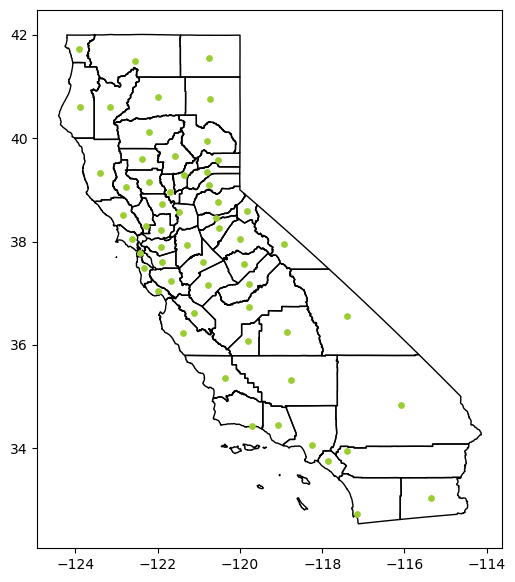

In [64]:
# Plot and Overlay Both GeoDataFrames:
fig, ax = plt.subplots(figsize=(6,8))
CA_svi.plot(ax=ax, edgecolor='k', facecolor='None') # plot CA Counties
ca_hivcovid_gs.plot(ax=ax, marker='o', markersize=15, color='yellowgreen') # this plots marker for each county
plt.show() # show plot

In [65]:
# Perform Spatial Join of CA_svi and ca_hivcovid_gs
CA_svi_hivcovid = gpd.sjoin(CA_svi, ca_hivcovid_gs)

In [66]:
# Checked joined GeoDataFrame:
CA_svi_hivcovid.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 58 entries, 0 to 57
Columns: 200 entries, ST to Long
dtypes: float64(100), geometry(1), int64(89), object(10)
memory usage: 91.1+ KB


In [67]:
# Check head of joined GeoDataFrame:
CA_svi_hivcovid.head()

,ST,STATE,ST_ABBR,STCNTY,COUNTY,FIPS,LOCATION,RPL_THEMES,AREA_SQMI,E_TOTPOP,M_TOTPOP,E_HU,M_HU,E_HH,M_HH,E_POV150,M_POV150,E_UNEMP,M_UNEMP,E_HBURD,M_HBURD,E_NOHSDP,M_NOHSDP,E_UNINSUR,M_UNINSUR,EP_POV150,MP_POV150,EP_UNEMP,MP_UNEMP,EP_HBURD,MP_HBURD,EP_NOHSDP,MP_NOHSDP,EP_UNINSUR,MP_UNINSUR,EPL_POV150,EPL_UNEMP,EPL_HBURD,EPL_NOHSDP,EPL_UNINSU,SPL_THEME1,RPL_THEME1,E_AGE65,M_AGE65,E_AGE17,M_AGE17,E_DISABL,M_DISABL,E_SNGPNT,M_SNGPNT,E_LIMENG,M_LIMENG,EP_AGE65,MP_AGE65,EP_AGE17,MP_AGE17,EP_DISABL,MP_DISABL,EP_SNGPNT,MP_SNGPNT,EP_LIMENG,MP_LIMENG,EPL_AGE65,EPL_AGE17,EPL_DISABL,EPL_SNGPNT,EPL_LIMENG,SPL_THEME2,RPL_THEME2,E_MINRTY,M_MINRTY,EP_MINRTY,MP_MINRTY,EPL_MINRTY,SPL_THEME3,RPL_THEME3,E_MUNIT,M_MUNIT,E_MOBILE,M_MOBILE,E_CROWD,M_CROWD,E_NOVEH,M_NOVEH,E_GROUPQ,M_GROUPQ,EP_MUNIT,MP_MUNIT,EP_MOBILE,MP_MOBILE,EP_CROWD,MP_CROWD,EP_NOVEH,MP_NOVEH,EP_GROUPQ,MP_GROUPQ,EPL_MUNIT,EPL_MOBILE,EPL_CROWD,EPL_NOVEH,EPL_GROUPQ,SPL_THEME4,RPL_THEME4,SPL_THEMES,E_DAYPOP,E_NOINT,M_NOINT,E_AFAM,M_AFAM,E_HISP,M_HISP,E_ASIAN,M_ASIAN,E_AIAN,M_AIAN,E_NHPI,M_NHPI,E_TWOMORE,M_TWOMORE,E_OTHERRAC,M_OTHERRAC,EP_NOINT,MP_NOINT,EP_AFAM,MP_AFAM,EP_HISP,MP_HISP,EP_ASIAN,MP_ASIAN,EP_AIAN,MP_AIAN,EP_NHPI,MP_NHPI,EP_TWOMORE,MP_TWOMORE,EP_OTHERRA,MP_OTHERRA,F_POV150,F_UNEMP,F_HBURD,F_NOHSDP,F_UNINSUR,F_THEME1,F_AGE65,F_AGE17,F_DISABL,F_SNGPNT,F_THEME2,F_MINRTY,F_LIMENG,F_THEME3,F_MUNIT,F_MOBILE,F_CROWD,F_NOVEH,F_GROUPQ,F_THEME4,F_TOTAL,SHAPE_STAr,SHAPE_STLe,geometry,index_right,County,Overall HIV Cases,PrEP Rate,PrEP Users,New Diagnoses Rate,New Diagnoses Cases,New Diagnoses Black Rate,New Diagnoses Black Cases,New Diagnoses White Rate,New Diagnoses White Cases,New Diagnoses Hispanic Rate,New Diagnoses Hispanic Cases,New Diagnoses Asian Rate,New Diagnoses Asian Cases,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses American Indian/Alaska Native Cases,New Diagnoses Multiracial Rate,New Diagnoses Multiracial Cases,New Diagnoses Native Hawaiian/Pacific Islander Rate,New Diagnoses Native Hawaiian/Pacific Islander Cases,COVID Cases,COVID Deaths,Total COVID Tests,Positive COVID Tests,Partially Vaccinated,Fully Vaccinated,Boosted,COVID Cases_Rate,COVID Deaths_Rate,Total COVID Tests_Rate,Positive COVID Tests_Rate,Partially Vaccinated_Rate,Fully Vaccinated_Rate,Boosted_Rate,County/State,Location,Lat,Long
0,06,California,CA,06001,Alameda,06001,"Alameda County, California",0.3860,737.461520,1661584,0,605767,422,573174,1395,233543,5366,43126,1796,147454,2797,132307,2763,70389,2810,14.3,0.3,4.7,0.2,25.7,0.5,11.2,0.2,4.3,0.2,0.1228,0.1930,0.8947,0.3684,0.1228,1.7017,0.2281,231186,0,341591,0,151635,3012,29079,1353,119494,3061,13.9,0.0,20.6,0.0,9.2,0.2,5.1,0.2,7.6,0.2,0.2632,0.3509,0.1053,0.3509,0.6140,1.6843,0.0702,1153001,6526,69.4,0.4,0.8596,0.8596,0.8596,135019,2273,7291,571,45236,1588,53539,1379,31878,1199,22.3,0.4,1.2,0.1,7.9,0.3,9.3,0.2,1.9,0.1,0.9298,0.0351,0.7544,0.9825,0.4211,3.1229,0.8772,7.3685,1715160,110366,4585,167316,1387,369546,0,515105,2453,4942,249,12924,533,76404,3004,6764,6764,6.8,0.0,10.1,0.1,22.2,0.0,31.0,0.1,0.3,0.1,0.8,0.1,4.6,0.2,0.4,0.1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,2,2,0.198466,2.756594,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0,Alameda,6030,131,1857,11.1,157,34.4,50,6.0,27,18.2,54,3.9,18,0.0,0,10.0,5,26.2,3,88478.0,887.0,3625096.0,110982.0,1259509.0,1301754.0,597411,5.248160,0.052613,215.026164,6.583007,74.709025,77.214829,35.436026,"Alameda ,CA","(Alameda County, CAL Fire Northern Region, Cal...",37.609029,-121.899142
1,06,California,CA,06003,Alpine,06003,"Alpine County, California",0.3333,738.340000,1159,172,1794,120,397,79,227,92,45,30,46,20,41,24,88,53,19.6,7.4,10.0,6.4,11.6,4.5,4.7,2.6,7.6,4.5,0.4211,0.9474,0.0000,0.0000,0.6667,2.0352,0.3684,337,62,252,64,182,65,8,8,17,47,29.1,5.2,21.7,4.5,15.7,4.9,2.0,2.0,1.6,4.3,1.0000,0.5088,0.7018,0.0000,0.2105,2.4211,0.5263,564,353,48.7,29.6,0.4912,0.4912,0.4912,450,100,21,19,15,10,13,8,35,18,25.1,5.3,1.2,1.1,3.8,2.4,3.3,2.1,3.0,1.5,0.9649,0.0351,0.2807,0.0526,0.7018,2.0351,0

### Visualize HIV and COVID Spatially by County

With the the spatially joined GeoDataFrame, we will now visualize new HIV diagnoses and COVID-19 cases by county.

#### HIV and PrEP 

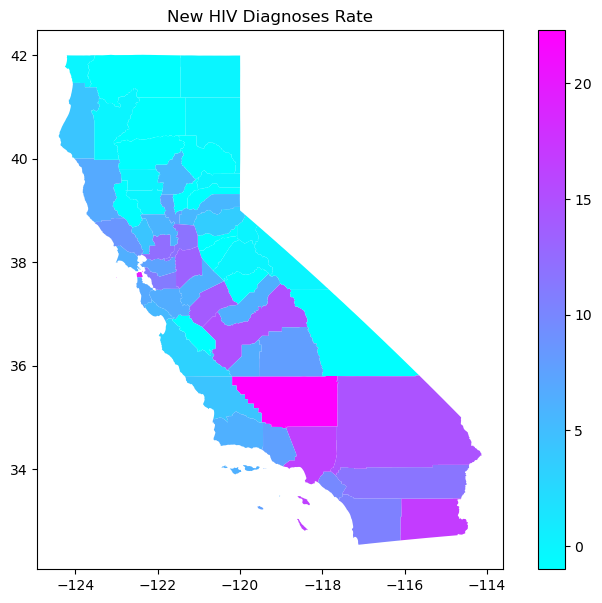

In [68]:
# Show HIV Infection Rate by Counties: 
CA_svi_hivcovid.plot(column='New Diagnoses Rate', figsize=(9,7), legend=True, cmap='cool') #plot by Rate
plt.title('New HIV Diagnoses Rate') #set title
plt.show() #show plot

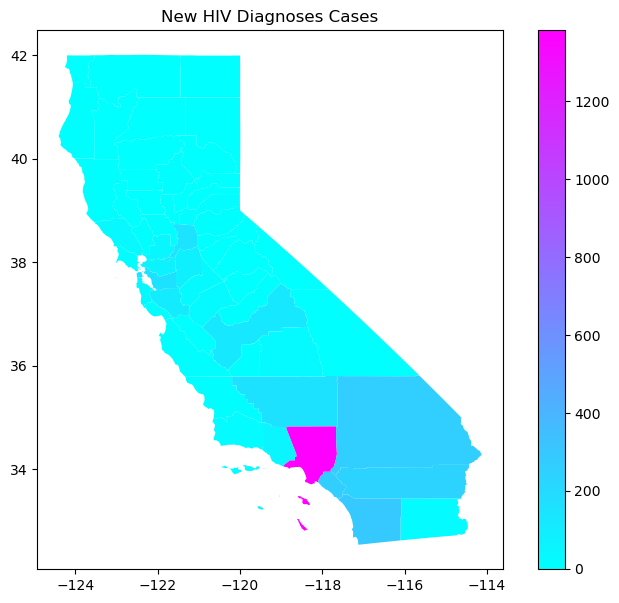

In [69]:
# Show HIV Infection Cases by Counties: 
CA_svi_hivcovid.plot(column='New Diagnoses Cases', figsize=(9,7), legend=True, cmap='cool') #plot by case count
plt.title('New HIV Diagnoses Cases') #set title
plt.show() #show plot

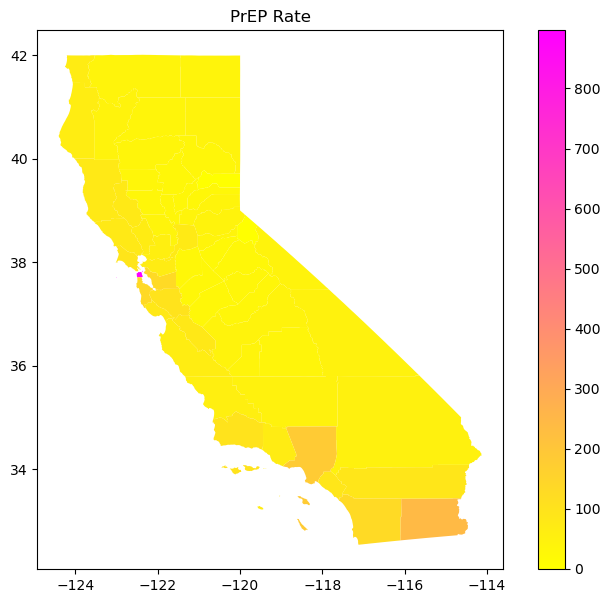

In [70]:
# Show PrEP User Rate by Counties: 
CA_svi_hivcovid.plot(column='PrEP Rate', figsize=(9,7), legend=True, cmap='spring_r') #plot by rate
plt.title('PrEP Rate') # set title
plt.show() # show plot

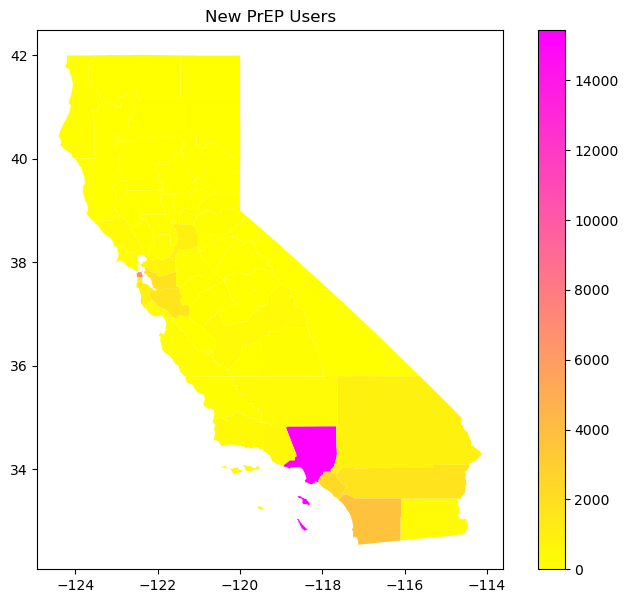

In [71]:
# Show New PrEP Users by Counties: 
CA_svi_hivcovid.plot(column='PrEP Users', figsize=(9,7), legend=True, cmap='spring_r') #plot by count
plt.title('New PrEP Users') #set title
plt.show() #show plot

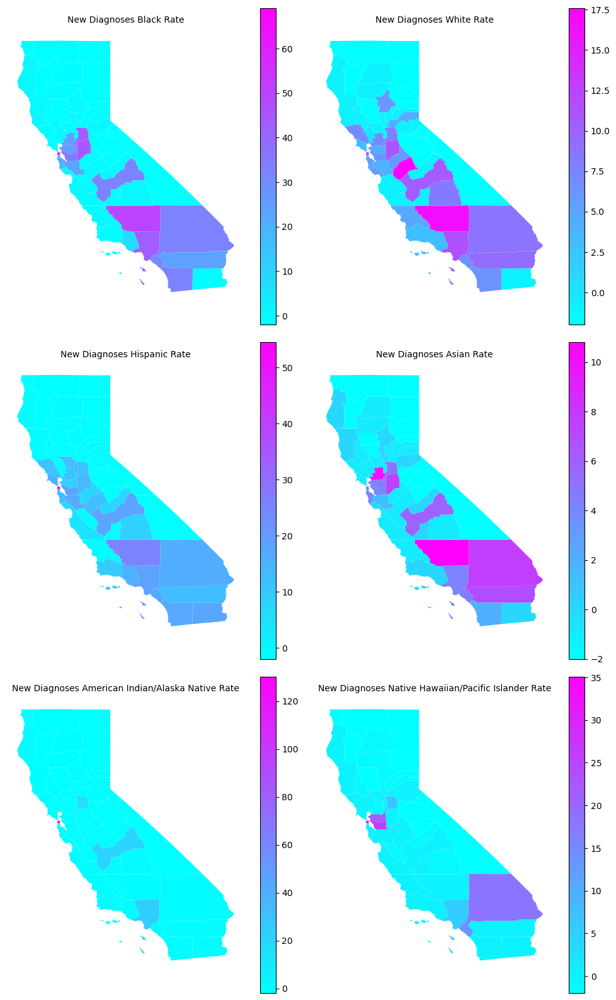

In [72]:
# Show HIV Infection Rate by Race/Ethnic Group ---
# Create a list of all race/ethnic rate feature names:
byrace = ['New Diagnoses Black Rate', 'New Diagnoses White Rate', 'New Diagnoses Hispanic Rate', 
          'New Diagnoses Asian Rate', 'New Diagnoses American Indian/Alaska Native Rate', 
          'New Diagnoses Native Hawaiian/Pacific Islander Rate']

fig, axes = plt.subplots(3,2, figsize=(10,16)) # create a figure with 3 by 2 subplots
axes = axes.flatten() #flatten 2-D array to 1-D array

for i,col in enumerate(byrace): # each i axes, by col 
    CA_svi_hivcovid.plot(ax=axes[i], column=col, legend=True, cmap='cool') # map col to each axes
    axes[i].set_title(col,fontsize=10) # set title by col name
    axes[i].axis('off') # turn off axis display
plt.tight_layout()

Above, we can see a clear distinction between the spread of HIV among race and ethnic groups. Pink and purple represents high rates of infection and blues represent lower rates of infection with baby blue representing no infection. <br><br>
<B>For American Indian/Alaska Native</B>: HIV infection is concentrated in only one or two counties preseumly in San Fransisco. The rate of infection among this group is twice as high as hispanics, and five times higher than the rate of whites. <br>
<B>Native Hawaiian/Pacific Islander</B>: HIV infection is concentrated in a few counties specifically in the Bay Area or in Southern California. The infection rate is not as high compared to American Indian/Alaska Native, which from the map, it is very clear that all of the infection happens in only one location for American Indian/Alaska Native compared to all other ethnic groups. <br> 
<B>For Asian</B>:, HIV is spreading in three main concentrations including Southern California, Middle California, and the Bay Area. Although the spread of infection is more varied in terms of location for this group, this group also has the lowest rates of infection and is the only group with a lower infection rate than Whites. <br>
<B>For Black</B>: HIV is also spreading in three main concentrations but at a much higer rate than Asian and White, about 3 times higher than Whites and slightly higher than Hispanics. <br>
<B>For White</B>: HIV is spreading in various counties with this group having more counties in purple and hot pink than other groups. Based on the map, although more counties are in purple and hot pink, the rate of infection is lower for Whites compared to all other ethnic groups (except Asian). <br>
<B>For Hispaanics</B>: HIV is also spreading in various counties but most counties appear in darker blues and only one location appears in hot pink. The rate of infection for this group os 3 times higher than the rate for Whites.

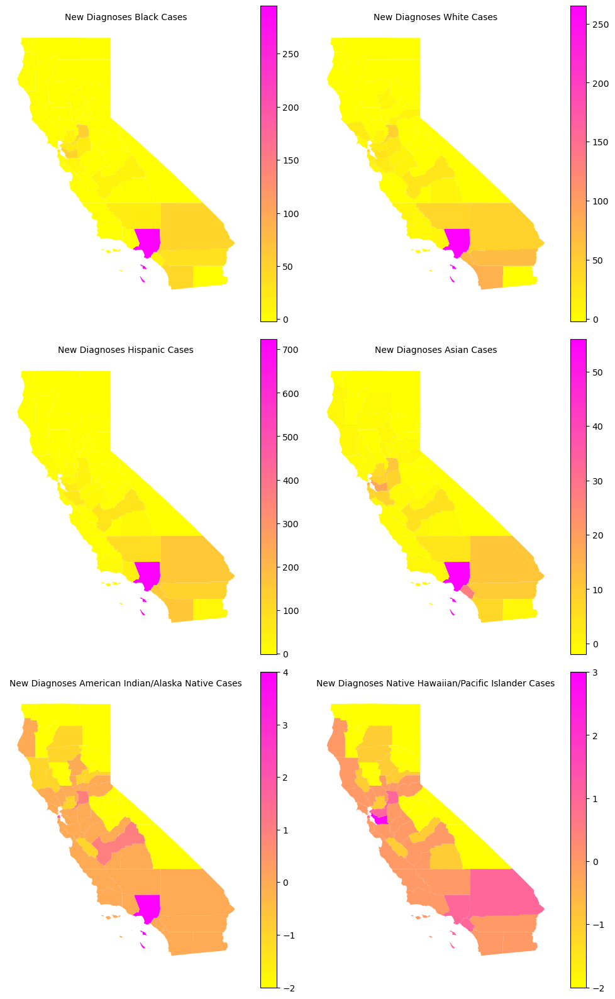

In [73]:
# Show New HIV Cases by Race/Ethnic Group ---
# Create a list of all race/ethnic rate feature names:
byrace_cases = ['New Diagnoses Black Cases', 'New Diagnoses White Cases', 'New Diagnoses Hispanic Cases', 
          'New Diagnoses Asian Cases', 'New Diagnoses American Indian/Alaska Native Cases', 
          'New Diagnoses Native Hawaiian/Pacific Islander Cases']

fig, axes = plt.subplots(3,2, figsize=(10,16)) # create a figure with 3 by 2 subplots
axes = axes.flatten() #flatten 2-D array to 1-D array

for i,col in enumerate(byrace_cases): # each i axes, by col 
    CA_svi_hivcovid.plot(ax=axes[i], column=col, legend=True, cmap='spring_r') # map col to each axes
    axes[i].set_title(col,fontsize=10) # set title by col name
    axes[i].axis('off') # turn off axis display
plt.tight_layout()

Above, by looking at the number of cases, we can see that HIV is spreading higher among certain ethnic groups and concentrated in certain key areas. American Indian/Alaska Native and Native Hawaiian/Pacific Islanders have the lowest number of cases and have cases spread out throughout the state. Whereas, for Black, White, Asian, and Hispanic, the cases are appearing in only one area, Los Angeles. The number of new cases for Hispanics is three times higher than the number of new cases for Black and Whites. The number of cases for Asians is five times lower than the number of cases for Whites. When compared to the previous maps showing the rates of infection, it appears that the rate of infection for American Indian/Alaska Native and Native Hawaiian/Pacific Islanders is very high among their group, but in terms of case numbers, they have signiciantly less number of new cases. Since the infection rate takes into consideration the population of each ethnic group, it is still very interesting to see the dynamic difference in the spread of HIV epidemic among the different ethnic groups. 

#### COVID and Vaccines

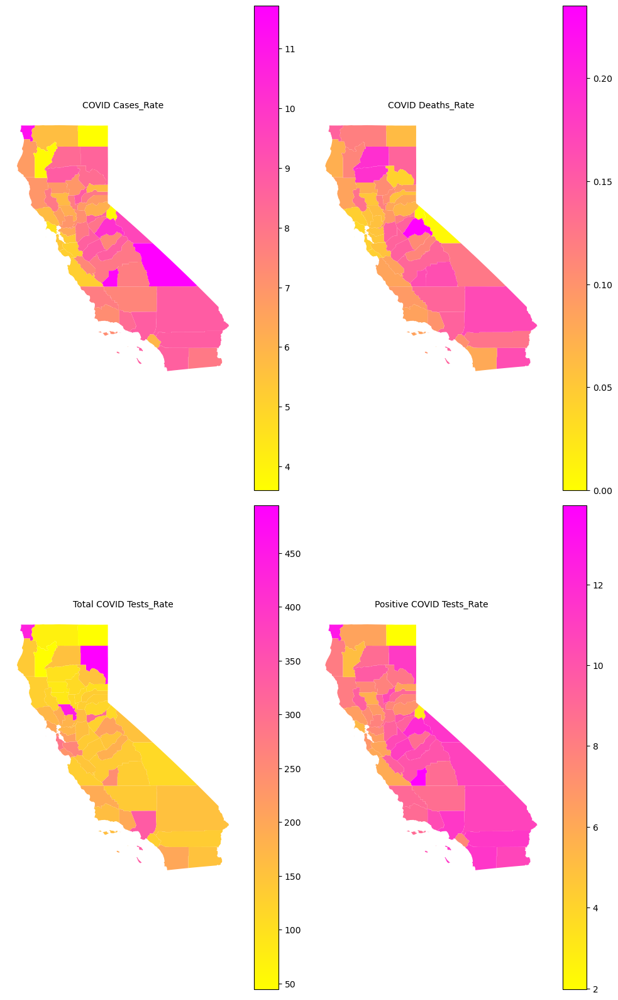

In [74]:
# Show COVID Tests, Cases and Deaths  ---
# Create a list of all COVID Features:
covid = ['COVID Cases_Rate', 'COVID Deaths_Rate', 'Total COVID Tests_Rate', 'Positive COVID Tests_Rate']

fig, axes = plt.subplots(2,2, figsize=(10,16)) # create a figure with 3 by 2 subplots
axes = axes.flatten() #flatten 2-D array to 1-D array

for i,col in enumerate(covid): # each i axes, by col 
    CA_svi_hivcovid.plot(ax=axes[i], column=col, legend=True, cmap='spring_r') # map col to each axes
    axes[i].set_title(col,fontsize=10) # set title by col name
    axes[i].axis('off') # turn off axis display
plt.tight_layout()

Above, we can see differences among communities specifically when it comes to COVID Test_Rates. COVID_Test_Rates is the rate of individuals getting tested for COVID-19. During the pandemic, regular testing was advocated by the CDC and by California which provided free mass testing sites. Based on the map, certain counties had higher testing rates than others specifically a few counties in Northern California and Los Angeles. Although the rate of testing was concentrated to select locations, the positive test rate is spread out throughout most counties in California. In addition, we can see from the map of the COVID Case Rate that higher infection rate occured in middle and Southern California which appears in hot pink compared to Northern Califronia.

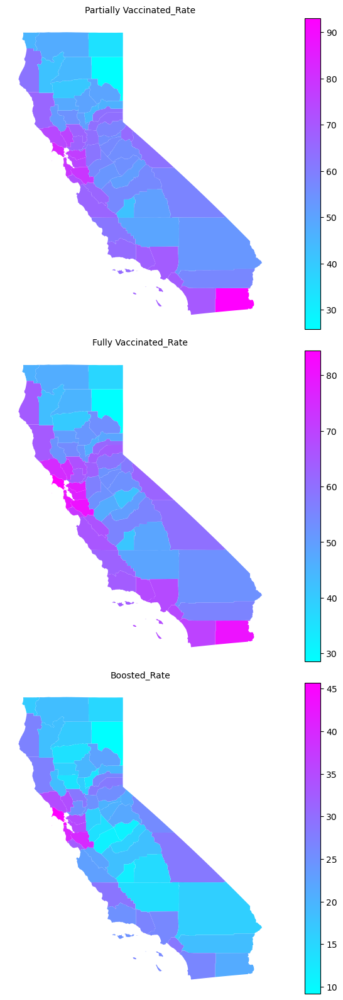

In [75]:
# Show Vaccinations ---
# Create a list of all Vaccine Features:
vaccines = ['Partially Vaccinated_Rate', 'Fully Vaccinated_Rate', 'Boosted_Rate']

fig, axes = plt.subplots(3,1, figsize=(10,16)) # create a figure with 3 by 2 subplots
axes = axes.flatten() #flatten 2-D array to 1-D array

for i,col in enumerate(vaccines): # each i axes, by col 
    CA_svi_hivcovid.plot(ax=axes[i], column=col, legend=True, cmap='cool') # map col to each axes
    axes[i].set_title(col,fontsize=10) # set title by col name
    axes[i].axis('off') # turn off axis display
plt.tight_layout()

Above, we can see that a high percentage of Califorians were partially vaccinated by the end of 2021 with many counties in and around the Bay Area, along the coast, and in Southern California reaching over 80% as shown in dark violet. Similarly, the fully vaccinated rate mirrors the partially vaccinated rate pretty closely. In contrast, the boosted rate as shown in the map shows more counties in blues and only the Bay Area having violets and pinks but with a much lower rate, about half as much as partially vaccinated. 

### Spatial Clusters, Spatial Outliers, and Local Indicator of Spatial Autocorrelation (LISA)

Next, we will explore the spatial patterns and identify spatial clusters as well as atypical locations (spatial outliers) using the new diagnosis HIV rate, PrEP rate, COVID Case_Rate, COVID Tests_Rate, Fully Vaccinated_Rates, EP_MINRTY (percentage of minority), and EP_UNINSUR (percentage of uninsured). We are selecting percentage of uninsured as it represents a key factor for RL_THEME1 (socioeconomic status) but is directly related to healthcare which may be significant when analyzing HIV and COVID. 

#### Construct Spatial Weights and Calculate Local Moran's I 

Queen's method will be used for constructing spatial weights which considers observations that share edges and corners as neighbors. First, a subset of the data will be created, then spatial weights will be applied and Local Moran's I will be calculated. 

In [153]:
# Grab subset of the data with desired features
CA_hivcovid2 = CA_svi_hivcovid[['FIPS', 'COUNTY', 'New Diagnoses Rate', 'PrEP Rate', 'COVID Cases_Rate', 
                                'Total COVID Tests_Rate', 'Fully Vaccinated_Rate', 'EP_MINRTY', 
                                'EP_UNINSUR', 'geometry']]

In [154]:
CA_hivcovid2.head() #check the head of df

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry
0,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8..."
1,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7..."
2,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5..."
3,06007,Butte,5.5,29,6.902268,110.289343,51.381969,28.8,6.0,"POLYGON ((-122.06874 39.84222, -122.06694 39.8..."
4,06009,Calaveras,-1.0,27,7.992955,125.453273,53.171216,19.7,5.3,"POLYGON ((-120.99359 38.22558, -120.99161 38.2..."


In [155]:
# Set index using existing 'FIPS' column
CA_hivcovid3 = CA_hivcovid2.set_index('FIPS', drop=False)
CA_hivcovid3.tail()

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry
FIPS,,,,,,,,,,
06107,06107,Tulare,7.9,36,7.705249,133.590891,48.426272,72.2,7.8,"POLYGON ((-119.56647 36.49434, -119.56366 36.4..."
06109,06109,Tuolumne,0.0,30,10.164085,209.753395,52.734427,20.3,6.1,"POLYGON ((-120.65324 37.83282, -120.64865 37.8..."
06111,06111,Ventura,7.7,68,8.319584,196.026137,68.298569,55.1,8.4,"MULTIPOLYGON (((-119.47784 34.37942, -119.4737..."
06113,06113,Yolo,5.9,40,6.198683,449.807255,66.626120,54.2,4.3,"POLYGON ((-122.42149 38.90233, -122.42190 38.9..."
06115,06115,Yuba,-1.0,30,8.808173,113.725564,45.854458,46.0,7.1,"POLYGON ((-121.63631 39.24941, -121.63581 39.2..."


In [156]:
# Create spatial weight object using Queen's Method
w = weights.Queen.from_dataframe(CA_hivcovid3, idVariable='FIPS')

In [157]:
# Row Standardize Spatial Weights
w.transform = 'R'

##### Local Moran's I for New Diagnoses Rate 

In [158]:
# Calculate Local Moran's I 
lm = esda.Moran_Local(CA_hivcovid3['New Diagnoses Rate'], w)

In [159]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_NDR'] = lm.z # z-score of Local Moran's I
CA_hivcovid3['LMP_NDR'] = lm.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_NDR'] = lm.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR
FIPS,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2


##### Local Moran's I for PrEP Rate

In [160]:
# Calculate Local Moran's I 
lm2 = esda.Moran_Local(CA_hivcovid3['PrEP Rate'], w)

In [161]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_PR'] = lm2.z # z-score of Local Moran's I
CA_hivcovid3['LMP_PR'] = lm2.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_PR'] = lm2.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR,LMZ_PR,LMP_PR,LMQ_PR
FIPS,,,,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1,0.489133,0.037,1
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3,-0.643939,0.042,3
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2,-0.292000,0.034,3


##### Local Moran's I for COVID Cases Rate

In [162]:
# Calculate Local Moran's I 
lm3 = esda.Moran_Local(CA_hivcovid3['COVID Cases_Rate'], w)

In [163]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_CCR'] = lm3.z # z-score of Local Moran's I
CA_hivcovid3['LMP_CCR'] = lm3.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_CCR'] = lm3.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR,LMZ_PR,LMP_PR,LMQ_PR,LMZ_CCR,LMP_CCR,LMQ_CCR
FIPS,,,,,,,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1,0.489133,0.037,1,-1.167088,0.193,3
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3,-0.643939,0.042,3,-2.004203,0.071,2
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2,-0.292000,0.034,3,0.736475,0.186,4


##### Local Moran's I for Total COVID Tests Rate

In [164]:
# Calculate Local Moran's I 
lm4 = esda.Moran_Local(CA_hivcovid3['Total COVID Tests_Rate'], w)

In [165]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_TCTR'] = lm4.z # z-score of Local Moran's I
CA_hivcovid3['LMP_TCTR'] = lm4.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_TCTR'] = lm4.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR,LMZ_PR,LMP_PR,LMQ_PR,LMZ_CCR,LMP_CCR,LMQ_CCR,LMZ_TCTR,LMP_TCTR,LMQ_TCTR
FIPS,,,,,,,,,,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1,0.489133,0.037,1,-1.167088,0.193,3,0.478316,0.250,1
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3,-0.643939,0.042,3,-2.004203,0.071,2,-0.684694,0.363,2
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2,-0.292000,0.034,3,0.736475,0.186,4,1.561273,0.163,4


##### Local Moran's I for Fully Vaccinated Rate

In [166]:
# Calculate Local Moran's I 
lm5 = esda.Moran_Local(CA_hivcovid3['Fully Vaccinated_Rate'], w)

In [167]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_FVR'] = lm5.z # z-score of Local Moran's I
CA_hivcovid3['LMP_FVR'] = lm5.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_FVR'] = lm5.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR,LMZ_PR,LMP_PR,LMQ_PR,LMZ_CCR,LMP_CCR,LMQ_CCR,LMZ_TCTR,LMP_TCTR,LMQ_TCTR,LMZ_FVR,LMP_FVR,LMQ_FVR
FIPS,,,,,,,,,,,,,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1,0.489133,0.037,1,-1.167088,0.193,3,0.478316,0.250,1,1.484751,0.028,1
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3,-0.643939,0.042,3,-2.004203,0.071,2,-0.684694,0.363,2,-0.087535,0.318,3
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2,-0.292000,0.034,3,0.736475,0.186,4,1.561273,0.163,4,-0.513489,0.440,3


##### Local Moran's I for EP_MINRTY	

In [168]:
# Calculate Local Moran's I 
lm6 = esda.Moran_Local(CA_hivcovid3['EP_MINRTY'], w)

In [169]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_MIN'] = lm6.z # z-score of Local Moran's I
CA_hivcovid3['LMP_MIN'] = lm6.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_MIN'] = lm6.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR,LMZ_PR,LMP_PR,LMQ_PR,LMZ_CCR,LMP_CCR,LMQ_CCR,LMZ_TCTR,LMP_TCTR,LMQ_TCTR,LMZ_FVR,LMP_FVR,LMQ_FVR,LMZ_MIN,LMP_MIN,LMQ_MIN
FIPS,,,,,,,,,,,,,,,,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1,0.489133,0.037,1,-1.167088,0.193,3,0.478316,0.250,1,1.484751,0.028,1,1.132863,0.029,1
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3,-0.643939,0.042,3,-2.004203,0.071,2,-0.684694,0.363,2,-0.087535,0.318,3,0.084524,0.004,4
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2,-0.292000,0.034,3,0.736475,0.186,4,1.561273,0.163,4,-0.513489,0.440,3,-1.206908,0.328,3


##### Local Moran's I for EP_UNINSUR

In [170]:
# Calculate Local Moran's I 
lm7 = esda.Moran_Local(CA_hivcovid3['EP_UNINSUR'], w)

In [171]:
# write z,p-value, quandrant type of Local Moran's I to GeoDataFrame
CA_hivcovid3['LMZ_UNI'] = lm7.z # z-score of Local Moran's I
CA_hivcovid3['LMP_UNI'] = lm7.p_sim # p-value of Local Moran's I
CA_hivcovid3['LMQ_UNI'] = lm7.q # quadrant type of Local Moran's I
CA_hivcovid3.head(3) #view head

,FIPS,COUNTY,New Diagnoses Rate,PrEP Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,EP_MINRTY,EP_UNINSUR,geometry,LMZ_NDR,LMP_NDR,LMQ_NDR,LMZ_PR,LMP_PR,LMQ_PR,LMZ_CCR,LMP_CCR,LMQ_CCR,LMZ_TCTR,LMP_TCTR,LMQ_TCTR,LMZ_FVR,LMP_FVR,LMQ_FVR,LMZ_MIN,LMP_MIN,LMQ_MIN,LMZ_UNI,LMP_UNI,LMQ_UNI
FIPS,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
06001,06001,Alameda,11.1,131,5.248160,215.026164,77.214829,69.4,4.3,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",0.929014,0.036,1,0.489133,0.037,1,-1.167088,0.193,3,0.478316,0.250,1,1.484751,0.028,1,1.132863,0.029,1,-1.197487,0.015,3
06003,06003,Alpine,0.0,-1,3.760072,112.444047,57.654432,48.7,7.6,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",-0.919254,0.013,3,-0.643939,0.042,3,-2.004203,0.071,2,-0.684694,0.363,2,-0.087535,0.318,3,0.084524,0.004,4,0.463375,0.476,1
06005,06005,Amador,-1.0,40,8.632011,310.547351,52.355246,23.2,5.1,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",-1.085764,0.496,2,-0.292000,0.034,3,0.736475,0.186,4,1.561273,0.163,4,-0.513489,0.440,3,-1.206908,0.328,3,-0.794854,0.145,3


#### Statistically Signifciant Spatial Clusters/Outliers 

For the statistical significance, we will use a threshold of <B>0.05</B> and flag locations that are signicifant spatial clusters (HH, LL) and outliers (HL, LH) based on Moran's Four Quadrants. 

In [200]:
# set color palette for LM Quadrant Type for HIV Features
lmq_h = {'HH':'darkmagenta','LL':'orchid','HL':'blue','LH':'paleturquoise'}

# set color palette for LM Quadrant Type for COVID Features
lmq_c = {'HH':'gold','LL':'yellow','HL':'olivedrab','LH':'darkgreen'}

# set color palette for LM Quadrant Type for SVI Features
lmq_s = {'HH':'deeppink','LL':'fuchsia','HL':'salmon','LH':'sandybrown'}

##### Significant Clusters for New Diagnoses Rate 

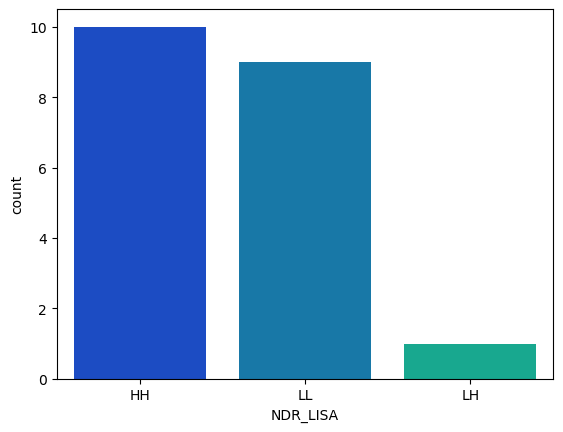

In [173]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_NDR'] == 1) & (CA_hivcovid3['LMP_NDR'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_NDR'] == 2) & (CA_hivcovid3['LMP_NDR'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_NDR'] == 3) & (CA_hivcovid3['LMP_NDR'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_NDR'] == 4) & (CA_hivcovid3['LMP_NDR'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'NDR_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'NDR_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'NDR_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'NDR_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='NDR_LISA', palette='winter') 
plt.show() #show plot

In [174]:
# Create Lisa Series and Drop NA Values:
NDR_lisa2 = CA_hivcovid3['NDR_LISA'].dropna()

In [175]:
# Define Style Function for NDA
def style_NDR(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = NDR_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_h[lmq_type], 'color':'white'}

##### Significant Clusters for PrEP Rate 

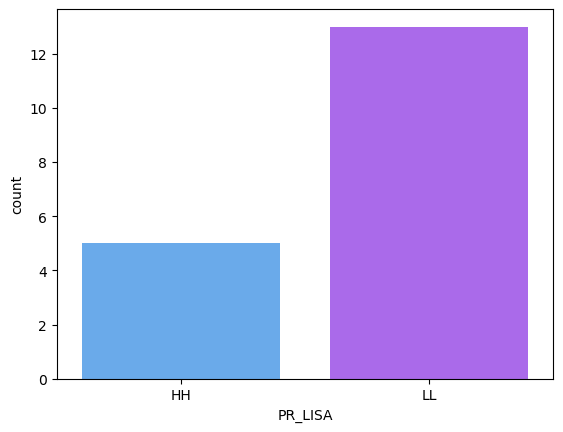

In [176]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_PR'] == 1) & (CA_hivcovid3['LMP_PR'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_PR'] == 2) & (CA_hivcovid3['LMP_PR'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_PR'] == 3) & (CA_hivcovid3['LMP_PR'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_PR'] == 4) & (CA_hivcovid3['LMP_PR'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'PR_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'PR_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'PR_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'PR_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='PR_LISA', palette='cool') 
plt.show() #show plot

In [177]:
# Create Lisa Series and Drop NA Values:
PR_lisa2 = CA_hivcovid3['PR_LISA'].dropna()

In [178]:
# Define Style Function for PR
def style_PR(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = PR_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_h[lmq_type], 'color':'white'}

##### Significant Clusters for COVID Cases Rate

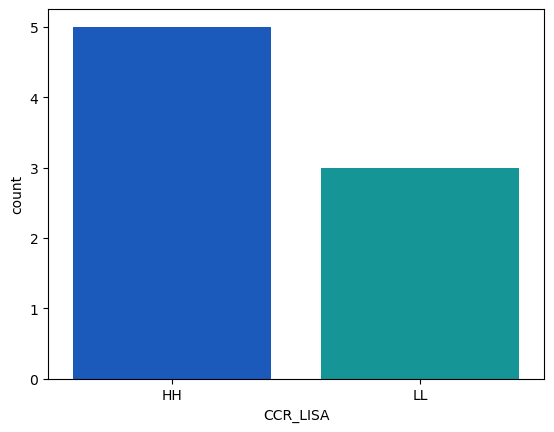

In [179]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_CCR'] == 1) & (CA_hivcovid3['LMP_CCR'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_CCR'] == 2) & (CA_hivcovid3['LMP_CCR'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_CCR'] == 3) & (CA_hivcovid3['LMP_CCR'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_CCR'] == 4) & (CA_hivcovid3['LMP_CCR'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'CCR_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'CCR_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'CCR_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'CCR_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='CCR_LISA', palette='winter') 
plt.show() #show plot

In [180]:
# Create Lisa Series and Drop NA Values:
CCR_lisa2 = CA_hivcovid3['CCR_LISA'].dropna()

In [181]:
# Define Style Function for PR
def style_CCR(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = CCR_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_c[lmq_type], 'color':'white'}

##### Significant Clusters for Total COVID Tests Rate

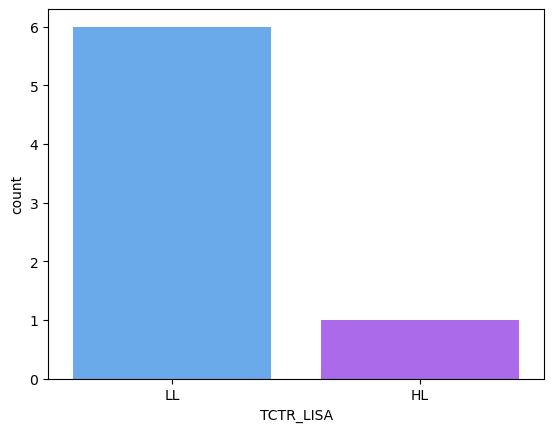

In [182]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_TCTR'] == 1) & (CA_hivcovid3['LMP_TCTR'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_TCTR'] == 2) & (CA_hivcovid3['LMP_TCTR'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_TCTR'] == 3) & (CA_hivcovid3['LMP_TCTR'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_TCTR'] == 4) & (CA_hivcovid3['LMP_TCTR'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'TCTR_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'TCTR_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'TCTR_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'TCTR_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='TCTR_LISA', palette='cool') 
plt.show() #show plot

In [183]:
# Create Lisa Series and Drop NA Values:
TCTR_lisa2 = CA_hivcovid3['TCTR_LISA'].dropna()

In [184]:
# Define Style Function for PR
def style_TCTR(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = TCTR_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_c[lmq_type], 'color':'white'}

##### Significant Clusters for Fully Vaccinated Rate

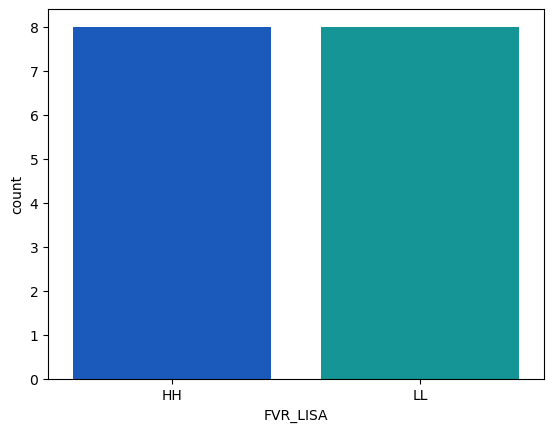

In [185]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_FVR'] == 1) & (CA_hivcovid3['LMP_FVR'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_FVR'] == 2) & (CA_hivcovid3['LMP_FVR'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_FVR'] == 3) & (CA_hivcovid3['LMP_FVR'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_FVR'] == 4) & (CA_hivcovid3['LMP_FVR'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'FVR_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'FVR_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'FVR_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'FVR_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='FVR_LISA', palette='winter') 
plt.show() #show plot

In [186]:
# Create Lisa Series and Drop NA Values:
FVR_lisa2 = CA_hivcovid3['FVR_LISA'].dropna()

In [187]:
# Define Style Function for PR
def style_FVR(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = FVR_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_c[lmq_type], 'color':'white'}

##### Significant Clusters for EP_MINTRY

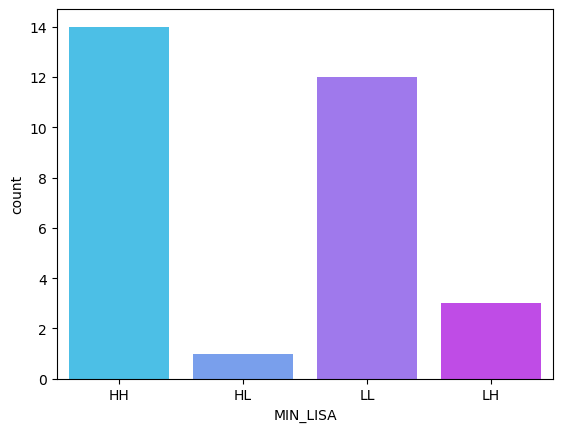

In [188]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_MIN'] == 1) & (CA_hivcovid3['LMP_MIN'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_MIN'] == 2) & (CA_hivcovid3['LMP_MIN'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_MIN'] == 3) & (CA_hivcovid3['LMP_MIN'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_MIN'] == 4) & (CA_hivcovid3['LMP_MIN'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'MIN_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'MIN_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'MIN_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'MIN_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='MIN_LISA', palette='cool') 
plt.show() #show plot

In [189]:
# Create Lisa Series and Drop NA Values:
MIN_lisa2 = CA_hivcovid3['MIN_LISA'].dropna()

In [201]:
# Define Style Function for PR
def style_MIN(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = MIN_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_s[lmq_type], 'color':'white'}

##### Significant Clusters for EP_UNINSUR

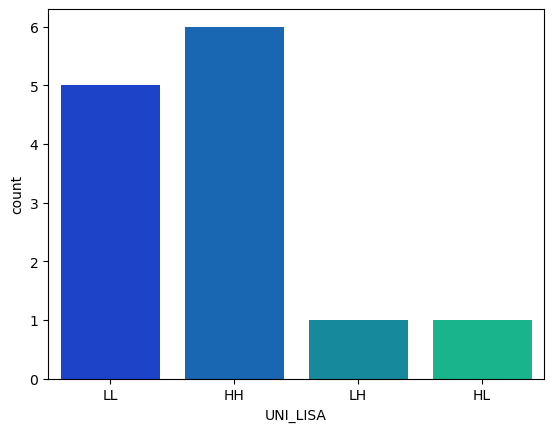

In [191]:
# Set conditions for each of Moran Plot's Quadrants
cond_hh = (CA_hivcovid3['LMQ_UNI'] == 1) & (CA_hivcovid3['LMP_UNI'] <= 0.05) #less than or equal to 0.05
cond_lh = (CA_hivcovid3['LMQ_UNI'] == 2) & (CA_hivcovid3['LMP_UNI'] <= 0.05) #less than or equal to 0.05
cond_ll = (CA_hivcovid3['LMQ_UNI'] == 3) & (CA_hivcovid3['LMP_UNI'] <= 0.05) #less than or equal to 0.05
cond_hl = (CA_hivcovid3['LMQ_UNI'] == 4) & (CA_hivcovid3['LMP_UNI'] <= 0.05) #less than or equal to 0.05

# 'LISA_Type' to 'HH' if quadrant type is 1 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hh,'UNI_LISA'] = 'HH'

# 'LISA_Type' to 'LH' if quadrant type is 2 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_lh,'UNI_LISA'] = 'LH'

# 'LISA_Type' to 'LL' if quadrant type is 3 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_ll,'UNI_LISA'] = 'LL'

# 'LISA_Type' to 'HL' if quadrant type is 4 and p-value of local moran's I is less than or equal to 0.05
CA_hivcovid3.loc[cond_hl,'UNI_LISA'] = 'HL'

# Countplot showing the number of tracts that fall into the four quadrant types
sns.countplot(data=CA_hivcovid3, x='UNI_LISA', palette='winter') 
plt.show() #show plot

In [192]:
# Create Lisa Series and Drop NA Values:
UNI_lisa2 = CA_hivcovid3['UNI_LISA'].dropna()

In [202]:
# Define Style Function for PR
def style_UNI(feature):
    # get LM Quadrant Type of GeoJson feature by FIPS code, and set it to lmq_type
    # set Null to lmq_type if there is no LM Quadrant Type in lisa_series 
    lmq_type = UNI_lisa2.get(feature['properties']['FIPS'],None) 
    # gray polygon if LMQ type is None (not statistically significant)
    if lmq_type is None:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':'silver', 'color':'white'}
    # use color palette for fillColor otherwise
    else:
        return {'fillOpacity':0.5, 'weight':0.5, 'fillColor':lmq_s[lmq_type], 'color':'white'}

#### Interactive LISA (Local Indicator of Spatial Autocorrelation) Map

In [194]:
# Get XY Coordinates of Mean Center
mc_x = CA_hivcovid3.geometry.centroid.x.mean()
mc_y = CA_hivcovid3.geometry.centroid.y.mean()
print(mc_x, mc_y)

-120.72791323021316 37.845340064561746


In [203]:
# Create map centered around mean coordinates with zoom_start 6 
lisa_m = folium.Map(location=[mc_y, mc_x],zoom_start=6,tiles='cartodbpositron')

# Tool Tip for New Diagnoses Rate
tt_NDR = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','New Diagnoses Rate','NDR_LISA'])

# Tool Tip for PrEP Rate
tt_PR = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','PrEP Rate','PR_LISA'])

# Tool Tip for COVID Case Rate
tt_CCR = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','COVID Cases_Rate','CCR_LISA'])

# Tool Tip for Total COVID Test Rate
tt_TCTR = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','Total COVID Tests_Rate','TCTR_LISA'])

# Tool Tip for Fully Vaccinated Rate
tt_FVR = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','Fully Vaccinated_Rate','FVR_LISA'])

# Tool Tip for EP_MINITRY Rate
tt_MIN = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','EP_MINRTY','MIN_LISA'])

# Tool Tip for EP_UNINSUR Rate
tt_UNI = folium.GeoJsonTooltip(fields=['FIPS','COUNTY','EP_UNINSUR','UNI_LISA'])

# Set ToolTip objects to tooltip to be shown to map
folium.GeoJson(CA_hivcovid3, style_function=style_NDR, tooltip=tt_NDR, name='HIV Infection Rate').add_to(lisa_m) # NDR
folium.GeoJson(CA_hivcovid3, style_function=style_PR, tooltip=tt_PR, name='PrEP User Rate').add_to(lisa_m) # PR
folium.GeoJson(CA_hivcovid3, style_function=style_CCR, tooltip=tt_CCR, name='COVID Infection Rate').add_to(lisa_m) # CCR
folium.GeoJson(CA_hivcovid3, style_function=style_TCTR, tooltip=tt_TCTR, name='COVID Testing Rate').add_to(lisa_m) # TCTR
folium.GeoJson(CA_hivcovid3, style_function=style_FVR, tooltip=tt_FVR, name='Fully Vaccinated Rate').add_to(lisa_m) # FVR
folium.GeoJson(CA_hivcovid3, style_function=style_MIN, tooltip=tt_MIN, name='Percentage of Ethnic Minority').add_to(lisa_m) # MIN
folium.GeoJson(CA_hivcovid3, style_function=style_UNI, tooltip=tt_UNI, name='Percentage of Uninsured Health').add_to(lisa_m) # UNI

# Add LayerControl to turn on/off layers
folium.LayerControl().add_to(lisa_m)

lisa_m # zoom in to explore areas of your interest spatially

The interactive LISA map allows us to view the significant spatial clusters and outliers and overlay the significance or outliers by color for comparsion between two features spatially. The above LISA map considers a statistical significance at 0.05. Using the map the following could be evaluated between the features:  

<B> HIV Infection Rate</B>: HH clusters appear in dark purple in counties in Southern California including Los Angeles, Ventura, Orange, San Bernandino, Riverside, and San Diego and in the Bay Area including Marin, Contra Costa, and Alameda. LL clusters appear violet in Northern Califronia. There is one county that appears as an LH Outlier which is Inyo County, which appears to have no new HIV infections. 

<B>COVID Infection Rate</B>: HH clusters appear in Central California in gold including Kern, Tulare, Madera, and Mariposa and LL clusters appear in San Mateo and Santa Cruz counties. There are no spatial outliers for COVID infection rate. 

<B> HIV and COVID Infection Spatial Signifance</B>: From the LISA map we can see that there are no overlapping spaital clusters or outliers between HIV and COVID infection. The significant spatial clusters for HIV infection occur in Southern California and specific counties north of San Fransisco whereas significant spatial clusters for COVID infection occur in Central California. Moreover, while the two epidemics continue to spread in California, the areas with spatial signicifance in the spread of the infection appear to be different. 

<B>Racial/Ethnic Minority Percentage</B>: HH clusters appear in dark pink in counties in Southern California including Los Angeles, Ventura, Orange, San Bernandino, Riverside, and San Diego and in the Bay Area including Marin, Contra Costra, and Alameda. Kings county in Central California is also an HH cluster. LL clusters appear in almost all counties in Northern California. LH Outliers appear in Inyo, San Luis Obispo, and Santa Cruz with Alphine county appearing as HL outlier. 

<B> HIV and Racial/Ethnic Minority Spatial Significance</B>: From the LISA map we can see that there is significant overlap between the spatial clusters and outliers for HIV infection and for Racial/Ethnic Minority percentage. Both features overlap in terms of HH clusters as well as several LL clusters. Both features also share Inyo county as an LL outlier. Moreover, the counties that are significant for HIV infection and also significance for Racial/Ethnic Minority status are Los Angeles, Ventura, Orange, San Bernandino, Riverside, San Diego, Marin, Contra Costra, and Alameda. 

<B> COVID and Racial/Ethnic Minority Spatial Significance</B>: When comparing the spatial clusters between COVID infection rate and Racial/Ethnic Minority, both features have HH clusters in two of the same counties: Fresno and Kern. These two counties are experiencing high levels of COVID infection as well as high percentage of racial and ethnic minorities. 

<B>Uninsured (Healthcare Coverage) Percentage</B>: HH clusters appear in dark pink in counties in Central California including Madera, Fresno, Kern, Ventura, and Orange in Southern California. LL clusters appear in Nothern California including Sacramento, San Joaquin, Alameda, San Mateo, and San Fransisco. San Luis Obispo is an LH outlier and Sierra is an HL outlier. 

<B>HIV and Uninsured Percentage</B>: From the LISA map we can see that Orange county overlaps in spatial clusters for HIV infection and percentage of uninsured individuals. These two features also share a common LL cluster, Alameda county.

<B>COVID and Uninsured Percentage</B>: When comparing the spatial clusters between COVID innfection rate and percent of uninsured indvididuals, both features have HH clusters in two counties in Central California: Mariposa and Kern. These two counties are experiencing high levels of COVID infection as well as high percentage of uninsured individuals. 

Moreover, Kern county is an HH cluster for Uninsured, Racial/Ethnic Minority, and COVID infection. This county is experiencing several levels of social vulnerability while having higher rates of COVID infection. In terms of vaccinations and testing, not surprisingly, the uninsured and racial/ethnic minority features do not have overlap in spatial clusters with COVID Testing or Vaccinations. Whereas, there are some spatial cluster overlapping between PrEP Users and HIV Infection, but PrEP Users do not significantly overlap with COVID infection. Instead, there are some HH cluster overlapping in Northern Califonia between PrEP Users and Fully Vaccination rates.

## Clustering  Analysis

To explore the intersection of HIV, COVID, and Social Vulnerability further, agglormerative hierachical clustering and regionalization will be performed. The following features will be explored: New Diagnoses Black Rate, New Diagnoses White Rate, New Diagnoses Hispanic Rate, New Diagnoses Asian Rate, New Diagnoses American Indian/Alaska Native Rate, New Diagnoses Native Hawaiian/Pacific Islander Rate, COVID Cases_Rate, Total COVID Tests_Rate, Fully Vaccinated_Rate, RPL_THEME1, and RPL_THEME3.

In [317]:
# Grab subset of the data with desired features
CA_hivcovid4 = CA_svi_hivcovid[['FIPS','New Diagnoses Black Rate', 'New Diagnoses White Rate', 
                                'New Diagnoses Hispanic Rate', 'New Diagnoses Asian Rate', 
                                'New Diagnoses American Indian/Alaska Native Rate', 
                                'New Diagnoses Native Hawaiian/Pacific Islander Rate', 
                                'COVID Cases_Rate', 'Total COVID Tests_Rate', 'Fully Vaccinated_Rate',
                                'RPL_THEME1', 'RPL_THEME3', 'geometry']]

In [318]:
# View Head of DF:
CA_hivcovid4.head(3)

,FIPS,New Diagnoses Black Rate,New Diagnoses White Rate,New Diagnoses Hispanic Rate,New Diagnoses Asian Rate,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,RPL_THEME1,RPL_THEME3,geometry
0,06001,34.4,6.0,18.2,3.9,0.0,26.2,5.248160,215.026164,77.214829,0.2281,0.8596,"POLYGON ((-122.34225 37.80556, -122.33412 37.8..."
1,06003,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,3.760072,112.444047,57.654432,0.3684,0.4912,"POLYGON ((-120.07239 38.70277, -120.06762 38.7..."
2,06005,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,8.632011,310.547351,52.355246,0.0877,0.1754,"POLYGON ((-121.02741 38.50354, -121.02747 38.5..."


In [319]:
# initialize random number to make it predictable
np.random.seed(123)

In [320]:
# Create list of features without FIPS and geometry:
clust_feats = CA_hivcovid4.columns[1:-1]

In [321]:
clust_feats #check feature list

Index(['New Diagnoses Black Rate', 'New Diagnoses White Rate',
       'New Diagnoses Hispanic Rate', 'New Diagnoses Asian Rate',
       'New Diagnoses American Indian/Alaska Native Rate',
       'New Diagnoses Native Hawaiian/Pacific Islander Rate',
       'COVID Cases_Rate', 'Total COVID Tests_Rate', 'Fully Vaccinated_Rate',
       'RPL_THEME1', 'RPL_THEME3'],
      dtype='object')

### Agglomerative Non-Spatial Clustering

In [322]:
# Identify 7 Clusters ---
# Create cluster objects by fitting clusters into the 12 features:
cl_ag7 = cluster.AgglomerativeClustering(n_clusters=7).fit(CA_hivcovid4[clust_feats])

# Write cluster labels to the column 'Agglomerative Nonspatial'
CA_hivcovid4['Agglomerative Nonspatial-7_Clusters'] = cl_ag7.labels_

CA_hivcovid4.head() # View head 

,FIPS,New Diagnoses Black Rate,New Diagnoses White Rate,New Diagnoses Hispanic Rate,New Diagnoses Asian Rate,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,RPL_THEME1,RPL_THEME3,geometry,Agglomerative Nonspatial-7_Clusters
0,06001,34.4,6.0,18.2,3.9,0.0,26.2,5.248160,215.026164,77.214829,0.2281,0.8596,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",1
1,06003,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,3.760072,112.444047,57.654432,0.3684,0.4912,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",0
2,06005,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,8.632011,310.547351,52.355246,0.0877,0.1754,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",2
3,06007,0.0,6.1,-1.0,0.0,0.0,-1.0,6.902268,110.289343,51.381969,0.5789,0.2456,"POLYGON ((-122.06874 39.84222, -122.06694 39.8...",0
4,06009,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,7.992955,125.453273,53.171216,0.1579,0.0526,"POLYGON ((-120.99359 38.22558, -120.99161 38.2...",0


In [323]:
# Identify 6 Clusters ---
# Create cluster objects by fitting clusters into the 12 features:
cl_ag6 = cluster.AgglomerativeClustering(n_clusters=6).fit(CA_hivcovid4[clust_feats])

# Write cluster labels to the column 'Agglomerative Nonspatial'
CA_hivcovid4['Agglomerative Nonspatial-6_Clusters'] = cl_ag6.labels_

CA_hivcovid4.head() # View head 

,FIPS,New Diagnoses Black Rate,New Diagnoses White Rate,New Diagnoses Hispanic Rate,New Diagnoses Asian Rate,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,RPL_THEME1,RPL_THEME3,geometry,Agglomerative Nonspatial-7_Clusters,Agglomerative Nonspatial-6_Clusters
0,06001,34.4,6.0,18.2,3.9,0.0,26.2,5.248160,215.026164,77.214829,0.2281,0.8596,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",1,1
1,06003,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,3.760072,112.444047,57.654432,0.3684,0.4912,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",0,0
2,06005,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,8.632011,310.547351,52.355246,0.0877,0.1754,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",2,2
3,06007,0.0,6.1,-1.0,0.0,0.0,-1.0,6.902268,110.289343,51.381969,0.5789,0.2456,"POLYGON ((-122.06874 39.84222, -122.06694 39.8...",0,0
4,06009,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,7.992955,125.453273,53.171216,0.1579,0.0526,"POLYGON ((-120.99359 38.22558, -120.99161 38.2...",0,0


### Agglomerative Clustering with Spatial Contraints

In [324]:
# Identify 7 Clusters with Spatial Contraints using Queen's Method for Spatial Weights ---
# Create a spatial weight matrix based on queen method
w2 = weights.Queen.from_dataframe(CA_hivcovid4)

# Create cluster objects by fitting clusters into the 12 features:
cl_sc7 = cluster.AgglomerativeClustering(n_clusters=7,connectivity=w.sparse).fit(CA_hivcovid4[clust_feats])

# Write cluster labels to the column "Agglomerative Spatial"
CA_hivcovid4['Agglomerative Spatial-7_Clusters'] = cl_sc7.labels_

CA_hivcovid4.head() # View head 

,FIPS,New Diagnoses Black Rate,New Diagnoses White Rate,New Diagnoses Hispanic Rate,New Diagnoses Asian Rate,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,RPL_THEME1,RPL_THEME3,geometry,Agglomerative Nonspatial-7_Clusters,Agglomerative Nonspatial-6_Clusters,Agglomerative Spatial-7_Clusters
0,06001,34.4,6.0,18.2,3.9,0.0,26.2,5.248160,215.026164,77.214829,0.2281,0.8596,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",1,1,0
1,06003,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,3.760072,112.444047,57.654432,0.3684,0.4912,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",0,0,2
2,06005,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,8.632011,310.547351,52.355246,0.0877,0.1754,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",2,2,0
3,06007,0.0,6.1,-1.0,0.0,0.0,-1.0,6.902268,110.289343,51.381969,0.5789,0.2456,"POLYGON ((-122.06874 39.84222, -122.06694 39.8...",0,0,2
4,06009,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,7.992955,125.453273,53.171216,0.1579,0.0526,"POLYGON ((-120.99359 38.22558, -120.99161 38.2...",0,0,2


In [326]:
# Identify 6 Clusters with Spatial Contraints using Queen's Method for Spatial Weights ---
# Create a spatial weight matrix based on queen method
w2 = weights.Queen.from_dataframe(CA_hivcovid4)

# Create cluster objects by fitting clusters into the 12 features:
cl_sc6 = cluster.AgglomerativeClustering(n_clusters=6,connectivity=w.sparse).fit(CA_hivcovid4[clust_feats])

# Write cluster labels to the column "Agglomerative Spatial"
CA_hivcovid4['Agglomerative Spatial-6_Clusters'] = cl_sc6.labels_

CA_hivcovid4.head() # View head 

,FIPS,New Diagnoses Black Rate,New Diagnoses White Rate,New Diagnoses Hispanic Rate,New Diagnoses Asian Rate,New Diagnoses American Indian/Alaska Native Rate,New Diagnoses Native Hawaiian/Pacific Islander Rate,COVID Cases_Rate,Total COVID Tests_Rate,Fully Vaccinated_Rate,RPL_THEME1,RPL_THEME3,geometry,Agglomerative Nonspatial-7_Clusters,Agglomerative Nonspatial-6_Clusters,Agglomerative Spatial-7_Clusters,Agglomerative Spatial-6_Clusters
0,06001,34.4,6.0,18.2,3.9,0.0,26.2,5.248160,215.026164,77.214829,0.2281,0.8596,"POLYGON ((-122.34225 37.80556, -122.33412 37.8...",1,1,0,2
1,06003,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,3.760072,112.444047,57.654432,0.3684,0.4912,"POLYGON ((-120.07239 38.70277, -120.06762 38.7...",0,0,2,0
2,06005,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,8.632011,310.547351,52.355246,0.0877,0.1754,"POLYGON ((-121.02741 38.50354, -121.02747 38.5...",2,2,0,2
3,06007,0.0,6.1,-1.0,0.0,0.0,-1.0,6.902268,110.289343,51.381969,0.5789,0.2456,"POLYGON ((-122.06874 39.84222, -122.06694 39.8...",0,0,2,0
4,06009,-2.0,-2.0,-2.0,-2.0,-2.0,-2.0,7.992955,125.453273,53.171216,0.1579,0.0526,"POLYGON ((-120.99359 38.22558, -120.99161 38.2...",0,0,2,0


### Plot and View Cluster Maps

#### 6-Clusters

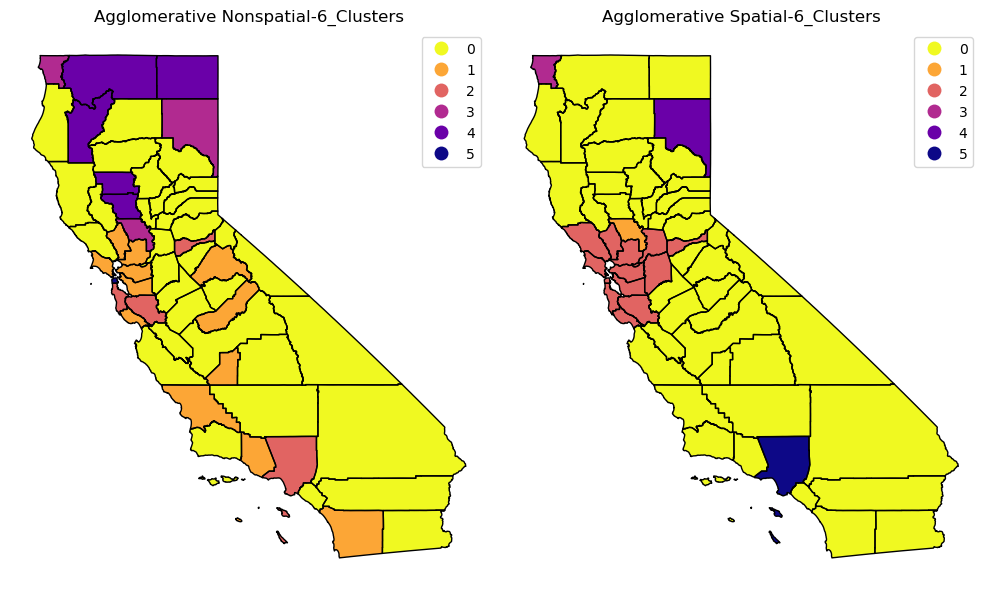

In [327]:
# Clustering Methods:
clust_list2 = ['Agglomerative Nonspatial-6_Clusters','Agglomerative Spatial-6_Clusters']

# Create figure and axes object with 1 row and 2 columns
# in which each column corresponds to each of clustering methods
fig,axes=plt.subplots(1,2,figsize=(10,16))

# Plot figure with 2 axes (subplots) showing clustering results
# Title of each axis is set to the name of clustering methods
for i, method in enumerate(clust_list2): # for each of a list of clustering methods
    # plot a categorical (unique value) map of gdf
    CA_hivcovid4.plot(column=method, legend=True, categorical=True, ax=axes[i], cmap='plasma_r')
    CA_svi.plot(edgecolor='k', facecolor='None', ax=axes[i]) # plot boundaries of CA Counties
    axes[i].set_title(method) # set title for each axis
    axes[i].axis('off')     # turn off an axis

plt.tight_layout() #make tight layout

#### 7-Clusters

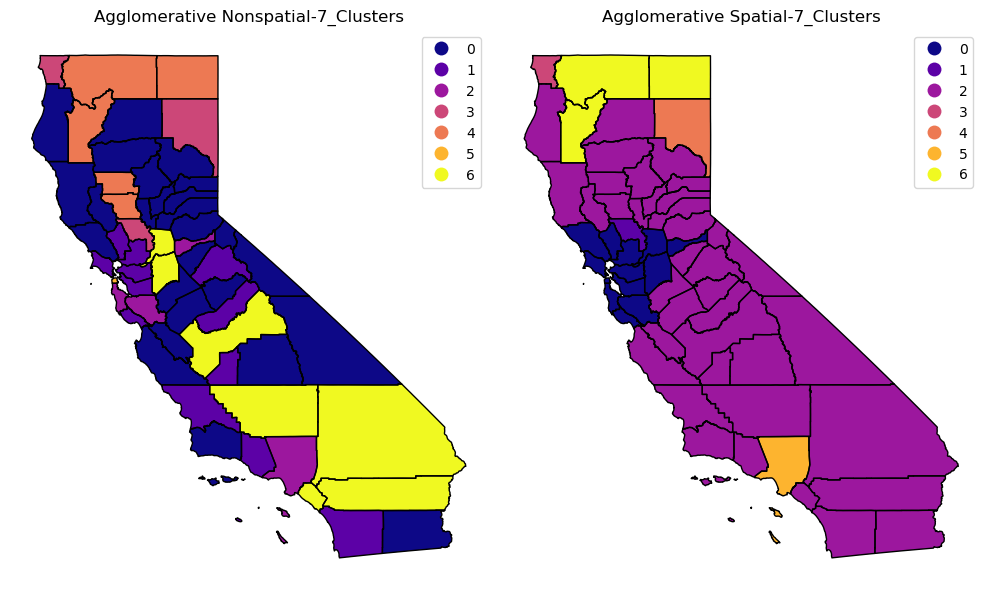

In [328]:
# Clustering Methods:
clust_list = ['Agglomerative Nonspatial-7_Clusters','Agglomerative Spatial-7_Clusters']

# Create figure and axes object with 1 row and 2 columns
# in which each column corresponds to each of clustering methods
fig,axes=plt.subplots(1,2,figsize=(10,16))

# Plot figure with 2 axes (subplots) showing clustering results
# Title of each axis is set to the name of clustering methods
for i, method in enumerate(clust_list): # for each of a list of clustering methods
    # plot a categorical (unique value) map of gdf
    CA_hivcovid4.plot(column=method, legend=True, categorical=True, ax=axes[i], cmap='plasma')
    CA_svi.plot(edgecolor='k', facecolor='None', ax=axes[i]) # plot boundaries of CA Counties
    axes[i].set_title(method) # set title for each axis
    axes[i].axis('off')     # turn off an axis

plt.tight_layout() #make tight layout

The results of the agglomerative clustering reveals several key insights into the features and and identifying key areas experiencing HIV infection, racial and ethnicity minority status, COVID infection, testing, and vaccination, and socioeconomic status. 7 clusters or 6 clusters revealed certain characteristics in terms of area and location specially in agglomerative spatial clustering. When the cluster analysis is implemented using non-spatial weights, as shown above, we cannot see any pattern in terms of location. However, for both 7 clusters and 7 clusters, when adding spatial weights, there are clear areas representing the intersection of the features. 

Focusing on the agglomerative spatial clusters with 7 clusters, based on the cluster map the main cluster areas include: Los Angeles (cluster 5), Bay Area + Sacramento (cluster 0), Siskyou, Modoc, and Trinity (cluster 6), Lassen (cluster 4), Del Norte (cluster 3), and the rest of california (cluster 2) representing purple. The results show that by applying spatial weights, we can clearly identify key areas in California that may be experiencing a higher social vulnerability in regards to racial and ethnic minority status, socieonomic status, and the spread of the HIV and COVID epidemics.  

Moreover, when comparing these spatial clusters, the clusters mirror the HH clusters obtained for HIV Infection and for racial/ethnic minority percentage. In advocating or targeting public health campaigns to promote HIV and COVID prevention at the intersection of race and ethnicity, these key areas can be used for specific demographic adovocacy. 

### Regionalization with Features 

To further understand our features, we will plot the agglomerative spatially constrained cluster maps to each of the 12 features along with violin plots showing their distributions.

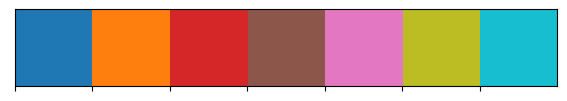

In [329]:
# set a color palette of seaborn that matches up cluster labels
colors=[sns.color_palette('tab10')[i] for i in [0,1,3,5,6,-2,-1]]
sns.palplot(colors)
sns.set_palette(colors)

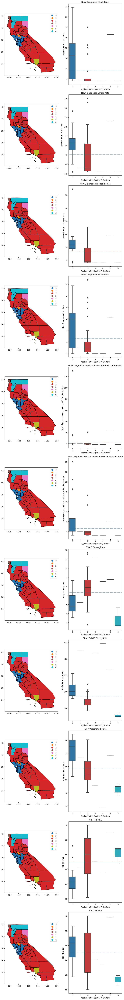

In [331]:
# Agglomerative spatially constrained cluster maps for features with boxplots 
# create a figure of 11 rows by 2 columns
fig,axes=plt.subplots(11,2,figsize=(10,80))

# for each of 11 explanatory variables
for i,col in enumerate(clust_feats):    
    # plot a cluster map in the first column in the ith row where i = 0,1,2,...,10    
    CA_hivcovid4.plot(column='Agglomerative Spatial-7_Clusters', legend=True, categorical=True, ax=axes[i,0])
    CA_svi.plot(edgecolor='k',facecolor='None',ax=axes[i,0])
    # plot a boxplot in the second column in the ith row
    sns.boxplot(x='Agglomerative Spatial-7_Clusters',y=col,data=CA_hivcovid4,ax=axes[i,1]) 
    # set a title to the second column in the ith row    
    axes[i,1].set_title(col, fontsize=12)
    # add a horizontal line at average of each explanatory variable
    axes[i,1].axhline(CA_hivcovid4[col].mean(),linestyle='--',alpha=0.5)

plt.tight_layout() #make tight layout

From the regionalization clusters, we can see that there are certain key areas for for each feature.<br> 

<B>For HIV Diagnoses Black</B>: there are two main clusters (cluster 0 in dark blue) and 2 in red. Cluster 0 represents the Bay Area where this poulation has clustered around. 

<B>For HIV Diagnoses White</B>: The clusters are similar to Blacks, there are two main clusters (cluster 0 in dark blue) and 2 in red. The main difference is the majority of the distribution falls in cluster 2, which represents various counties as shown in red in the map. 

<B>For HIV Diagnoses Hispanic</B>: The clusters are similar to Whites, there are two main clusters (cluster 0 in dark blue) and 2 in red. The majority of the distribution falls in cluster 2, which represents various counties as shown in red in the map. 

<B>For HIV Diagnoses Asian</B>: The clusters are similar to Blacks, there are two main clusters (cluster 0 in dark blue) and 2 in red. The majority of the distribution falls in cluster 0, which represents the Bay Area. 

<B>For HIV Diagnoses American Indian/Alaska Native Rate</B>: The distributions are significantly lower due to the lower population. There is only one main cluster (cluster 2 in red).

<B>For HIV Diagnoses Native Hawaiian/Pacific Islander</B>: The clusters are similar to Blacks, there are two main clusters (cluster 0 in dark blue) and 2 in red. The majority of the distribution falls in cluster 0, which represents the Bay Area. 

<B> For COVID Cases, Tests, and Vaccinations</B>: There are three main clusters including cluster 0 in dark blue representing the Bay Area, cluster 2 in red, and cluster 6 which represents counties in Northern California.

<B> Socioeonomic Status and Race/Ethnicity Status</B>: There are three main clusters including cluster 0 in dark blue representing the Bay Area, cluster 2 in red representing the majority, and cluster 6 which represents counties in Northern California.